# <span style="color:orange"> *Multiple bounded optimization* </span> 

In [1]:
%matplotlib inline
import nibabel as nib
import numpy as np
from scipy import optimize
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import subprocess
import sys
import pandas as pd
import os

 # <span style="color:lime"> *Repository & Tool loading* </span>
 Remember to check that it says the exact commit you should be working on </br>
 ### *This only needs to be run once, then the folder will be created*

In [2]:
%cd susceptibility-to-fieldmap-fft 
!git status
%pip install .

c:\Users\User\msc_project\sus-optimization\susceptibility-to-fieldmap-fft


c:\Users\User\miniconda3\envs\absFreq33\Lib\site-packages\IPython\core\magics\osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


HEAD detached at d9f785b
nothing to commit, working tree clean
Processing c:\users\user\msc_project\sus-optimization\susceptibility-to-fieldmap-fft
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for susceptibility-to-fieldmap-fft: filename=susceptibility_to_fieldmap_fft-0.0.0-py3-none-any.whl size=23543 sha256=8755cc54cfdaf218d058be4aa135b25c0986ea75f9058cb93a59d2bb8ba0e2c8
  Stored in directory: c:\users\user\appdata\local\pip\cache\wheels\76\2b\f9\862133fb7ad25c2aad966eb13c8d8caeb255ceff7b9ed004ca
Successfully built susceptibility-to-fieldmap-fft
Note: you may need to restart the kernel to use updated packages.


In [2]:
home_path = "C:/Users/User/msc_project/sus-optimization"
#Once we confirmed the head of the chi to fbfest we can go to home
%cd {home_path}
!ls

C:\Users\User\msc_project\sus-optimization


c:\Users\User\miniconda3\envs\absFreq32\Lib\site-packages\IPython\core\magics\osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


README.md
__pycache__
chi_calculator.ipynb
chi_opt_absFreq_dB32.ipynb
chi_opt_absFreq_dB33.ipynb
chi_opt_multiple.ipynb
chi_opt_multiple_custom_dmod.ipynb
chi_opt_pro.ipynb
chi_opt_pro_dB33.ipynb
data
evas_code.ipynb
fixed_chi_test.ipynb
internal_air_only.nii.gz
output
requirements.txt
simulation
soothsayer.ipynb
spinal_cord_voxels_only.nii.gz
sus_optimization.ipynb
susceptibility-to-fieldmap-fft
tissue-to-MRproperty
utils


In [3]:
path_to_chi_to_fm_fft = "C:/Users/User/msc_project/susceptibility-to-fieldmap-fft"
sys.path.append(path_to_chi_to_fm_fft)
#sys.path.append('/Users/evaalonsoortiz/Documents/python/susceptibility-to-fieldmap-fft/')
from functions import compute_fieldmap

In [4]:
# Function to automate the subprocess of extractiing measure with SCT through the terminal
from utils.extract_metric import extract_metrics
# This function is only useful if you want to print and display while optimizing
# Example of calling the function:
#extract_metrics(path_to_dmod_fm, path_to_dmod_mask, path_metric_mask, out_B0_metrics_path, method='wa', vert="3:15") # Change numbers x:y accordingly

## <span style="color:lime"> *Util functions used during the optimization process* </span> </br>
*Depracated*

In [4]:
# We need to reate the custom command that creates the fieldmap
def chi_to_fm_ppm(input_file, output_file):

    #Using a custom command for dB0 simulation

    command = [
    "compute_fieldmap",
    "-i", input_file,
    "-o", output_file,
    "-b", "50",
    "-m", "b0SimISMRM"
    ]

    # Run the command and capture output
    result = subprocess.run(command, capture_output=True, text=True)

    # We need to return the data from the fieldmap created

    
    # Check for errors
    if result.returncode != 0:
        print("Error occurred:", result.stderr)

    else:
        print("Fieldmap simulated correctly", result.stdout)
        sim_fm_img = nib.load(output_file)
        sim_fm_data = sim_fm_img.get_fdata()
        return sim_fm_data

In [7]:
#from utils.tools import chi_to_fm_ppm
# I believe this is unneeded, might delete laterxx

 # <span style="color:gold"> *Optimization begins!* </span> 

In [11]:
# First lets define the paths for simulation files
# Change run # to avoid mix of outputs per different optimization approach
path_to_iter_fms =  "E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms"
path_to_iter_metrics =  "E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics"
run_number = "run2_Powell"
path_to_iter_fms = os.path.join(path_to_iter_fms,run_number)
path_to_iter_metrics = os.path.join(path_to_iter_metrics,run_number)
counter = 0

########
# This don't change
path_to_sim_metric_mask = "E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz"
path_to_dmod_mask = "E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz"
path_to_chimap = "E:/msc_data/ismrm_2025/db0_032/fm/sim/B1_chi_maps/db0_032_sus_opt_map.nii.gz" # -4.2ppm internal air (past value)
path_to_segs = "E:/msc_data/ismrm_2025/db0_032/fm/chi-opt2/grouped_wb_segs.nii.gz"

In [12]:
path_to_raw_avg_resp = "E:/msc_data/ismrm_2025/db0_032/fm/C1_meas/raw_avg_respiration.csv"
avg_resp_b0meas_metrics_csv = pd.read_csv(path_to_raw_avg_resp)
avg_resp_b0meas_values = avg_resp_b0meas_metrics_csv["WA()"]
avg_resp_b0meas_values

0   -336.934179
1   -282.016301
2   -196.287115
3   -129.552748
4   -165.474514
5   -243.122739
6   -262.002827
7   -242.828776
8   -215.741987
9   -205.949069
Name: WA(), dtype: float64

In [7]:
vertebrae_levels = ['C5', 'C6', 'C7', 'T1', 'T2', 'T3', 'T4', 'T5', 'T6', 'T7'] # From 5 to 14
# This is used paired with the data above. Peak @: T1

In [8]:
central_freq_db0_032 = 123.249521 # in MHz
gamma_bar = 42.58 # MHz/T
# If the central frequency from the scanner is 123.249489 MHz, it meas the B0 strenght we need to simulate is:
B0_used_scanner = central_freq_db0_032 /gamma_bar
print("The B0 to use in the simulation should be: ", B0_used_scanner, "T")

The B0 to use in the simulation should be:  2.894540183184594 T


In [9]:
# For convergence plot testing
history = [] 

In [10]:
def f_iair_avg_resp_plot(x):

    global counter # This works? 
    
    counter += 1  
    print('################')
    print(f"Iteration #{counter}")
    print(f"Chi air : x[0] = {x[0]}")
    #print(f"Current values of variables: x[0] = {x[0]}, x[1] = {x[1]} & x[2] = {x[2]}")

    # Load the simulated susceptibility map in ppm
    sim_chi_img = nib.load(path_to_chimap)
    sim_chi_data = sim_chi_img.get_fdata()

    # Load segmentation labels that create the chimaps
    ROI_img = nib.load(path_to_segs)
    ROI_data = ROI_img.get_fdata()

    # Now we load the demodulation mask, which in this case is also the Spinal cord mask, can change
    dmod_mask_img = nib.load(path_to_dmod_mask)
    dmod_mask_data = dmod_mask_img.get_fdata()

    # Find indices with the labels we want to iterate!
    ind_trachea = np.where((ROI_data == 8))
    ind_lungs = np.where((ROI_data == 7))
    #ind_body = np.where((ROI_data == 2))
    #ind_bone = np.where((ROI_data == 3))
    
    # Assign variables 
    # Now we get only 1 value 
    chi_trachea = 0.1*(-9) + 0.9*(x[0])
    chi_lungs = 0.2*(-9) + 0.8*(x[0])

    sim_chi_data[ind_trachea] = chi_trachea
    sim_chi_data[ind_lungs] = chi_lungs
    #sim_chi_data[ind_body] = x[2]
    #sim_chi_data[ind_bone] = x[3]

    # Now we gotta compute the B0 distribution in [ppm] using compute_bz from repository
    # Lets load the chi map with load_sus_dist from compute fieldmap to get the image res for FBFest
    chi_dist, image_res, affine_matrix = compute_fieldmap.load_sus_dist(path_to_chimap)

    sim_b0_ppm =  compute_fieldmap.compute_bz(sim_chi_data, image_resolution = image_res, buffer = 50,mode = "b0SimISMRM")
    # bz will be in [ppm] we go to Hz now
    sim_b0_Hz = sim_b0_ppm * 3 * 42.58 # deltaB0 [Hz] = dB0 [ppm] * 1e-6  * B0 [T] * 42.58* e6 [Hz/T] 

    # Chi[0] trachea and Chi[1] lung
    chi_air = x[0]
    #chi3 = x[2]
    
    chi1_name = str(str(float(f"{chi_trachea:.3f}"))).replace(".","_") # to take away the minus sign can use .strip("-")) at the end
    chi2_name = str(str(float(f"{chi_lungs:.3f}"))).replace(".","_")
    chi_3_name = str(str(float(f"{chi_air:.3f}"))).replace(".","_")

    # Just in case you want to check the chimaps created: ###################################
    chi_map_name = f"chimap_tr_{chi1_name}_l_{chi2_name}_air_{chi_3_name}_Hz.nii.gz"
    # Load where you want to save them, and dont forget to use the same run number :)
    # And don't forget to actually create the run# folder 
    path_to_iterchimaps = "E:/msc_data/ismrm_2025/db0_032/fm/chi-opt/chimaps_extra/run14"
    chimap_img = nib.Nifti1Image(sim_chi_data, affine = sim_chi_img.affine)
    chimap_save_dir = os.path.join(path_to_iterchimaps, chi_map_name)
    nib.save(chimap_img, chimap_save_dir)
    ##########################################################################################

    dmod_fm_name = f"dmod_sim_fm_tr_{chi1_name}_l_{chi2_name}_air_{chi_3_name}_Hz.nii.gz" # First lets try 2, then 3 different for body with IMC prior
    #dmod_fm_name = f"dmod_sim_fm_tr_{chi1_name}_l_{chi2_name}_bd_{chi3_name}_Hz.nii.gz"
    path_to_dmod_fm = os.path.join(path_to_iter_dmod_fms, dmod_fm_name)

    # Now we need to demodulated the fieldmap 

    dmod_value = np.mean(sim_b0_Hz[dmod_mask_data == 1])
    print("Demod value for Simulation: ", dmod_value)
    dmod_sim_b0_Hz = sim_b0_Hz - dmod_value

    dmod_sim_b0_Hz_img = nib.Nifti1Image(dmod_sim_b0_Hz, affine = sim_chi_img.affine)
    nib.save(dmod_sim_b0_Hz_img, path_to_dmod_fm)
    print("Saving dmod FM... ", dmod_fm_name)

    # Now we extract metrics 
    metrics_name = f"metrics_sim_fm_tr_{chi1_name}_l_{chi2_name}_air_{chi_3_name}_Hz.csv"
    #metrics_name = f"metrics_sim_fm_tr_{chi1_name}_l_{chi2_name}_bd_{chi3_name}_Hz.csv"
    path_to_out_metrics = os.path.join(path_to_iter_metrics,metrics_name)

    extract_metrics(path_to_dmod_fm, path_to_dmod_mask, path_to_sim_metric_mask, path_to_out_metrics, method='wa', vert="3:15")

    metric_values = pd.read_csv(path_to_out_metrics)
    dmod_sim_vert_values = metric_values['WA()'][::-1]

    difference = np.linalg.norm(avg_resp_b0meas_values - dmod_sim_vert_values )
    print("Minimizing difference: ", difference)

    vertebrae_levels = ['C3', 'C4', 'C5', 'C6', 'C7', 'T1', 'T2', 'T3', 'T4', 'T5', 'T6', 'T7','T8']

    plt.clf() # Clear the plot to only have 1 in the output
    plt.plot(vertebrae_levels, dmod_sim_vert_values, marker = 'o', linestyle = '--', label = f"Run14 iter: {counter}", color = "#EF9A9A")  
    plt.plot(vertebrae_levels, avg_resp_b0meas_values, marker = 'o', linestyle = '-', label = "Avg resp", color = "#264cff") 
    plt.title(f"Sim vs Avg $\\chi$ tr: {chi1_name} & l: {chi2_name} & air: {chi_3_name}")
    plt.xlabel('Vertebral Level', fontsize=12)
    plt.ylabel('B0 [Hz]', fontsize=12)
    plt.legend()

    yticks = range(-250, 101, 20) 
    plt.yticks(yticks)

    plt.grid(True, which='both', linestyle='--', linewidth=0.7)
    plt.tight_layout()

# Show the plot
    plt.show()


    return difference

In [10]:
vert = "5:14"

if vert == "5:14":
    vertebrae_levels = ['C5', 'C6', 'C7', 'T1', 'T2', 'T3', 'T4', 'T5', 'T6', 'T7'] # From 5 to 14
if vert == "4:14":
    vertebrae_levels = ['C4','C5', 'C6', 'C7', 'T1', 'T2', 'T3', 'T4', 'T5', 'T6', 'T7'] # From 5 to 14

In [13]:
def f_iair_vol_avg_resp_plot(x):

    global counter # This works? 
    
    counter += 1  
    print('$$$$$$$$$$$$$$$$$$$$$$$$$')
    print(f"Iteration #{counter}")
    print(f"Chi internal air = 0.27")
    print(f"Vol_air Tr:  {x[0]}")
    print(f"Vol_air_lungs: {x[1]}")
    #print(f"Current values of variables: x[0] = {x[0]}, x[1] = {x[1]} & x[2] = {x[2]}")

    # Load the simulated susceptibility map in ppm
    sim_chi_img = nib.load(path_to_chimap)
    sim_chi_data = sim_chi_img.get_fdata()

    # Load segmentation labels that create the chimaps
    ROI_img = nib.load(path_to_segs)
    ROI_data = ROI_img.get_fdata()

    # Find indices with the labels we want to update
    ind_trachea = np.where((ROI_data == 8))
    ind_lungs = np.where((ROI_data == 7))
    #ind_body = np.where((ROI_data == 2))
    #ind_bone = np.where((ROI_data == 3))
    
    # Assign variables 
    # Now we get only 1 value 
    chi_internal_air = 0.27 # ppm in SI units 
    chi_trachea = (1-x[0])*(-9) + (x[0])*(chi_internal_air)
    chi_lungs = (1-x[1])*(-9) + (x[1])*(chi_internal_air)

    sim_chi_data[ind_trachea] = chi_trachea
    sim_chi_data[ind_lungs] = chi_lungs
    #sim_chi_data[ind_body] = x[2]
    #sim_chi_data[ind_bone] = x[3]

    # Now we gotta compute the B0 distribution in [ppm] using compute_bz from repository
    # Lets load the chi map with load_sus_dist from compute fieldmap to get the image res for FBFest
    chi_dist, image_res, affine_matrix = compute_fieldmap.load_sus_dist(path_to_chimap)

    sim_b0_ppm =  compute_fieldmap.compute_bz(sim_chi_data, image_resolution = image_res, buffer = 50) #, mode = "b0SimISMRM")
    # bz will be in [ppm] we go to Hz now
    sim_b0_Hz = sim_b0_ppm * central_freq_db0_032
    
    chi1_name = str(str(float(f"{chi_trachea:.3f}"))).replace(".","_") # to take away the minus sign can use .strip("-")) at the end
    chi2_name = str(str(float(f"{chi_lungs:.3f}"))).replace(".","_")
    #chi_3_name = str(str(float(f"{chi_internal_air:.3f}"))).replace(".","_")

    # Just in case you want to check the chimaps created: ###################################
    #chi_map_name = f"chimap_tr_{chi1_name}_l_{chi2_name}_Hz.nii.gz"
    # Load where you want to save them, and dont forget to use the same run number :)
    # And don't forget to actually create the run# folder 
    #path_to_iterchimaps = "E:/msc_data/ismrm_2025/db0_032/fm/chi-opt/chimaps_extra/run14"
    #chimap_img = nib.Nifti1Image(sim_chi_data, affine = sim_chi_img.affine)
    #chimap_save_dir = os.path.join(path_to_iterchimaps, chi_map_name)
    #nib.save(chimap_img, chimap_save_dir)
    ##########################################################################################
    sim_b0_Hz_name = f"sim_fm_tr_{chi1_name}_l_{chi2_name}_Hz.nii.gz"
    iter_fm_save_dir = os.path.join(path_to_iter_fms, sim_b0_Hz_name)
    sim_b0_Hz_img = nib.Nifti1Image(sim_b0_Hz, affine = sim_chi_img.affine )
    nib.save(sim_b0_Hz_img, iter_fm_save_dir)

    # Now we extract metrics 
    metrics_name = f"metrics_sim_fm_tr_{chi1_name}_l_{chi2_name}_Hz.csv"
    #metrics_name = f"metrics_sim_fm_tr_{chi1_name}_l_{chi2_name}_bd_{chi3_name}_Hz.csv"
    path_to_out_metrics = os.path.join(path_to_iter_metrics, metrics_name)


    extract_metrics(iter_fm_save_dir, path_to_dmod_mask, path_to_sim_metric_mask, path_to_out_metrics, method = 'wa', vert = vert)

    metric_values = pd.read_csv(path_to_out_metrics)
    sim_fm_vert_values = metric_values['WA()'][::-1]
    
    # This is a test to see if chi value changes

    #crop_sim_values = dmod_sim_vert_values.iloc[[0,4,7]].values
    #print("### Sim Cropped:")
    #print(crop_sim_values)
    #print(type(crop_sim_values))
    #crop_meas_values = avg_resp_b0meas_values.iloc[[0,4,7]].values


    # Dunno how to have options in the objective fucntion so this if is manual lmao
    #if norm_type == "L2":
    difference_l2 = np.linalg.norm(avg_resp_b0meas_values - sim_fm_vert_values ) # This is the L2 norm
    difference = difference_l2
    print("Difference: ", difference)

    #crop_dif =  np.linalg.norm(crop_sim_values - crop_meas_values)
    #crop_dif = np.sum(np.abs(crop_sim_values)-np.abs(crop_meas_values))
    #print("Minimizing difference - L1 Norm: ", crop_dif)
    #difference = crop_dif
    #elif norm_type == "L1":
    #difference_L1 = np.sum(np.abs(avg_resp_b0meas_values)- np.abs(dmod_sim_vert_values))
    #difference =difference_L1
    #print("Minimizing difference - L1 Norm: ", difference_L1)

    plt.clf() # Clear the plot to only have 1 in the output
    plt.plot(vertebrae_levels, sim_fm_vert_values, marker = 'o', linestyle = '--', label = f"Simulated", color = "#EF9A9A")  
    plt.plot(vertebrae_levels, avg_resp_b0meas_values, marker = 'o', linestyle = '-', label = "In-vivo measured", color = "#264cff") 
    plt.title(f"$\\chi$ of trachea: {chi1_name} & Lung: {chi2_name} with Powell method")
    plt.xlabel('Vertebral Level', fontsize=12)
    plt.ylabel('B0 [Hz]', fontsize=12)
    plt.legend()

    yticks = range(-450, 0, 30) 
    plt.yticks(yticks)

    plt.grid(True, which='both', linestyle='--', linewidth=0.7)
    plt.tight_layout()

# Show the plot
    plt.show()

# Trying to show convergence plot
    error = avg_resp_b0meas_values - sim_fm_vert_values
    loss = np.linalg.norm(error)
    history.append(loss)

    return difference

In [14]:
# Before running please verify your outpaths:
print(path_to_iter_fms)
print(path_to_iter_metrics)


E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell
E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell


In [15]:
# Reset counter if neceesary (alone verrsion)
# This should be done when defining new paths but sometimes can be overridden
# Use with care
counter


0

In [16]:
counter = 0
counter

0

 ### <span style="color:gold"> *Chi internal air!* </span> 

In *f_iair_vol_avg_resp_plot* : </br>
The internal value of chi is fixed to 0.27</br>
The second is the volume of trachea </br>
The third is the volume of lungs </br>
*Before running check if we use L1 or L2 norm, code auto-prints*

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #1
Chi internal air = 0.27
Vol_air Tr:  0.8
Vol_air_lungs: 0.5
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-1_584_l_-4_365_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-1_584_l_-4_365_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-1_584_l_-4_365_Hz.csv


Difference:  317.79483162193145


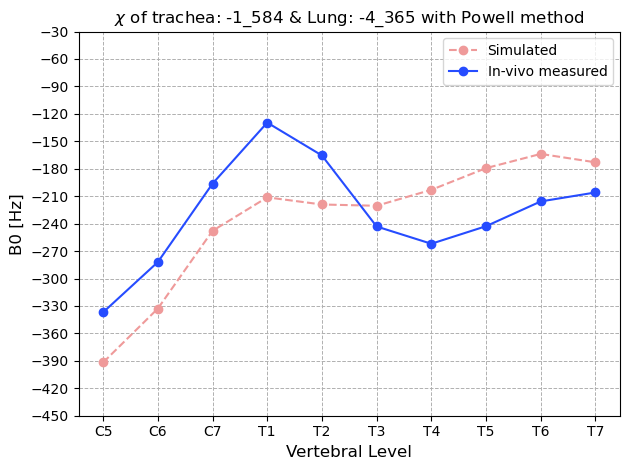

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #2
Chi internal air = 0.27
Vol_air Tr:  0.776393202250021
Vol_air_lungs: 0.5
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-1_803_l_-4_365_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-1_803_l_-4_365_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-1_803_l_-4_365_Hz.csv


Difference:  317.83499857965774


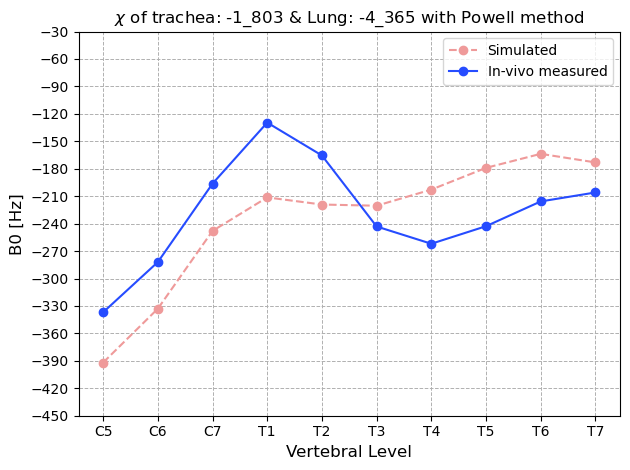

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #3
Chi internal air = 0.27
Vol_air Tr:  0.8236067977499789
Vol_air_lungs: 0.5
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-1_365_l_-4_365_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-1_365_l_-4_365_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-1_365_l_-4_365_Hz.csv


Difference:  317.75539219242523


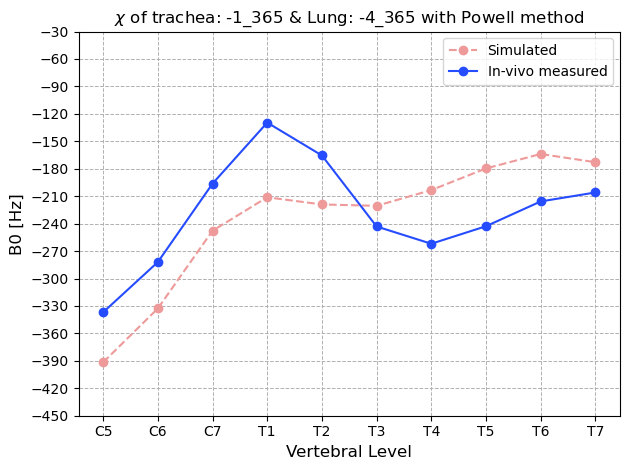

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #4
Chi internal air = 0.27
Vol_air Tr:  0.8527864045000421
Vol_air_lungs: 0.5
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-1_095_l_-4_365_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-1_095_l_-4_365_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-1_095_l_-4_365_Hz.csv


Difference:  317.7076481992889


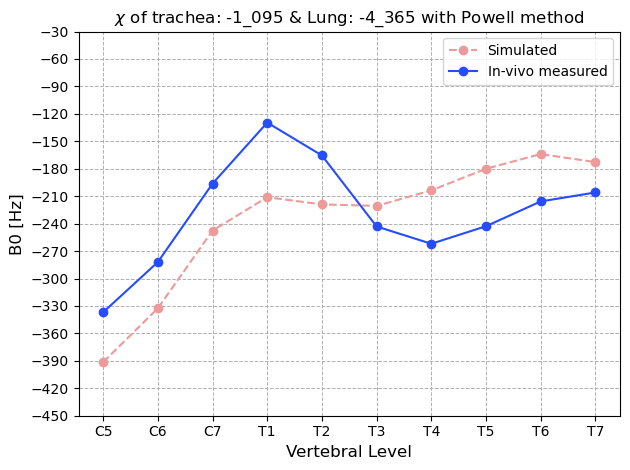

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #5
Chi internal air = 0.27
Vol_air Tr:  0.8708203932499369
Vol_air_lungs: 0.5
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_927_l_-4_365_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_927_l_-4_365_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_927_l_-4_365_Hz.csv


Difference:  317.6786969969358


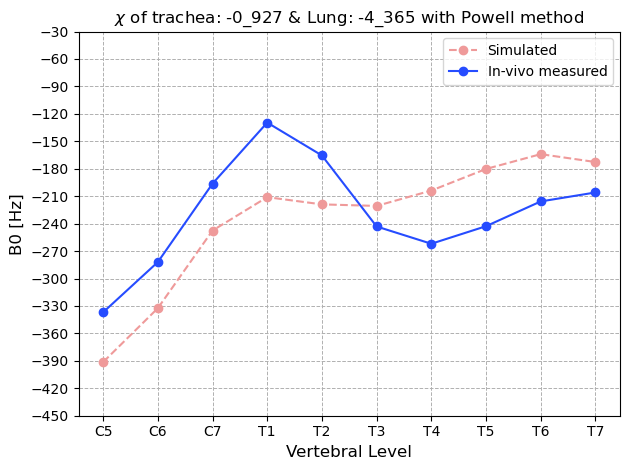

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #6
Chi internal air = 0.27
Vol_air Tr:  0.8819660112501051
Vol_air_lungs: 0.5
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_824_l_-4_365_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_824_l_-4_365_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_824_l_-4_365_Hz.csv


Difference:  317.661016685369


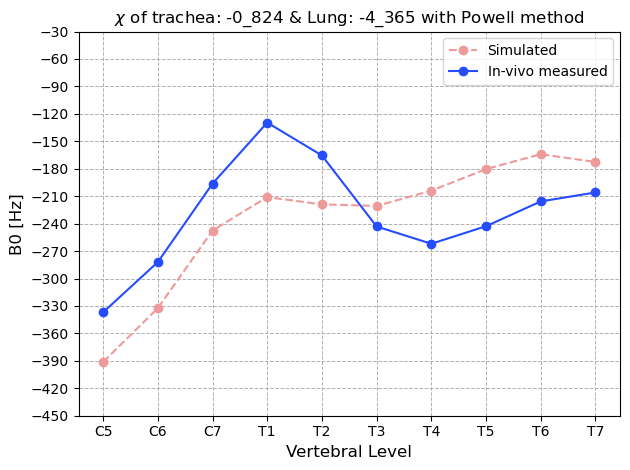

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #7
Chi internal air = 0.27
Vol_air Tr:  0.8888543819998318
Vol_air_lungs: 0.5
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_76_l_-4_365_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_76_l_-4_365_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_76_l_-4_365_Hz.csv


Difference:  317.6501708402423


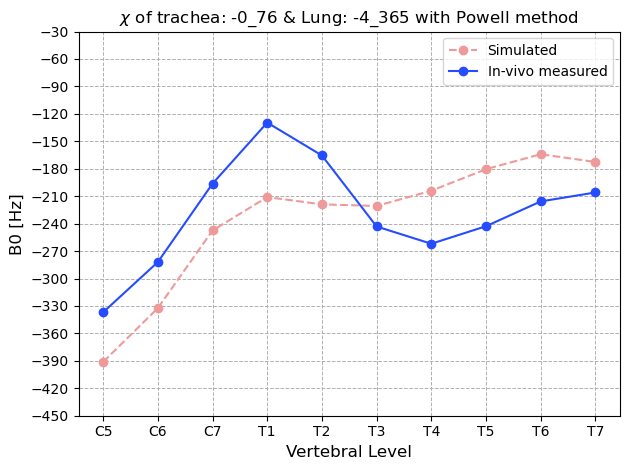

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #8
Chi internal air = 0.27
Vol_air Tr:  0.8931116292502734
Vol_air_lungs: 0.5
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_721_l_-4_365_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_721_l_-4_365_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_721_l_-4_365_Hz.csv


Difference:  317.6434987539404


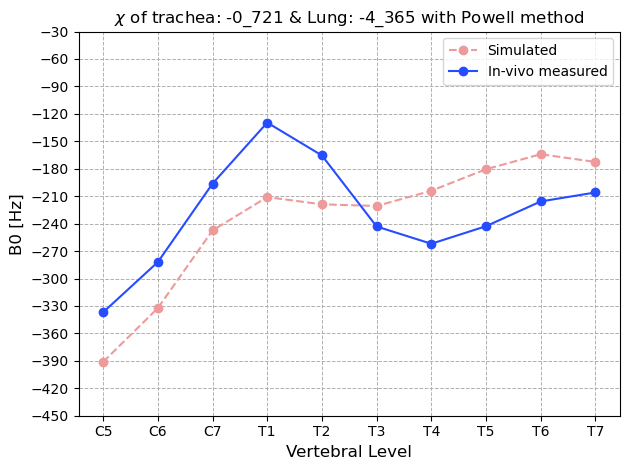

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #9
Chi internal air = 0.27
Vol_air Tr:  0.8957427527495584
Vol_air_lungs: 0.5
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_696_l_-4_365_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_696_l_-4_365_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_696_l_-4_365_Hz.csv


Difference:  317.63938702516754


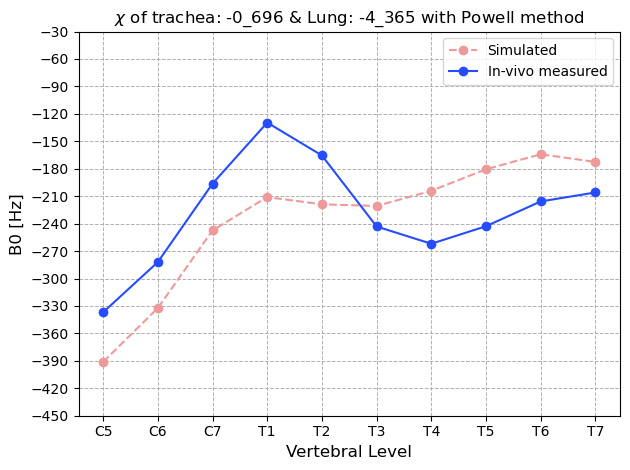

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #10
Chi internal air = 0.27
Vol_air Tr:  0.8973688765007151
Vol_air_lungs: 0.5
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_681_l_-4_365_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_681_l_-4_365_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_681_l_-4_365_Hz.csv


Difference:  317.6368503625035


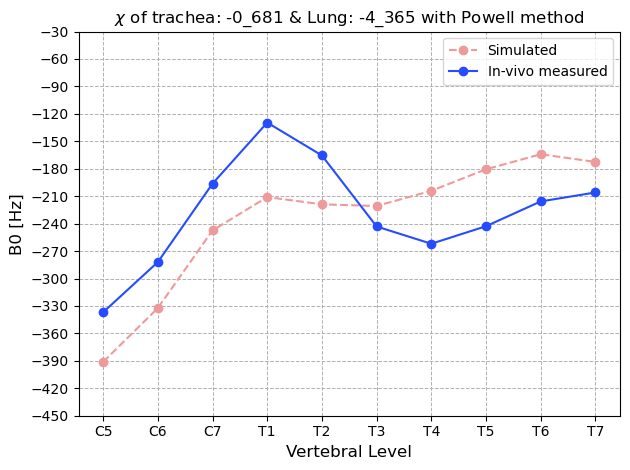

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #11
Chi internal air = 0.27
Vol_air Tr:  0.8983738762488434
Vol_air_lungs: 0.5
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_672_l_-4_365_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_672_l_-4_365_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_672_l_-4_365_Hz.csv


Difference:  317.63528434737964


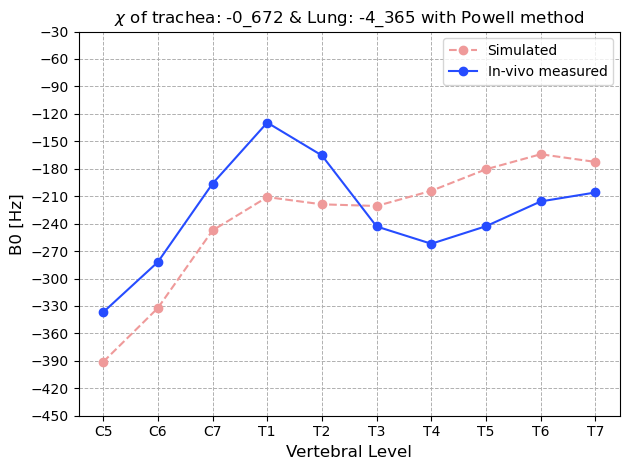

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #12
Chi internal air = 0.27
Vol_air Tr:  0.8989950002518717
Vol_air_lungs: 0.5
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_666_l_-4_365_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_666_l_-4_365_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_666_l_-4_365_Hz.csv


Difference:  317.6343171570908


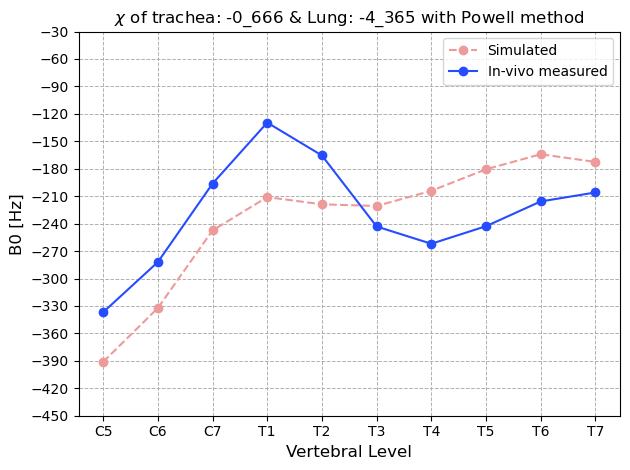

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #13
Chi internal air = 0.27
Vol_air Tr:  0.8993788759969716
Vol_air_lungs: 0.5
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_663_l_-4_365_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_663_l_-4_365_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_663_l_-4_365_Hz.csv


Difference:  317.6337196528276


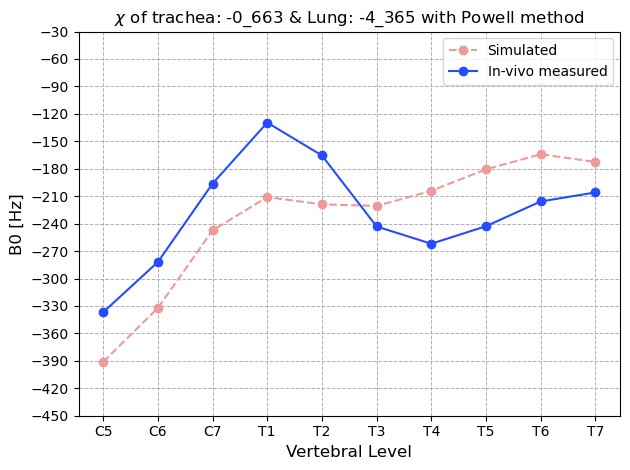

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #14
Chi internal air = 0.27
Vol_air Tr:  0.8996161242549001
Vol_air_lungs: 0.5
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_661_l_-4_365_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_661_l_-4_365_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_661_l_-4_365_Hz.csv


Difference:  317.6333504712203


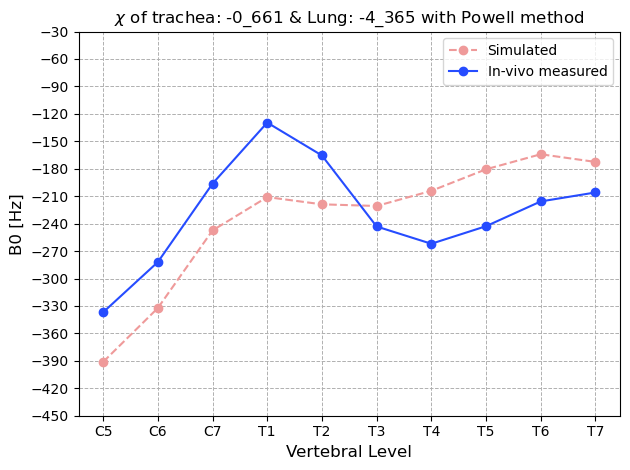

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #15
Chi internal air = 0.27
Vol_air Tr:  0.8997627517420715
Vol_air_lungs: 0.5
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_659_l_-4_365_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_659_l_-4_365_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_659_l_-4_365_Hz.csv


Difference:  317.6331223412362


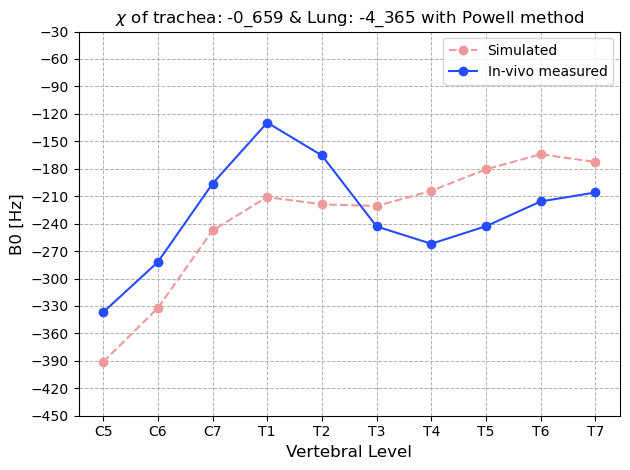

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #16
Chi internal air = 0.27
Vol_air Tr:  0.8998533725128286
Vol_air_lungs: 0.5
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_658_l_-4_365_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-4_365_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-4_365_Hz.csv


Difference:  317.6329813632073


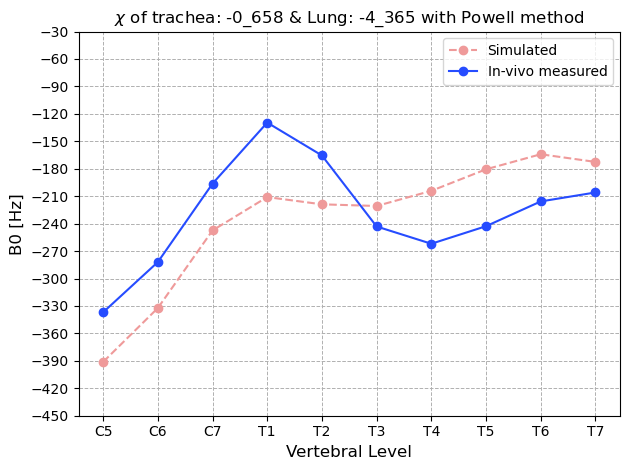

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #17
Chi internal air = 0.27
Vol_air Tr:  0.8999093792292431
Vol_air_lungs: 0.5
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_658_l_-4_365_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-4_365_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-4_365_Hz.csv


Difference:  317.6328942393626


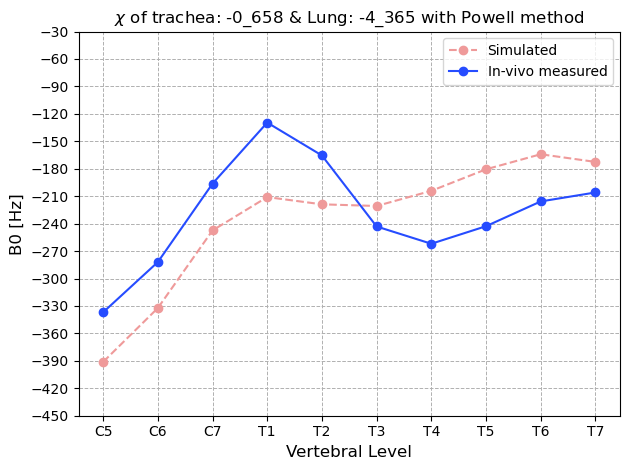

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #18
Chi internal air = 0.27
Vol_air Tr:  0.8999439932835855
Vol_air_lungs: 0.5
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_658_l_-4_365_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-4_365_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-4_365_Hz.csv


Difference:  317.6328403959159


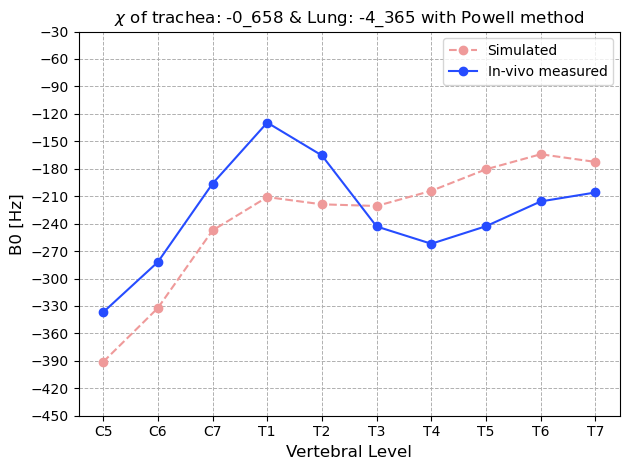

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #19
Chi internal air = 0.27
Vol_air Tr:  0.8999439932835855
Vol_air_lungs: 0.49098300562505254
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_658_l_-4_449_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-4_449_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-4_449_Hz.csv


Difference:  319.04713746446976


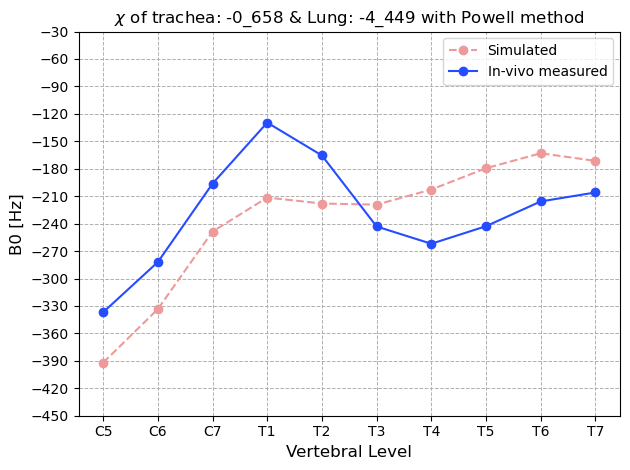

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #20
Chi internal air = 0.27
Vol_air Tr:  0.8999439932835855
Vol_air_lungs: 0.6090169943749474
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_658_l_-3_354_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-3_354_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-3_354_Hz.csv


Difference:  303.367117035993


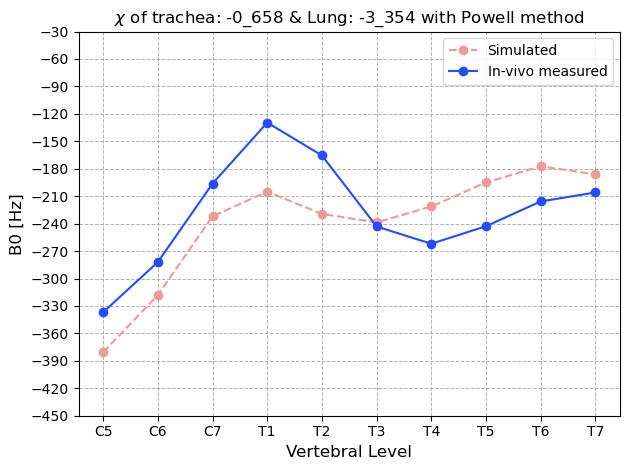

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #21
Chi internal air = 0.27
Vol_air Tr:  0.8999439932835855
Vol_air_lungs: 0.6819660112501051
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_658_l_-2_678_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-2_678_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-2_678_Hz.csv


Difference:  296.9768845237202


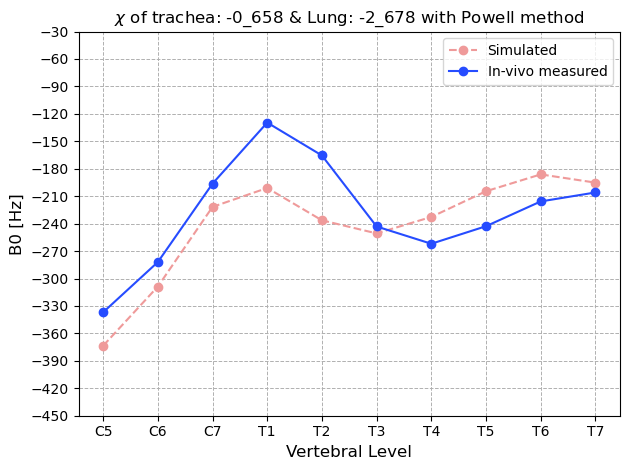

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #22
Chi internal air = 0.27
Vol_air Tr:  0.8999439932835855
Vol_air_lungs: 0.7270509831248423
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_658_l_-2_26_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-2_26_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-2_26_Hz.csv


Difference:  294.3855127372566


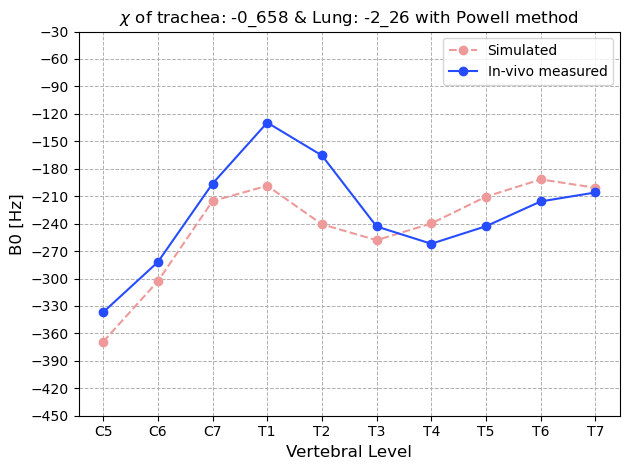

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #23
Chi internal air = 0.27
Vol_air Tr:  0.8999439932835855
Vol_air_lungs: 0.7549150281252629
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_658_l_-2_002_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-2_002_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-2_002_Hz.csv


Difference:  293.31898467899305


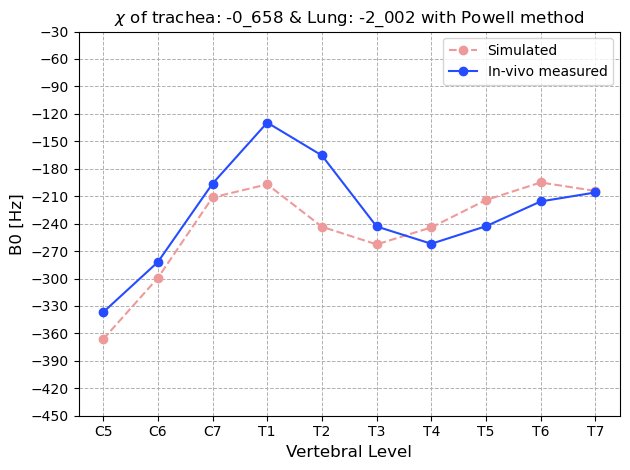

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #24
Chi internal air = 0.27
Vol_air Tr:  0.8999439932835855
Vol_air_lungs: 0.7721359549995794
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_658_l_-1_842_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_842_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_842_Hz.csv


Difference:  292.866835623966


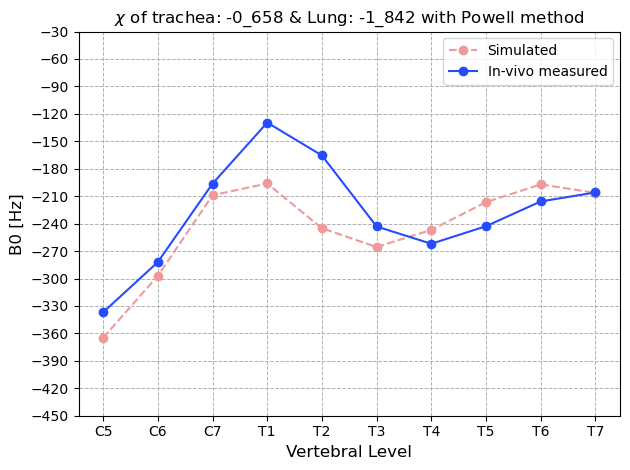

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #25
Chi internal air = 0.27
Vol_air Tr:  0.8999439932835855
Vol_air_lungs: 0.7827790731256835
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_658_l_-1_744_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_744_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_744_Hz.csv


Difference:  292.6668895512503


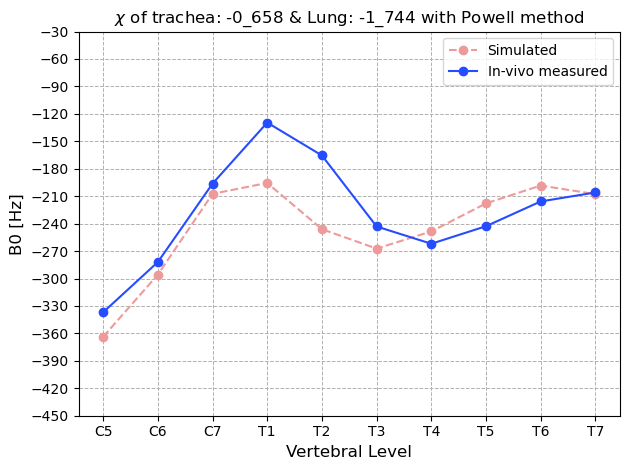

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #26
Chi internal air = 0.27
Vol_air Tr:  0.8999439932835855
Vol_air_lungs: 0.7893568818738959
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_658_l_-1_683_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_683_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_683_Hz.csv


Difference:  292.57375364490844


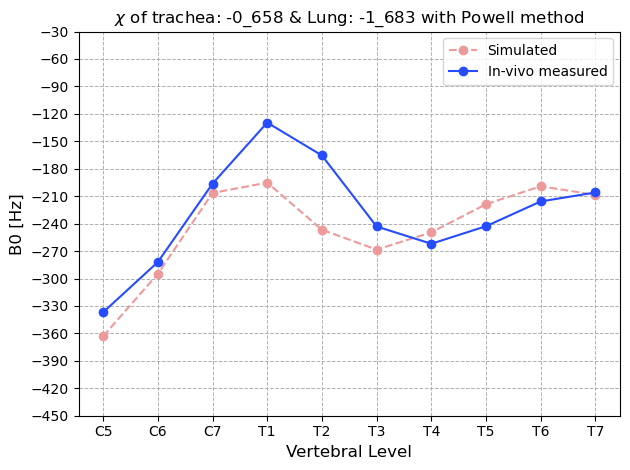

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #27
Chi internal air = 0.27
Vol_air Tr:  0.8999439932835855
Vol_air_lungs: 0.7934221912517876
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_658_l_-1_645_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_645_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_645_Hz.csv


Difference:  292.5278313296896


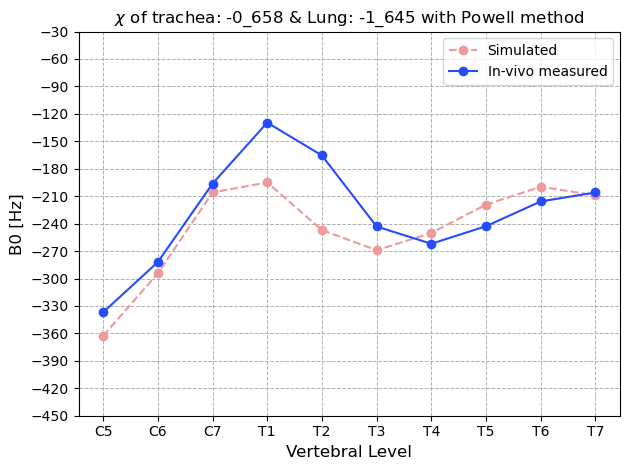

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #28
Chi internal air = 0.27
Vol_air Tr:  0.8999439932835855
Vol_air_lungs: 0.7959346906221083
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_658_l_-1_622_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_622_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_622_Hz.csv


Difference:  292.50389778746535


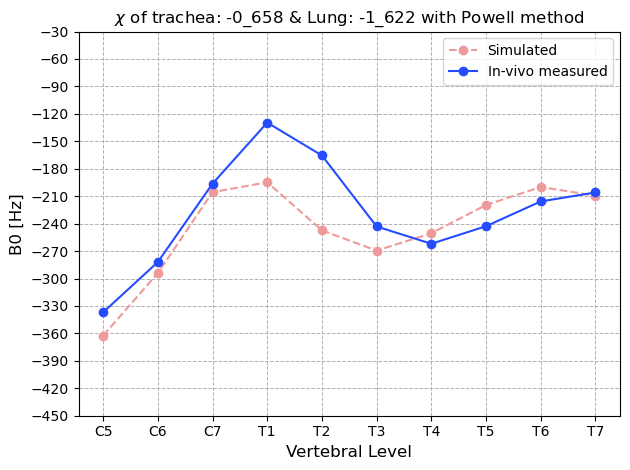

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #29
Chi internal air = 0.27
Vol_air Tr:  0.8999439932835855
Vol_air_lungs: 0.7974875006296793
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_658_l_-1_607_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_607_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_607_Hz.csv


Difference:  292.49080549917153


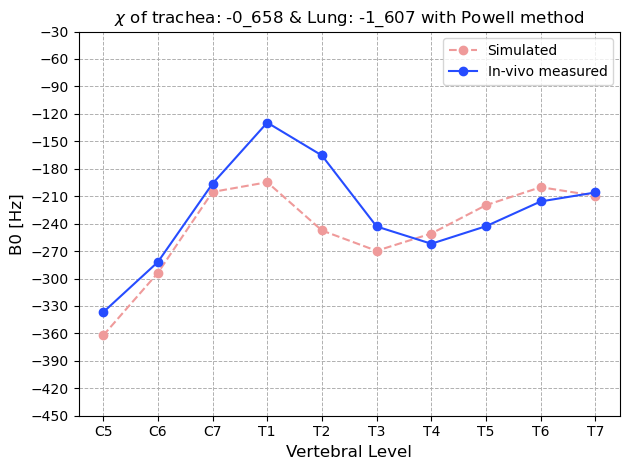

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #30
Chi internal air = 0.27
Vol_air Tr:  0.8999439932835855
Vol_air_lungs: 0.798447189992429
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_658_l_-1_598_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_598_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_598_Hz.csv


Difference:  292.48336325014577


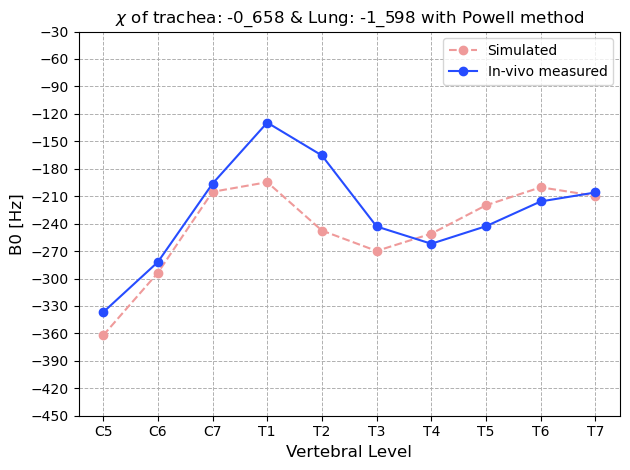

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #31
Chi internal air = 0.27
Vol_air Tr:  0.8999439932835855
Vol_air_lungs: 0.7990403106372502
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_658_l_-1_593_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_593_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_593_Hz.csv


Difference:  292.4790116918987


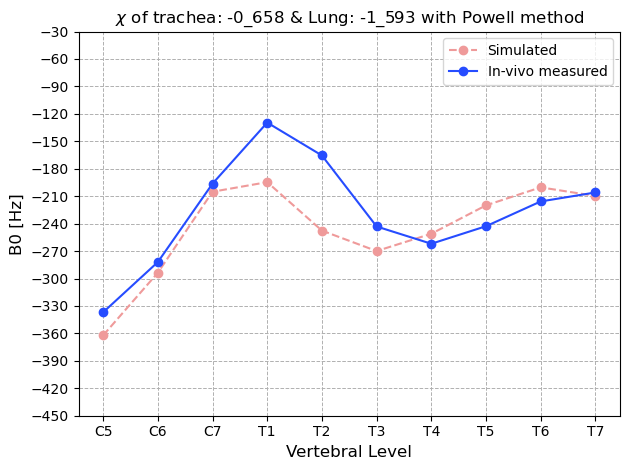

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #32
Chi internal air = 0.27
Vol_air Tr:  0.8999439932835855
Vol_air_lungs: 0.799406879355179
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_658_l_-1_589_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_589_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_589_Hz.csv


Difference:  292.4764170149374


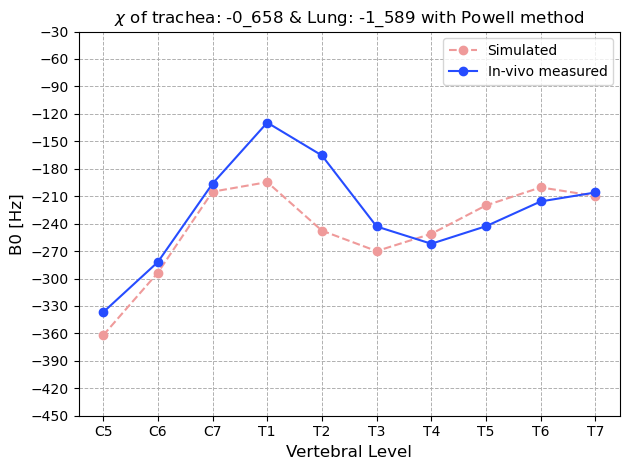

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #33
Chi internal air = 0.27
Vol_air Tr:  0.8999439932835855
Vol_air_lungs: 0.7996334312820714
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_658_l_-1_587_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_587_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_587_Hz.csv


Difference:  292.47484960257674


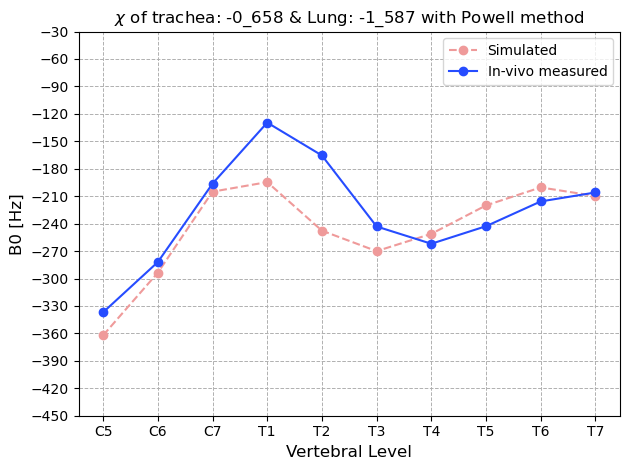

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #34
Chi internal air = 0.27
Vol_air Tr:  0.8999439932835855
Vol_air_lungs: 0.7997734480731076
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_658_l_-1_586_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_586_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_586_Hz.csv


Difference:  292.4738947105994


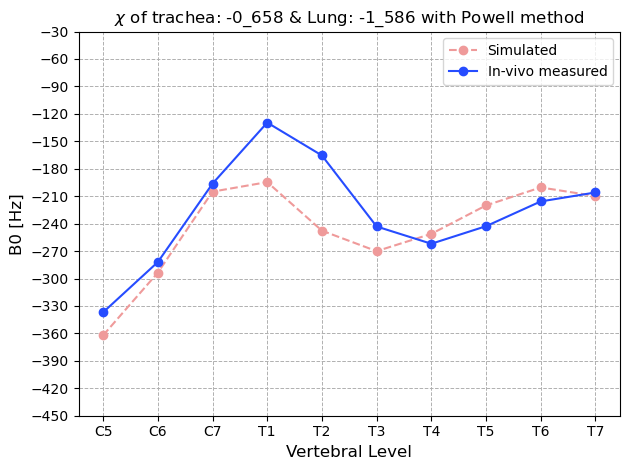

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #35
Chi internal air = 0.27
Vol_air Tr:  0.8999439932835855
Vol_air_lungs: 0.7998599832089637
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_658_l_-1_585_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_585_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_585_Hz.csv


Difference:  292.4733098345438


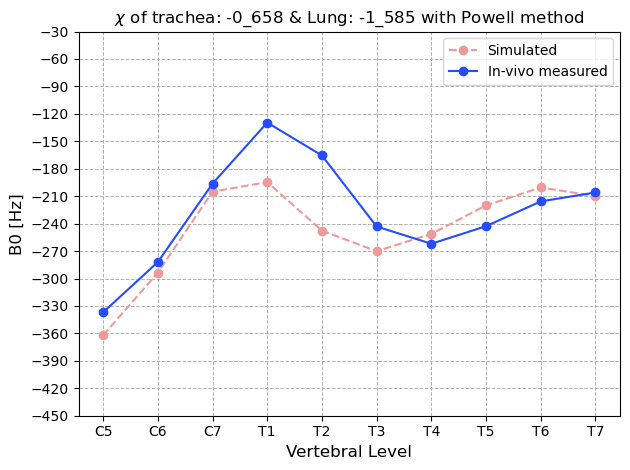

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #36
Chi internal air = 0.27
Vol_air Tr:  0.8999439932835855
Vol_air_lungs: 0.7999134648641439
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_658_l_-1_585_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_585_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_585_Hz.csv


Difference:  292.4729503779191


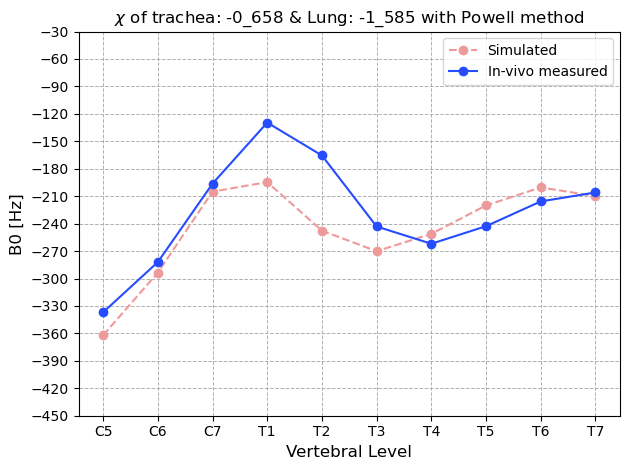

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #37
Chi internal air = 0.27
Vol_air Tr:  0.8999439932835855
Vol_air_lungs: 0.7999468026459128
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_658_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_584_Hz.csv


Difference:  292.47272709016124


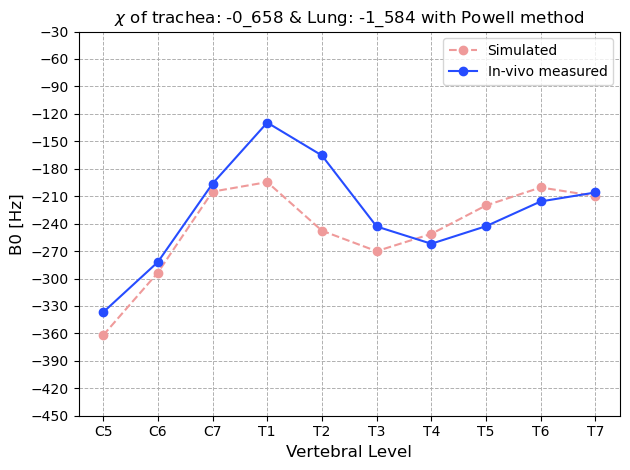

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #38
Chi internal air = 0.27
Vol_air Tr:  0.8999617189467788
Vol_air_lungs: 0.8
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_657_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_657_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_657_l_-1_584_Hz.csv


Difference:  292.47244291313206


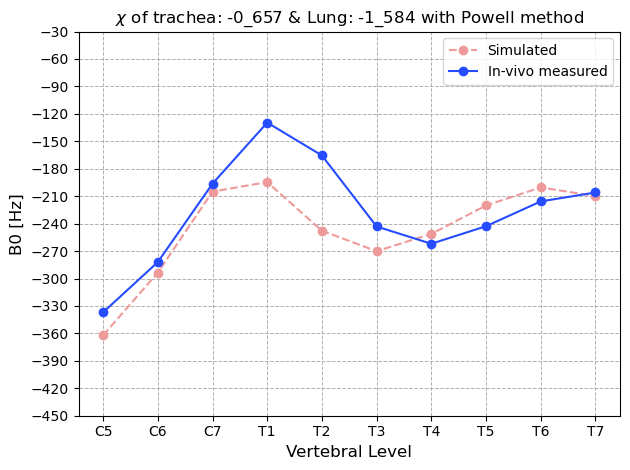

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #39
Chi internal air = 0.27
Vol_air Tr:  0.7969954858084894
Vol_air_lungs: 0.49098300562505254
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-1_612_l_-4_449_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-1_612_l_-4_449_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-1_612_l_-4_449_Hz.csv


Difference:  319.22958672386557


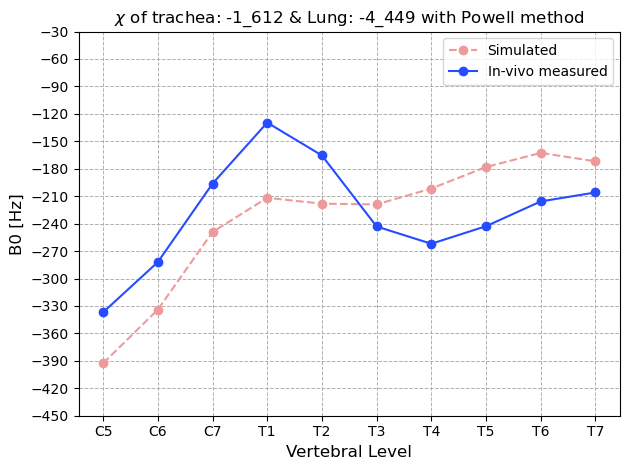

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #40
Chi internal air = 0.27
Vol_air Tr:  0.8363250871737702
Vol_air_lungs: 0.6090169943749474
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-1_247_l_-3_354_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-1_247_l_-3_354_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-1_247_l_-3_354_Hz.csv


Difference:  303.3467336872236


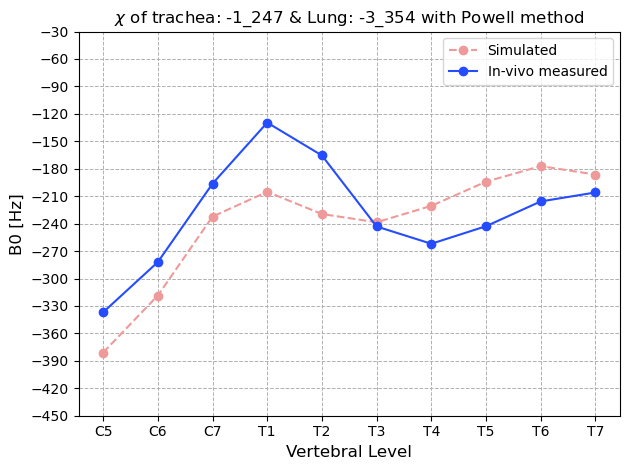

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #41
Chi internal air = 0.27
Vol_air Tr:  0.860632117581498
Vol_air_lungs: 0.6819660112501051
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-1_022_l_-2_678_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-1_022_l_-2_678_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-1_022_l_-2_678_Hz.csv


Difference:  296.9097876766999


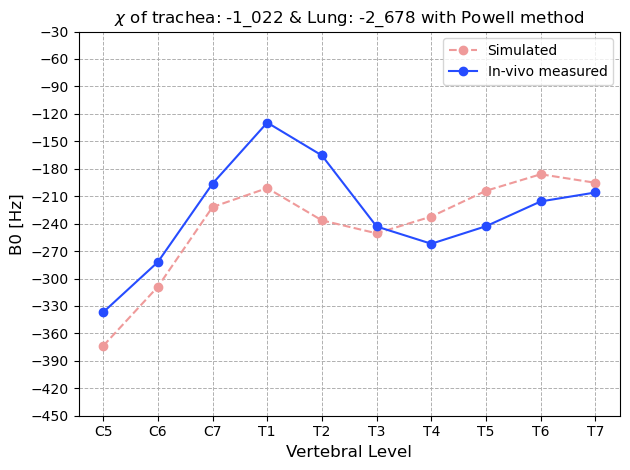

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #42
Chi internal air = 0.27
Vol_air Tr:  0.875654688539051
Vol_air_lungs: 0.7270509831248423
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_883_l_-2_26_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_883_l_-2_26_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_883_l_-2_26_Hz.csv


Difference:  294.32280134968636


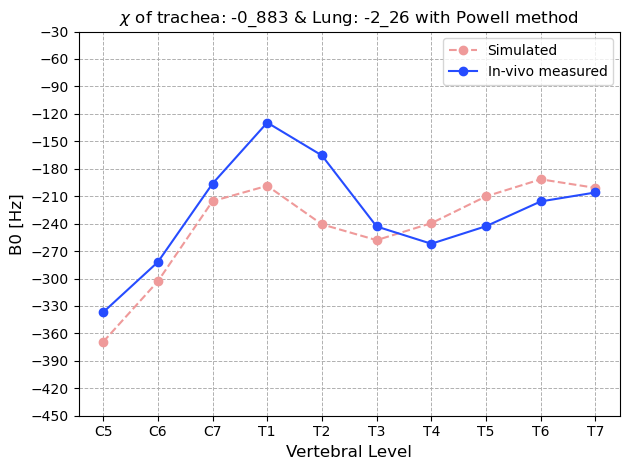

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #43
Chi internal air = 0.27
Vol_air Tr:  0.8849391479892258
Vol_air_lungs: 0.7549150281252629
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_797_l_-2_002_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_797_l_-2_002_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_797_l_-2_002_Hz.csv


Difference:  293.2721000450062


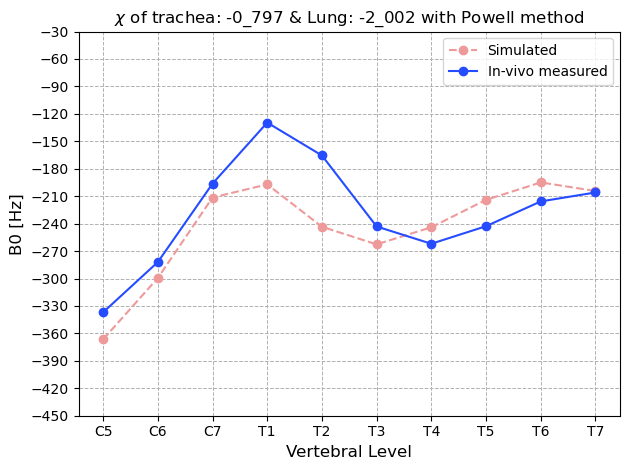

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #44
Chi internal air = 0.27
Vol_air Tr:  0.890677259496604
Vol_air_lungs: 0.7721359549995794
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_743_l_-1_842_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_743_l_-1_842_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_743_l_-1_842_Hz.csv


Difference:  292.8347766486027


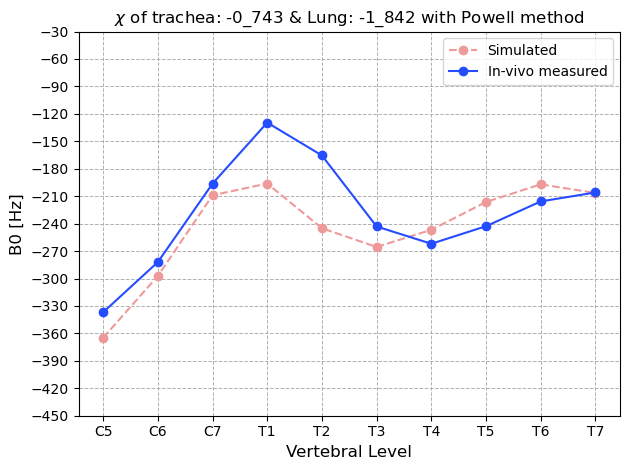

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #45
Chi internal air = 0.27
Vol_air Tr:  0.8942236074394007
Vol_air_lungs: 0.7827790731256835
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_711_l_-1_744_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_711_l_-1_744_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_711_l_-1_744_Hz.csv


Difference:  292.6459181356175


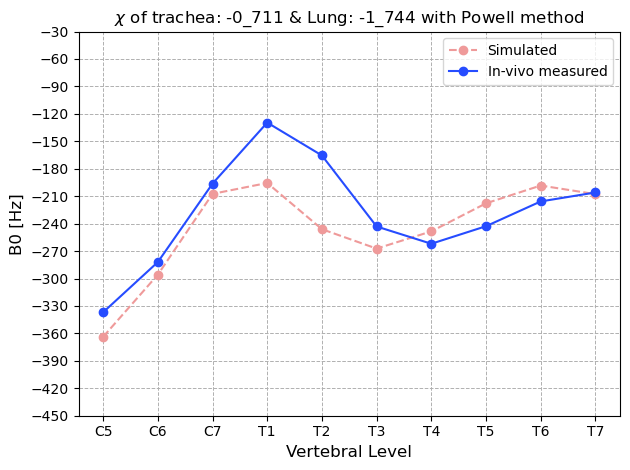

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #46
Chi internal air = 0.27
Vol_air Tr:  0.8964153710039822
Vol_air_lungs: 0.789356881873896
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_69_l_-1_683_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_69_l_-1_683_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_69_l_-1_683_Hz.csv


Difference:  292.56036799079106


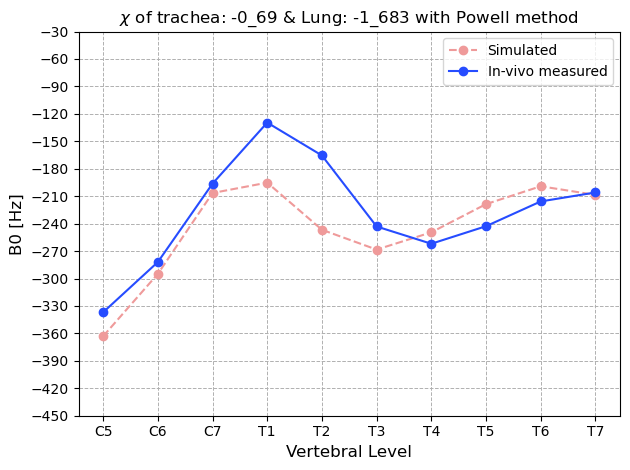

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #47
Chi internal air = 0.27
Vol_air Tr:  0.8977699553821973
Vol_air_lungs: 0.7934221912517876
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_678_l_-1_645_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_678_l_-1_645_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_678_l_-1_645_Hz.csv


Difference:  292.5194133455328


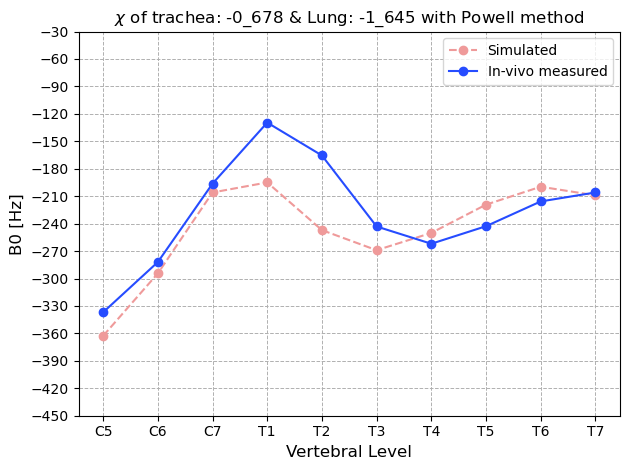

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #48
Chi internal air = 0.27
Vol_air Tr:  0.8986071345685638
Vol_air_lungs: 0.7959346906221084
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_67_l_-1_622_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_67_l_-1_622_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_67_l_-1_622_Hz.csv


Difference:  292.49865652727016


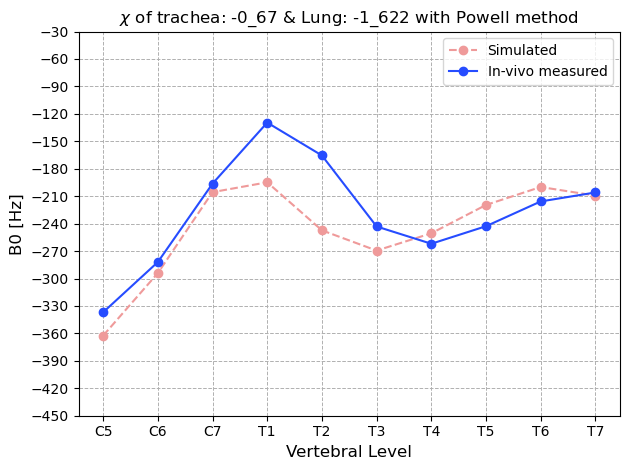

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #49
Chi internal air = 0.27
Vol_air Tr:  0.8991245397604123
Vol_air_lungs: 0.7974875006296793
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_665_l_-1_607_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_665_l_-1_607_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_665_l_-1_607_Hz.csv


Difference:  292.48756820554735


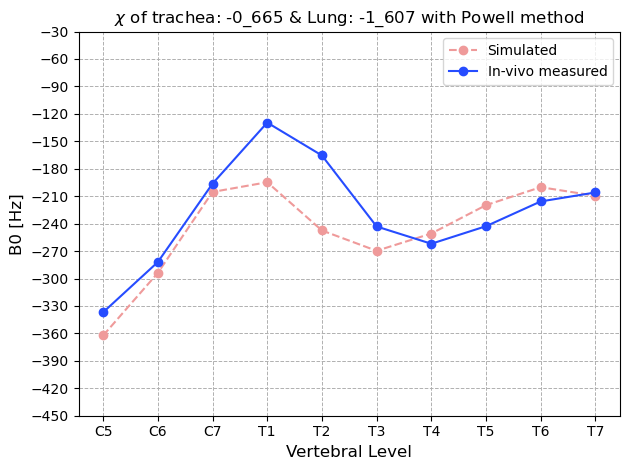

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #50
Chi internal air = 0.27
Vol_air Tr:  0.8994443137549303
Vol_air_lungs: 0.7984471899924291
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_662_l_-1_598_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_662_l_-1_598_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_662_l_-1_598_Hz.csv


Difference:  292.4813799879175


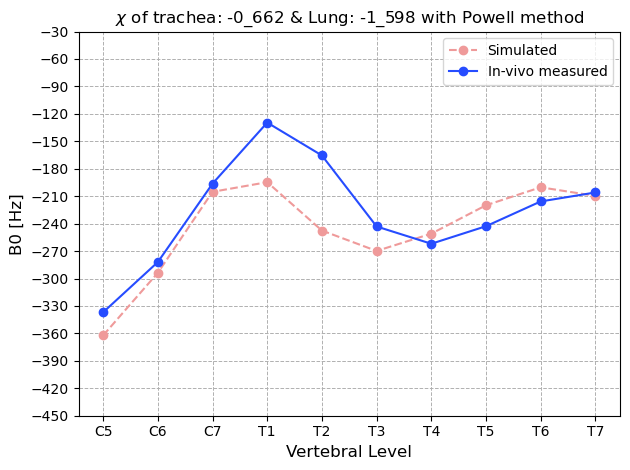

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #51
Chi internal air = 0.27
Vol_air Tr:  0.8996419449522608
Vol_air_lungs: 0.7990403106372502
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_66_l_-1_593_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_66_l_-1_593_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_66_l_-1_593_Hz.csv


Difference:  292.47780938571196


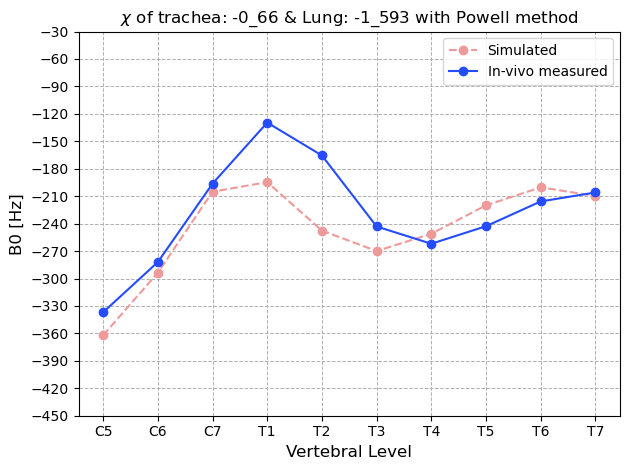

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #52
Chi internal air = 0.27
Vol_air Tr:  0.8997640877494484
Vol_air_lungs: 0.799406879355179
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_659_l_-1_589_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_659_l_-1_589_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_659_l_-1_589_Hz.csv


Difference:  292.4756996274105


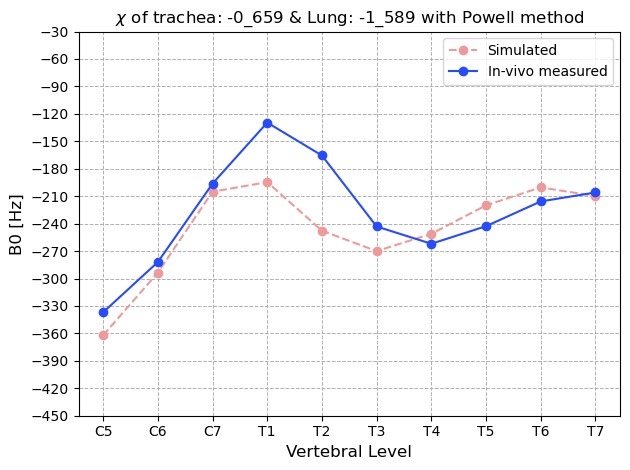

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #53
Chi internal air = 0.27
Vol_air Tr:  0.8998395761495912
Vol_air_lungs: 0.7996334312820713
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_658_l_-1_587_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_587_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_587_Hz.csv


Difference:  292.47443277482256


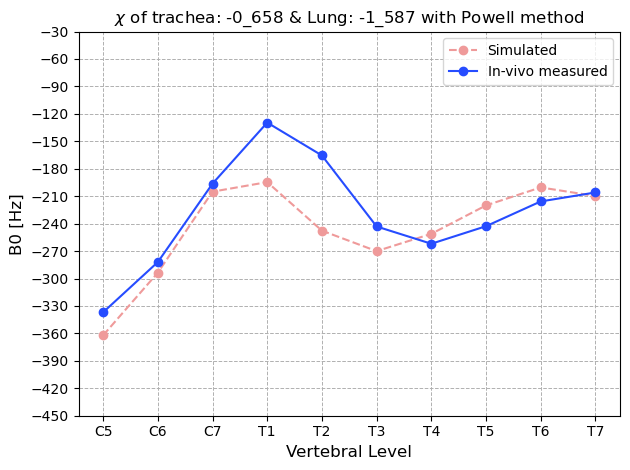

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #54
Chi internal air = 0.27
Vol_air Tr:  0.899886230546636
Vol_air_lungs: 0.7997734480731077
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_658_l_-1_586_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_586_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_586_Hz.csv


Difference:  292.4736639688093


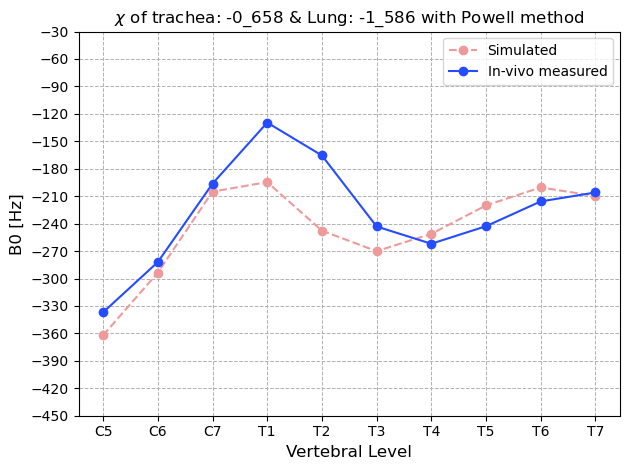

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #55
Chi internal air = 0.27
Vol_air Tr:  0.8999150645497341
Vol_air_lungs: 0.7998599832089638
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_658_l_-1_585_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_585_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_585_Hz.csv


Difference:  292.47319422617056


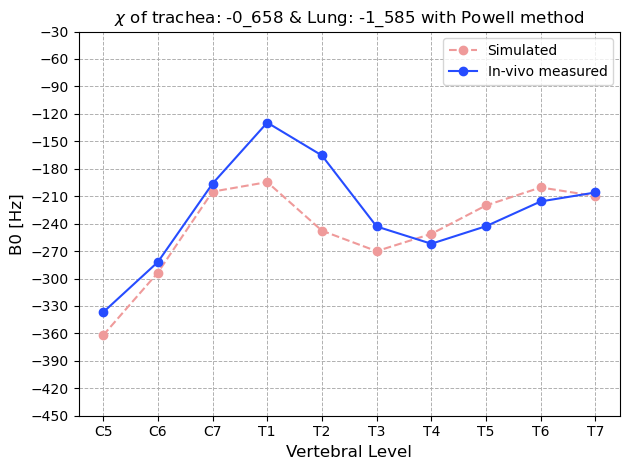

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #56
Chi internal air = 0.27
Vol_air Tr:  0.8999328849436806
Vol_air_lungs: 0.7999134648641439
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_658_l_-1_585_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_585_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_585_Hz.csv


Difference:  292.47290597402315


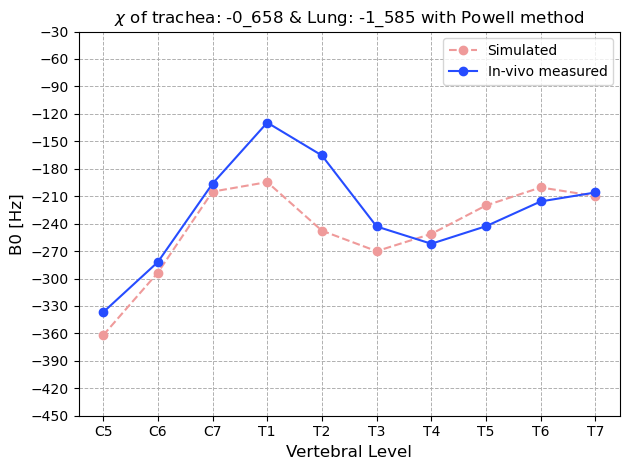

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #57
Chi internal air = 0.27
Vol_air Tr:  0.8999438985528324
Vol_air_lungs: 0.7999465183448199
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_658_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_658_l_-1_584_Hz.csv


Difference:  292.4727286130729


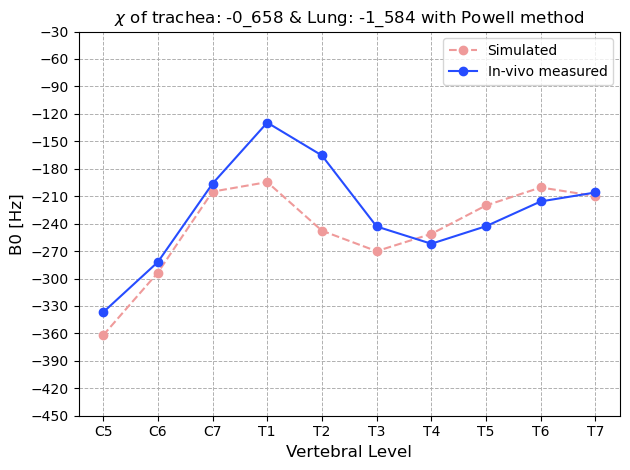

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #58
Chi internal air = 0.27
Vol_air Tr:  0.899950705337627
Vol_air_lungs: 0.7999669465193241
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_657_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_657_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_657_l_-1_584_Hz.csv


Difference:  292.4726192992247


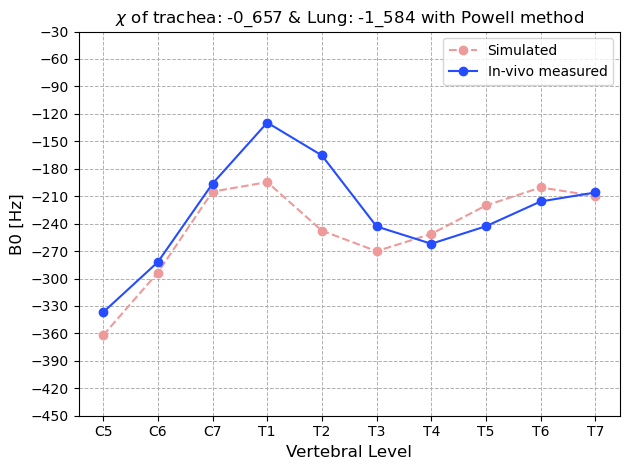

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #59
Chi internal air = 0.27
Vol_air Tr:  0.8999549121619842
Vol_air_lungs: 0.7999795718254958
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_657_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_657_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_657_l_-1_584_Hz.csv


Difference:  292.47255185461745


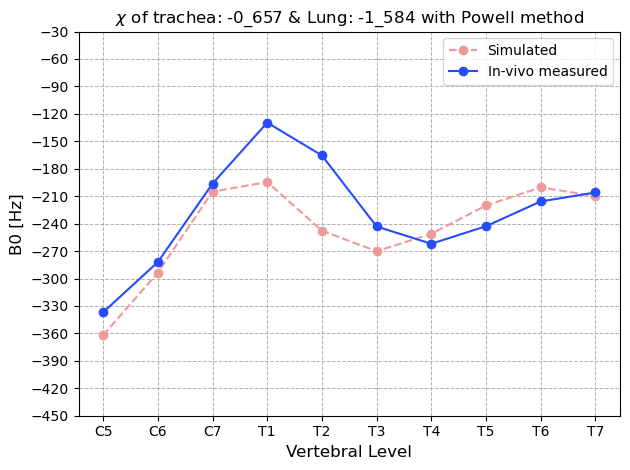

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #60
Chi internal air = 0.27
Vol_air Tr:  0.8999582436285889
Vol_air_lungs: 0.7999895700527367
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-0_657_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_657_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-0_657_l_-1_584_Hz.csv


Difference:  292.47249850628157


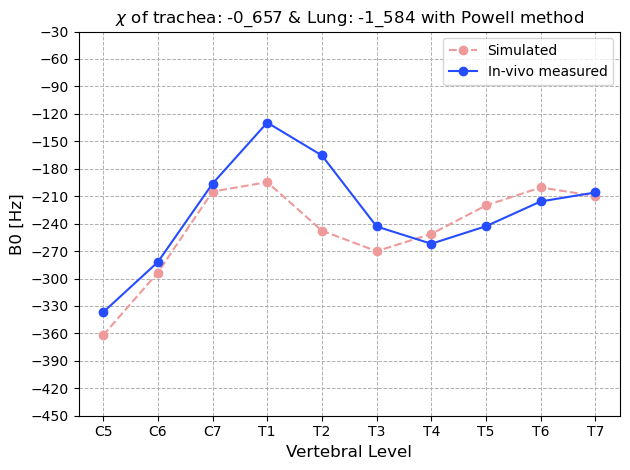

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #61
Chi internal air = 0.27
Vol_air Tr:  0.776393202250021
Vol_air_lungs: 0.7999895700527367
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-1_803_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-1_803_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-1_803_l_-1_584_Hz.csv


Difference:  291.98888719188216


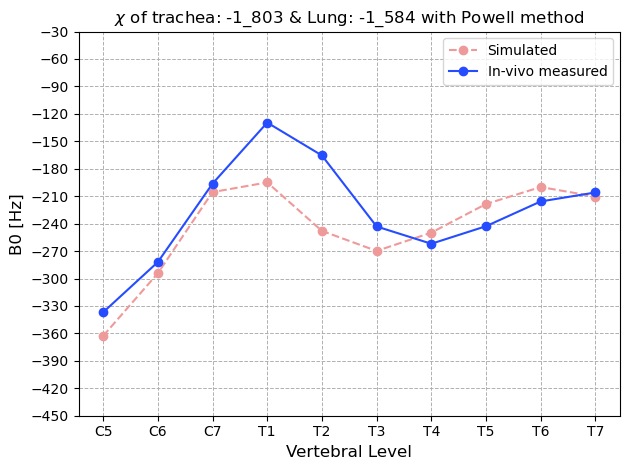

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #62
Chi internal air = 0.27
Vol_air Tr:  0.8236067977499789
Vol_air_lungs: 0.7999895700527367
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-1_365_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-1_365_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-1_365_l_-1_584_Hz.csv


Difference:  292.1711902607463


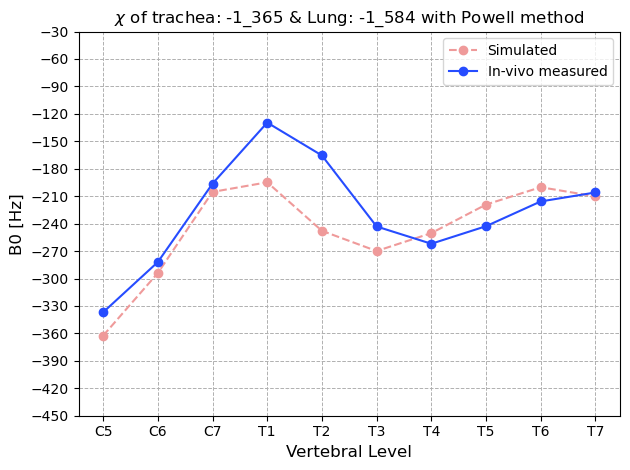

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #63
Chi internal air = 0.27
Vol_air Tr:  0.7472135954999579
Vol_air_lungs: 0.7999895700527367
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_073_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_073_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_073_l_-1_584_Hz.csv


Difference:  291.8777558849687


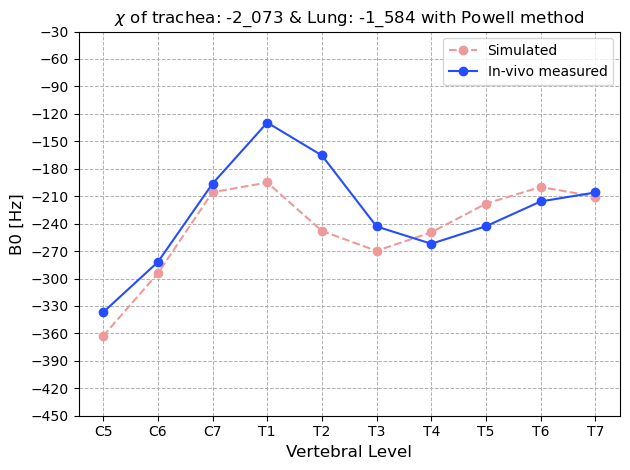

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #64
Chi internal air = 0.27
Vol_air Tr:  0.7291796067500631
Vol_air_lungs: 0.7999895700527367
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_241_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_241_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_241_l_-1_584_Hz.csv


Difference:  291.8096612208104


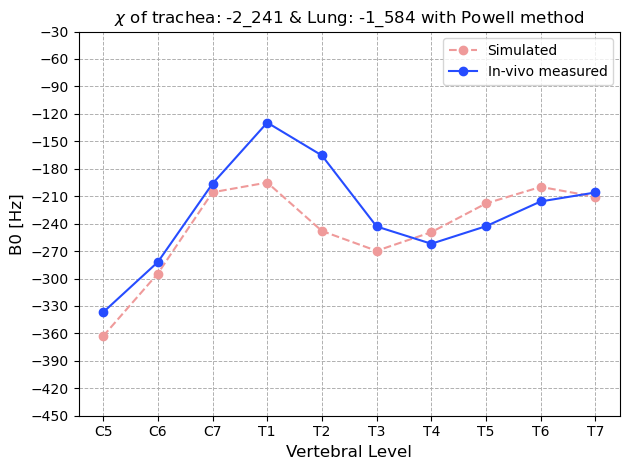

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #65
Chi internal air = 0.27
Vol_air Tr:  0.7180339887498948
Vol_air_lungs: 0.7999895700527367
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_344_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_344_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_344_l_-1_584_Hz.csv


Difference:  291.7678012694945


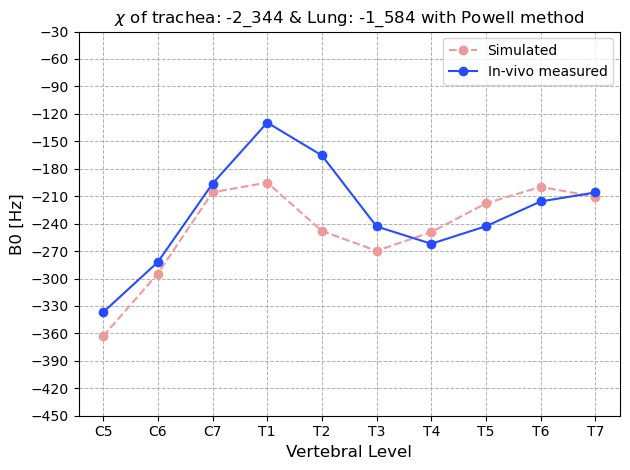

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #66
Chi internal air = 0.27
Vol_air Tr:  0.7111456180001682
Vol_air_lungs: 0.7999895700527367
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_408_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_408_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_408_l_-1_584_Hz.csv


Difference:  291.74201632774674


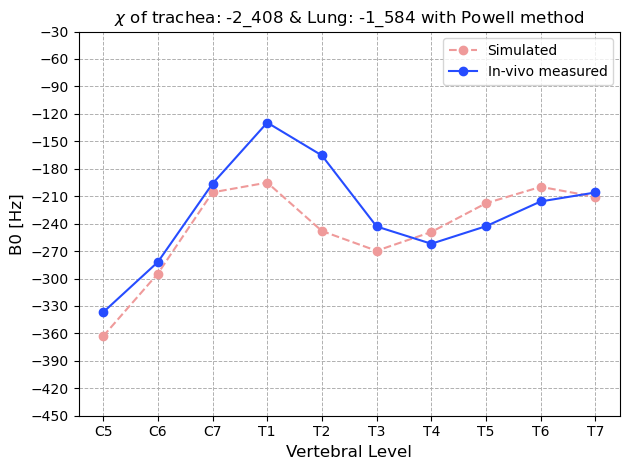

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #67
Chi internal air = 0.27
Vol_air Tr:  0.7068883707497265
Vol_air_lungs: 0.7999895700527367
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_447_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_447_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_447_l_-1_584_Hz.csv


Difference:  291.72611318943854


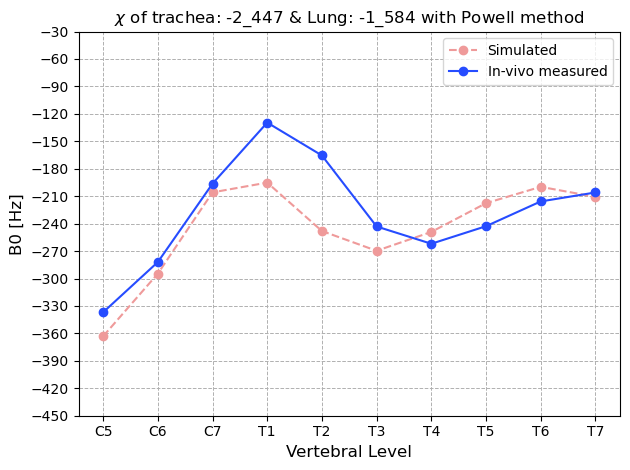

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #68
Chi internal air = 0.27
Vol_air Tr:  0.7042572472504416
Vol_air_lungs: 0.7999895700527367
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_472_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_472_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_472_l_-1_584_Hz.csv


Difference:  291.71629705239206


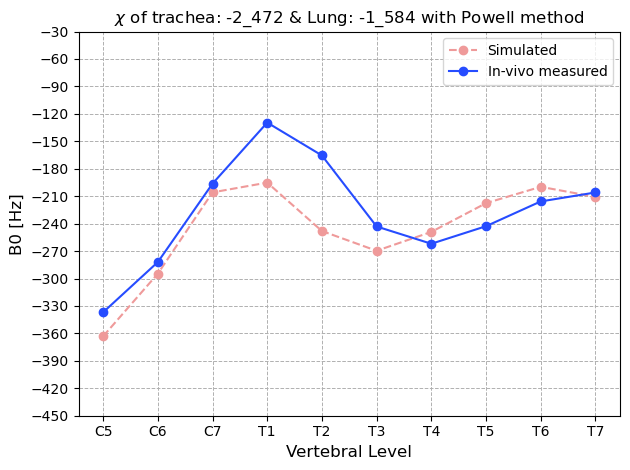

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #69
Chi internal air = 0.27
Vol_air Tr:  0.7026311234992849
Vol_air_lungs: 0.7999895700527367
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_487_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_487_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_487_l_-1_584_Hz.csv


Difference:  291.71023513756353


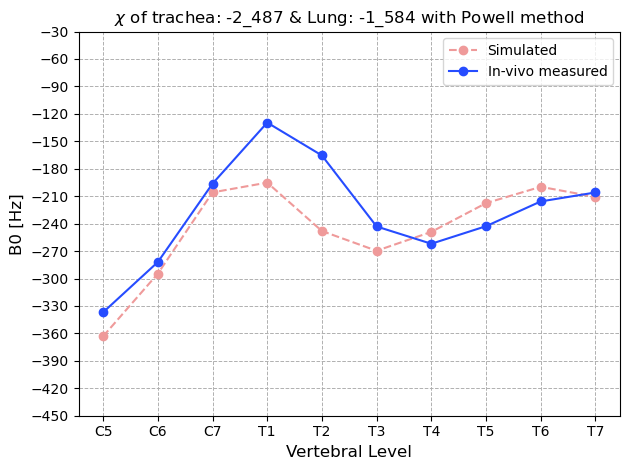

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #70
Chi internal air = 0.27
Vol_air Tr:  0.7016261237511566
Vol_air_lungs: 0.7999895700527367
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_496_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_496_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_496_l_-1_584_Hz.csv


Difference:  291.70649049847776


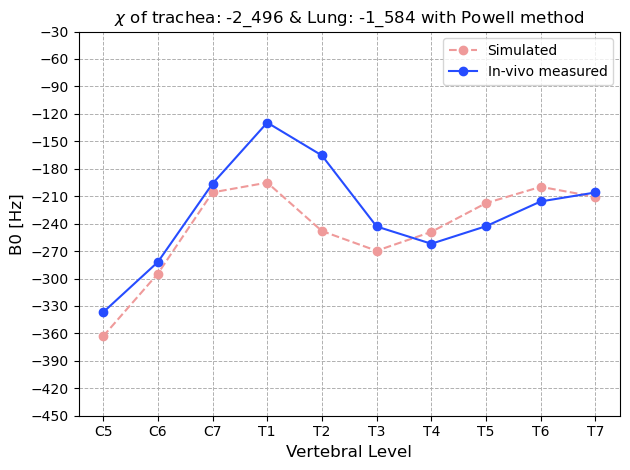

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #71
Chi internal air = 0.27
Vol_air Tr:  0.7010049997481282
Vol_air_lungs: 0.7999895700527367
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_502_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_502_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_502_l_-1_584_Hz.csv


Difference:  291.7041768833942


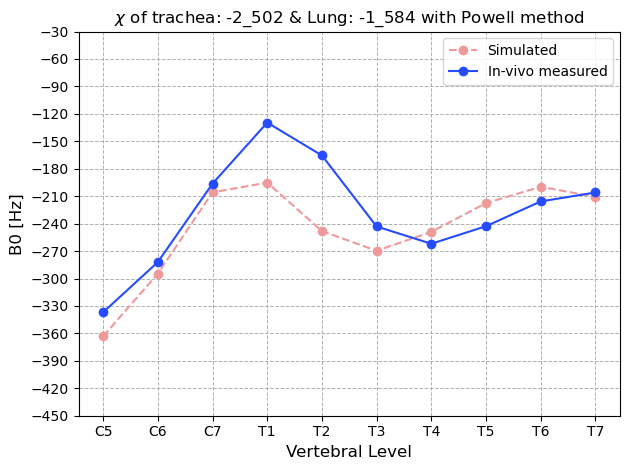

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #72
Chi internal air = 0.27
Vol_air Tr:  0.7006211240030283
Vol_air_lungs: 0.7999895700527367
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_505_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_505_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_505_l_-1_584_Hz.csv


Difference:  291.702747257693


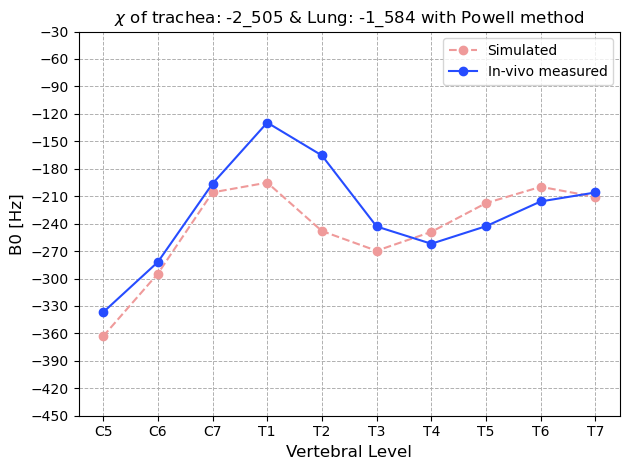

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #73
Chi internal air = 0.27
Vol_air Tr:  0.7003838757450999
Vol_air_lungs: 0.7999895700527367
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_507_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_507_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_507_l_-1_584_Hz.csv


Difference:  291.70186380242694


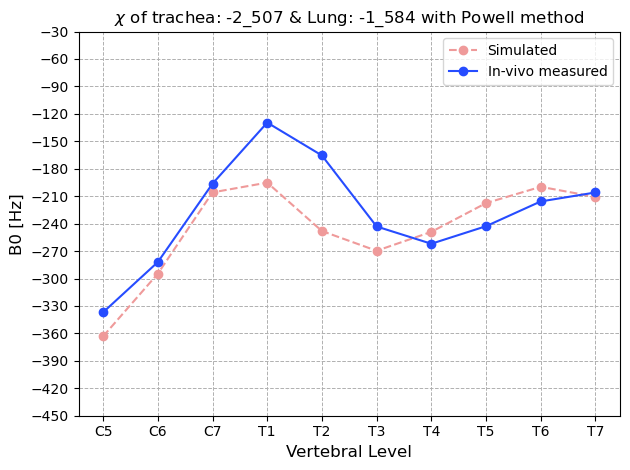

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #74
Chi internal air = 0.27
Vol_air Tr:  0.7002372482579284
Vol_air_lungs: 0.7999895700527367
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_509_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_509_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_509_l_-1_584_Hz.csv


Difference:  291.7013178360091


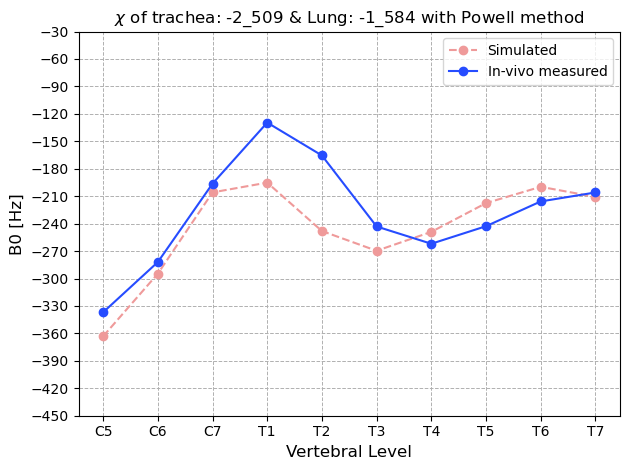

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #75
Chi internal air = 0.27
Vol_air Tr:  0.7001466274871715
Vol_air_lungs: 0.7999895700527367
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.70098042508926


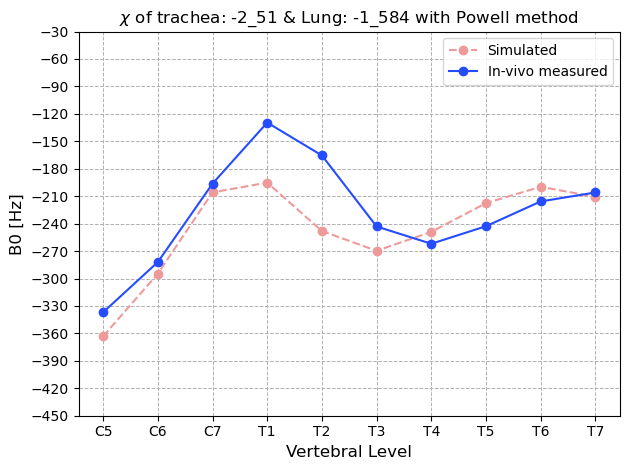

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #76
Chi internal air = 0.27
Vol_air Tr:  0.7000906207707569
Vol_air_lungs: 0.7999895700527367
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7007718993574


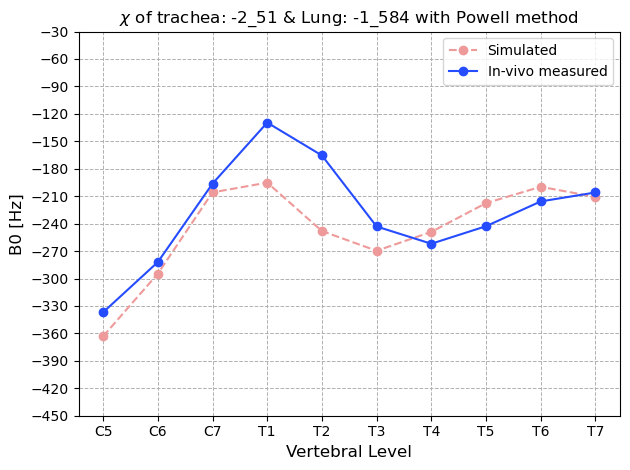

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #77
Chi internal air = 0.27
Vol_air Tr:  0.7000560067164144
Vol_air_lungs: 0.7999895700527367
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.700643025539


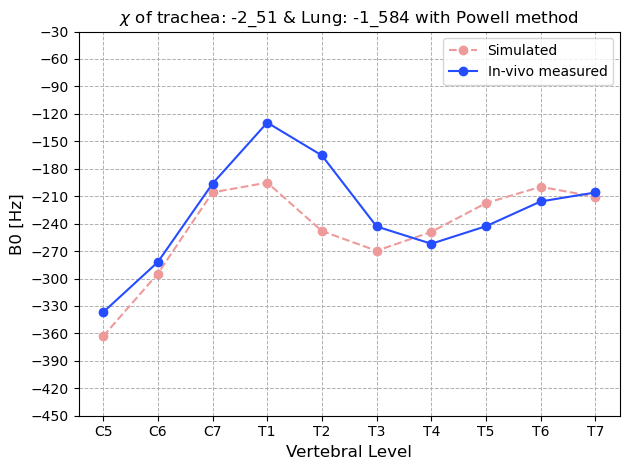

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #78
Chi internal air = 0.27
Vol_air Tr:  0.7000227201154988
Vol_air_lungs: 0.7998896720079662
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_511_l_-1_585_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_511_l_-1_585_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_511_l_-1_585_Hz.csv


Difference:  291.70156913283955


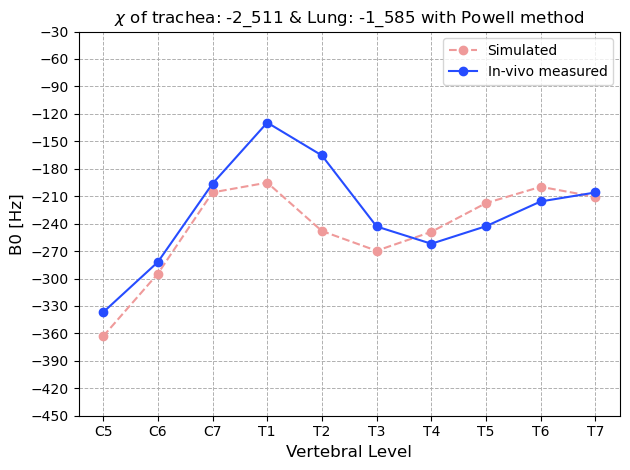

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #79
Chi internal air = 0.27
Vol_air Tr:  0.7000367619191055
Vol_air_lungs: 0.7999318135510126
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_511_l_-1_585_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_511_l_-1_585_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_511_l_-1_585_Hz.csv


Difference:  291.7011777859636


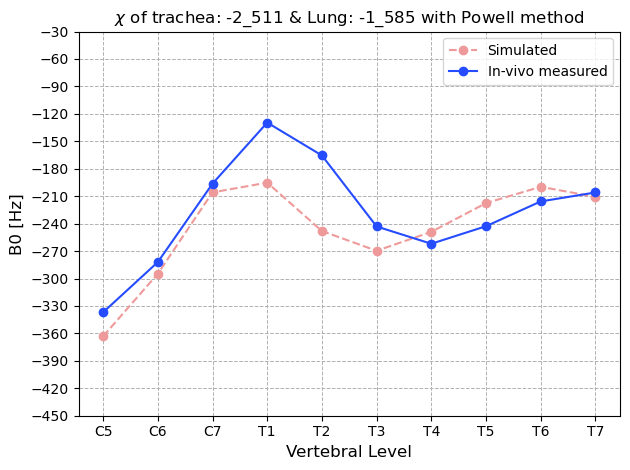

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #80
Chi internal air = 0.27
Vol_air Tr:  0.7000454402309977
Vol_air_lungs: 0.7999578584569537
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_511_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_511_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_511_l_-1_584_Hz.csv


Difference:  291.70093641109054


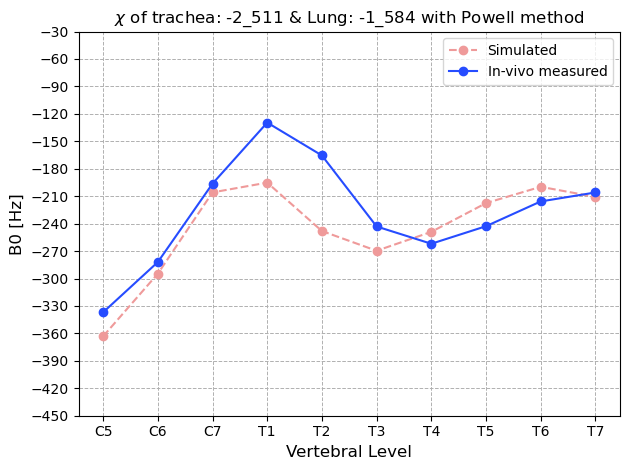

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #81
Chi internal air = 0.27
Vol_air Tr:  0.7000508037227121
Vol_air_lungs: 0.799973955094059
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_511_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_511_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_511_l_-1_584_Hz.csv


Difference:  291.70078742068335


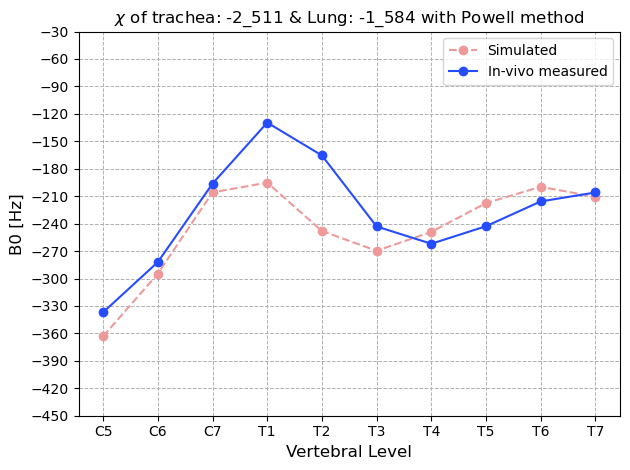

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #82
Chi internal air = 0.27
Vol_air Tr:  0.7000541185428899
Vol_air_lungs: 0.7999839033628947
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7006954111545


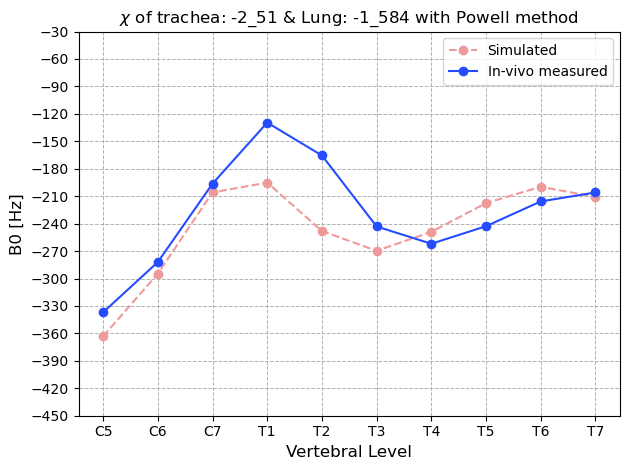

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #83
Chi internal air = 0.27
Vol_air Tr:  0.7000561672144264
Vol_air_lungs: 0.7999900517311643
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.70063857348964


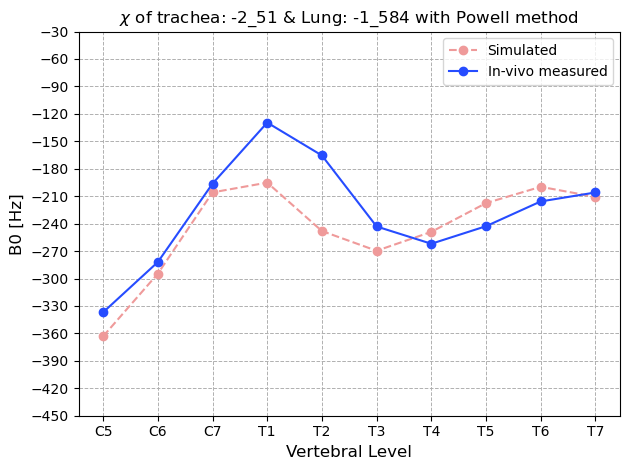

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #84
Chi internal air = 0.27
Vol_air Tr:  0.7000574333630678
Vol_air_lungs: 0.7999938516317304
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7006034563282


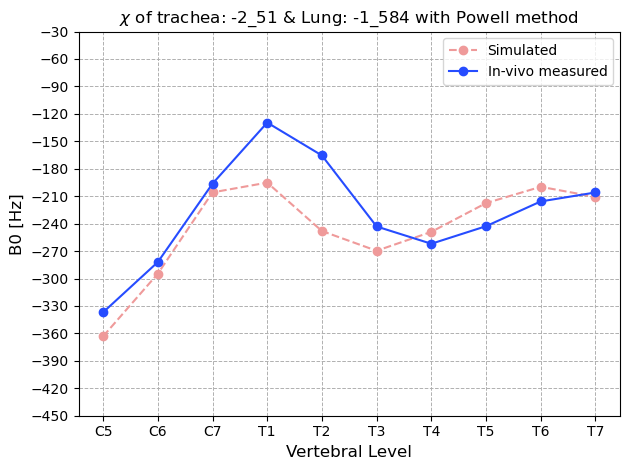

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #85
Chi internal air = 0.27
Vol_air Tr:  0.700058215885963
Vol_air_lungs: 0.7999962000994341
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005817567195


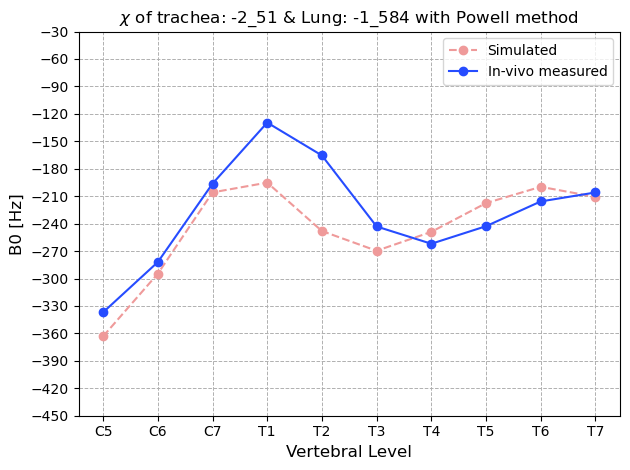

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #86
Chi internal air = 0.27
Vol_air Tr:  0.7000586995117092
Vol_air_lungs: 0.7999976515322964
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005683471479


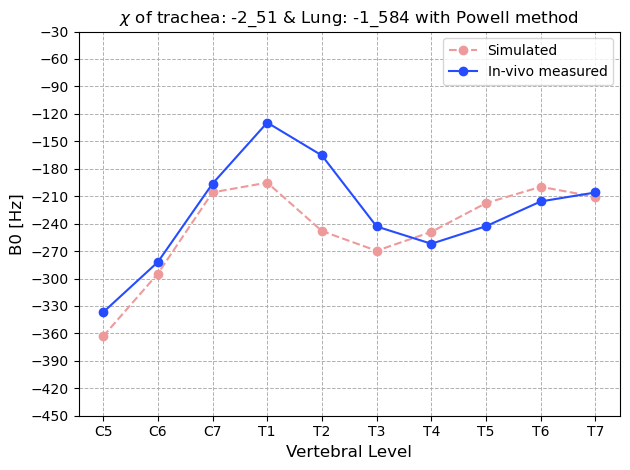

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #87
Chi internal air = 0.27
Vol_air Tr:  0.7000589984088581
Vol_air_lungs: 0.7999985485671377
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005600601592


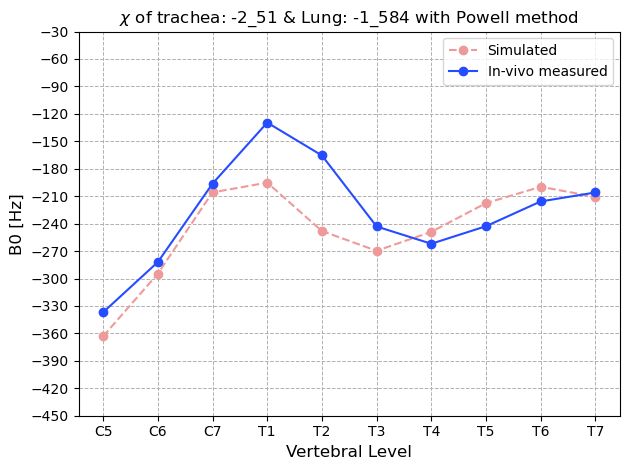

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #88
Chi internal air = 0.27
Vol_air Tr:  0.7000591831374553
Vol_air_lungs: 0.7999991029651587
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.70055493874077


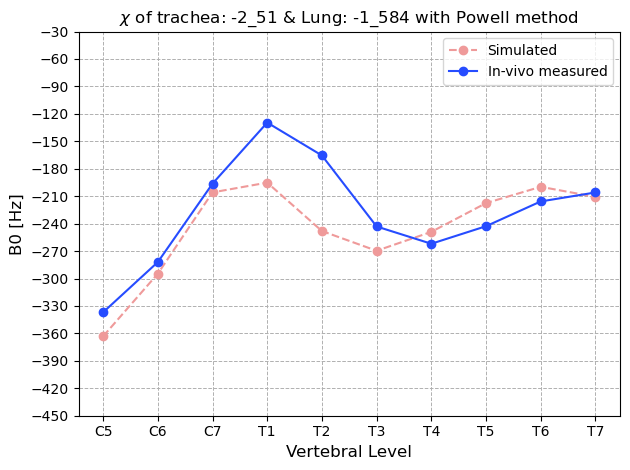

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #89
Chi internal air = 0.27
Vol_air Tr:  0.7000592973060071
Vol_air_lungs: 0.799999445601979
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005517736151


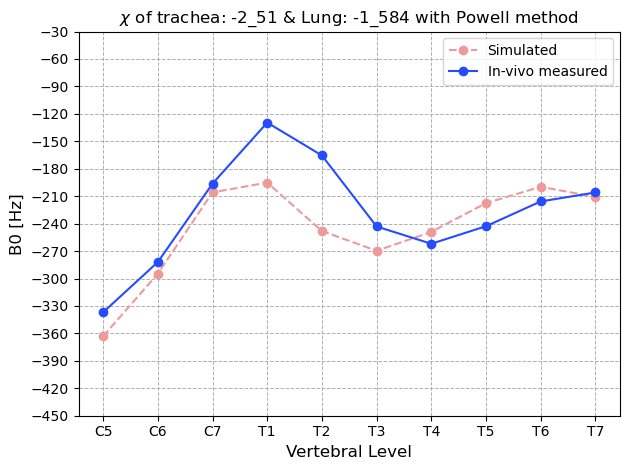

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #90
Chi internal air = 0.27
Vol_air Tr:  0.7000593678660525
Vol_air_lungs: 0.7999996573631798
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.70054981749234


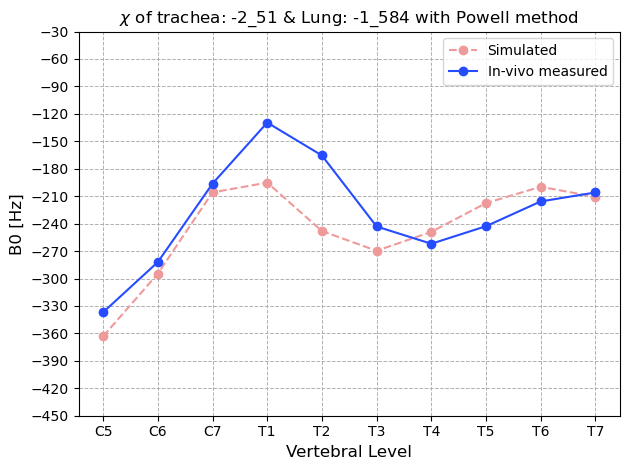

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #91
Chi internal air = 0.27
Vol_air Tr:  0.7000594114745589
Vol_air_lungs: 0.7999997882387994
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005486085543


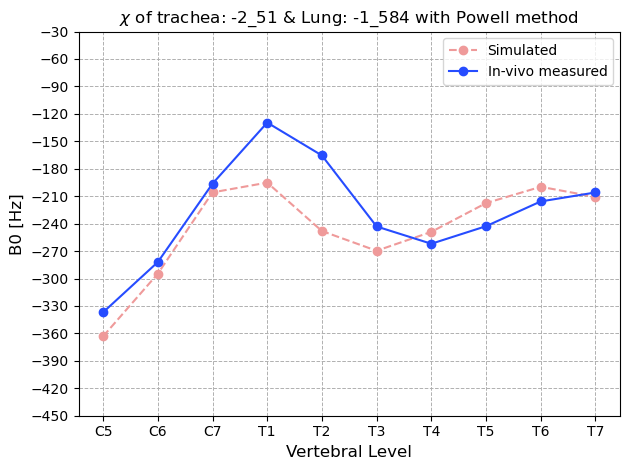

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #92
Chi internal air = 0.27
Vol_air Tr:  0.700059438426098
Vol_air_lungs: 0.7999998691243805
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.70054786139434


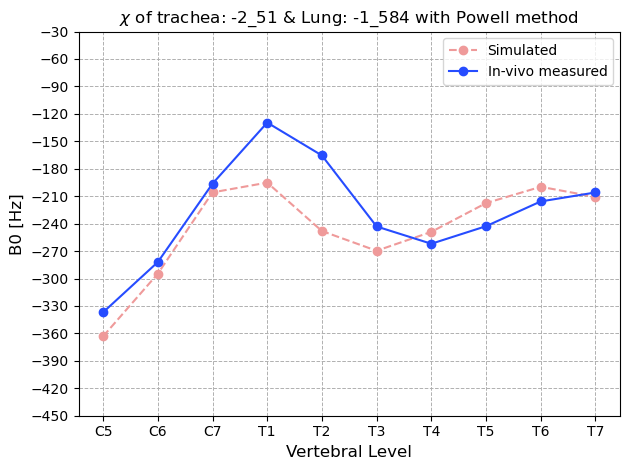

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #93
Chi internal air = 0.27
Vol_air Tr:  0.7000594550830652
Vol_air_lungs: 0.7999999191144188
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.70054739962586


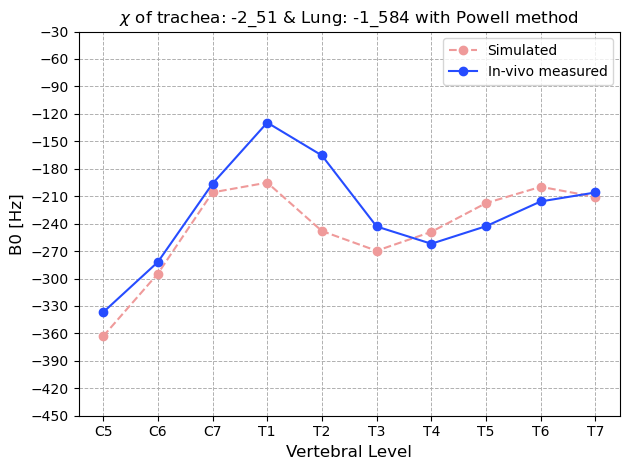

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #94
Chi internal air = 0.27
Vol_air Tr:  0.7000594653776371
Vol_air_lungs: 0.7999999500099617
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005471142379


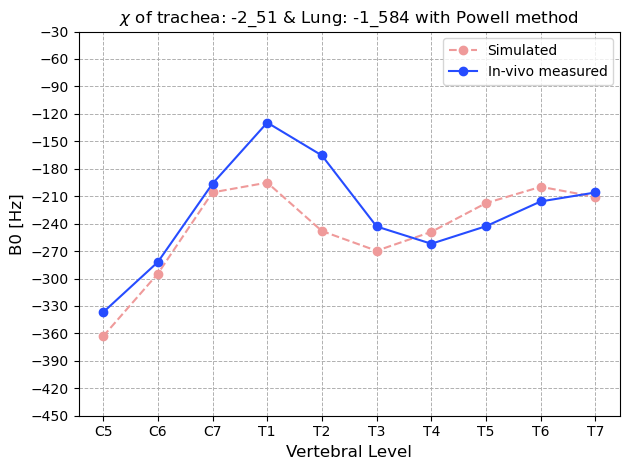

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #95
Chi internal air = 0.27
Vol_air Tr:  0.7000594717400325
Vol_air_lungs: 0.7999999691044573
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005469378588


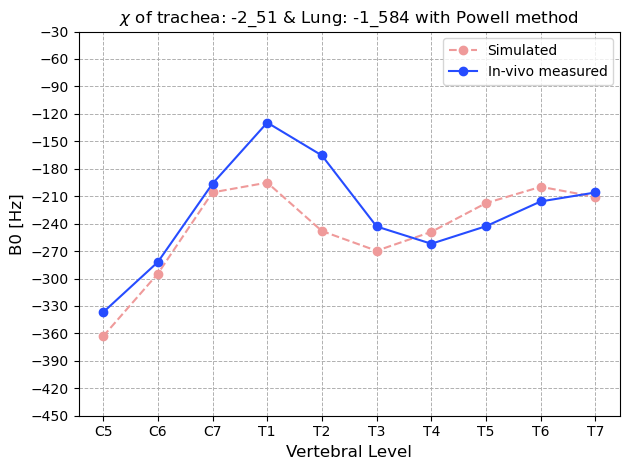

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #96
Chi internal air = 0.27
Vol_air Tr:  0.7000594756722089
Vol_air_lungs: 0.7999999809055045
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.70054682885046


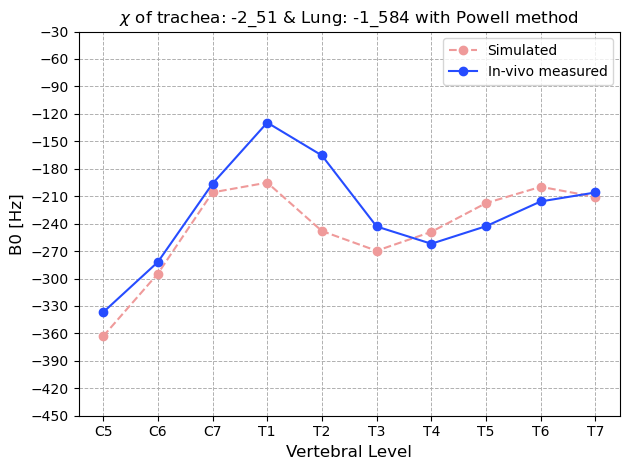

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #97
Chi internal air = 0.27
Vol_air Tr:  0.7000594781024277
Vol_air_lungs: 0.7999999881989528
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.70054676147964


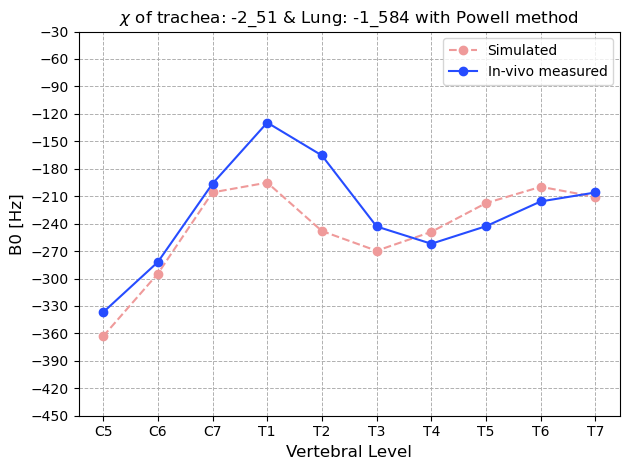

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #98
Chi internal air = 0.27
Vol_air Tr:  0.7000594796043855
Vol_air_lungs: 0.7999999927065518
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005467198423


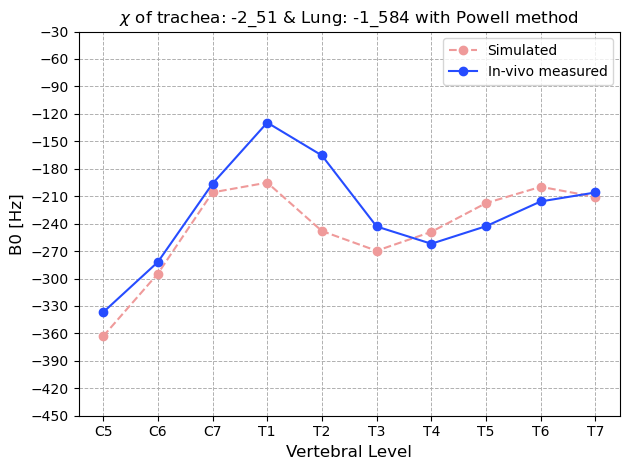

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #99
Chi internal air = 0.27
Vol_air Tr:  0.7000594805326465
Vol_air_lungs: 0.7999999954924011
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.70054669410905


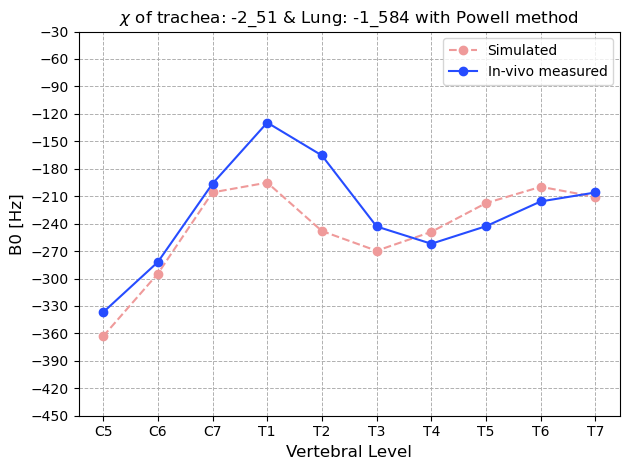

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #100
Chi internal air = 0.27
Vol_air Tr:  0.7000594811063433
Vol_air_lungs: 0.7999999972141507
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005466782049


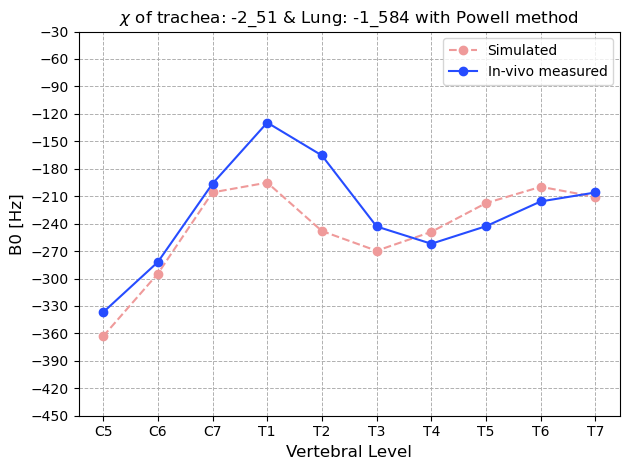

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #101
Chi internal air = 0.27
Vol_air Tr:  0.7000490129673477
Vol_air_lungs: 0.8
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_511_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_511_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_511_l_-1_584_Hz.csv


Difference:  291.700507672598


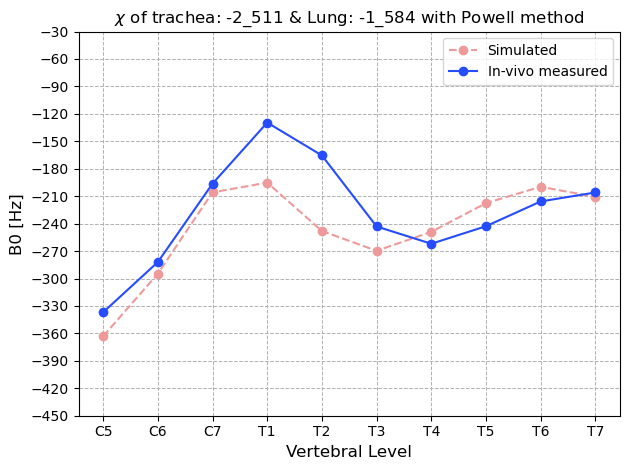

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #102
Chi internal air = 0.27
Vol_air Tr:  0.8236255190376163
Vol_air_lungs: 0.799967113015345
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-1_365_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-1_365_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-1_365_l_-1_584_Hz.csv


Difference:  292.1714456710913


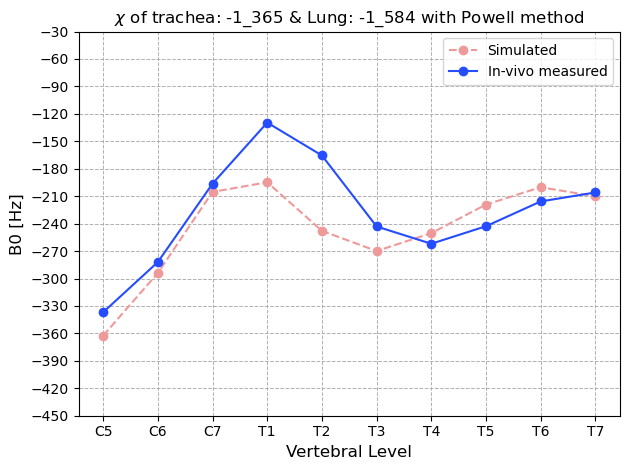

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #103
Chi internal air = 0.27
Vol_air Tr:  0.7764234939297314
Vol_air_lungs: 0.7999796747256958
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-1_803_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-1_803_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-1_803_l_-1_584_Hz.csv


Difference:  291.9890924787113


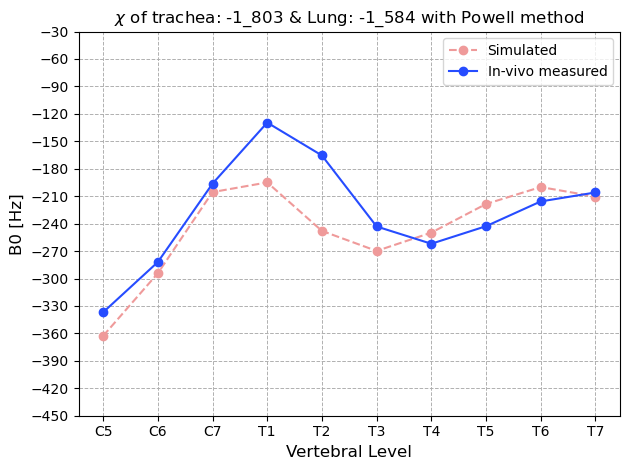

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #104
Chi internal air = 0.27
Vol_air Tr:  0.7472510380752326
Vol_air_lungs: 0.7999874382896494
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_073_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_073_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_073_l_-1_584_Hz.csv


Difference:  291.87791815674433


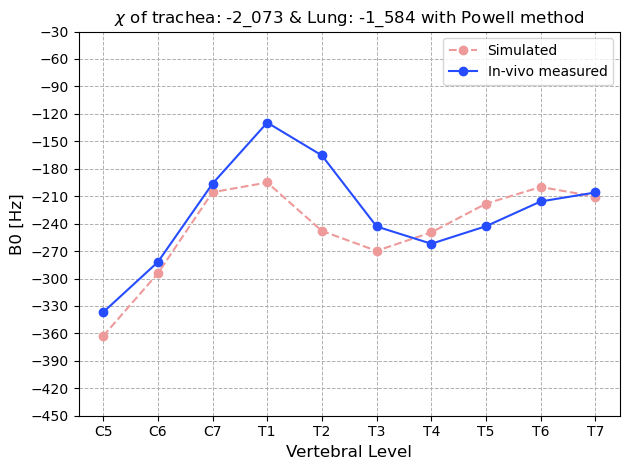

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #105
Chi internal air = 0.27
Vol_air Tr:  0.7292214688218465
Vol_air_lungs: 0.7999922364360464
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_24_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_24_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_24_l_-1_584_Hz.csv


Difference:  291.8097923046712


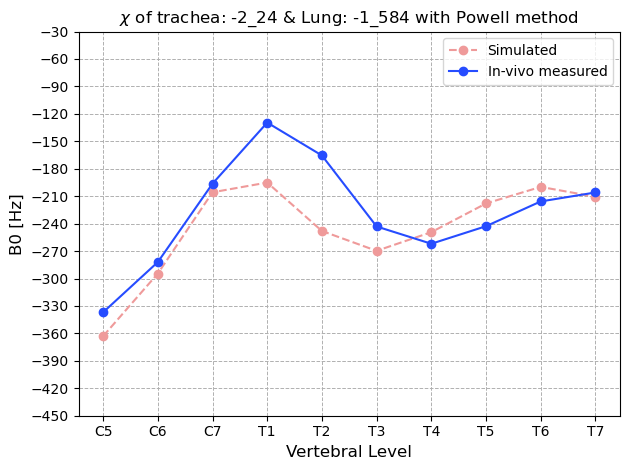

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #106
Chi internal air = 0.27
Vol_air Tr:  0.7180785822207338
Vol_air_lungs: 0.7999952018536028
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_343_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_343_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_343_l_-1_584_Hz.csv


Difference:  291.76791131866173


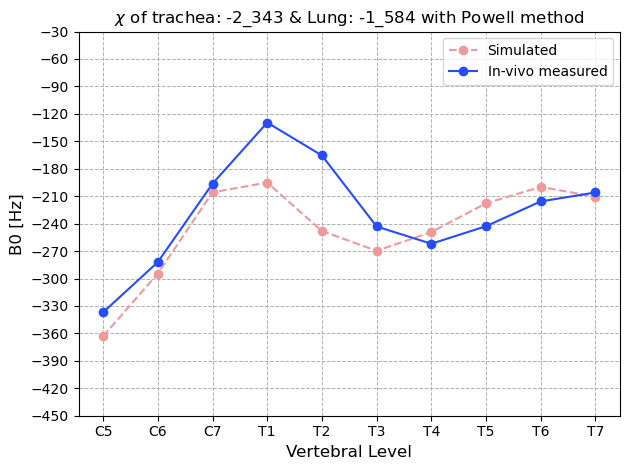

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #107
Chi internal air = 0.27
Vol_air Tr:  0.7111918995684604
Vol_air_lungs: 0.7999970345824436
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_407_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_407_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_407_l_-1_584_Hz.csv


Difference:  291.7421127043957


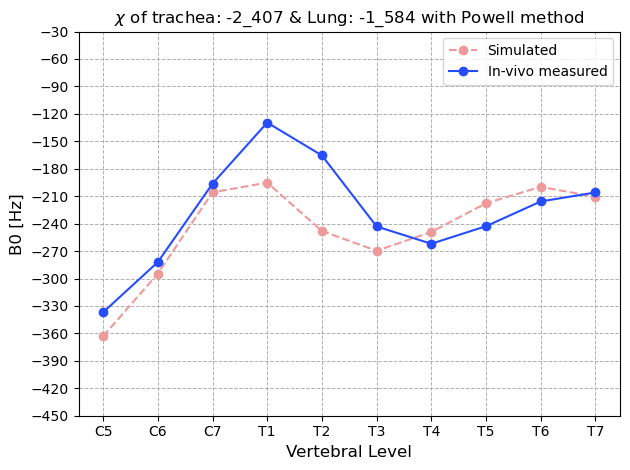

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #108
Chi internal air = 0.27
Vol_air Tr:  0.7069356956196211
Vol_air_lungs: 0.7999981672711594
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_447_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_447_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_447_l_-1_584_Hz.csv


Difference:  291.72620085911825


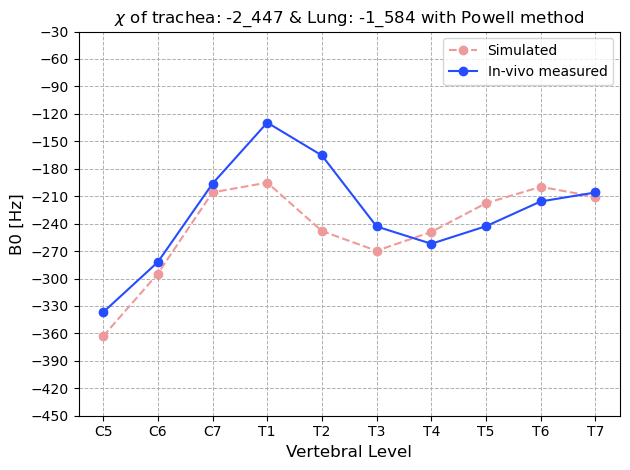

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #109
Chi internal air = 0.27
Vol_air Tr:  0.704305216916187
Vol_air_lungs: 0.7999988673112843
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_471_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_471_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_471_l_-1_584_Hz.csv


Difference:  291.7163792427299


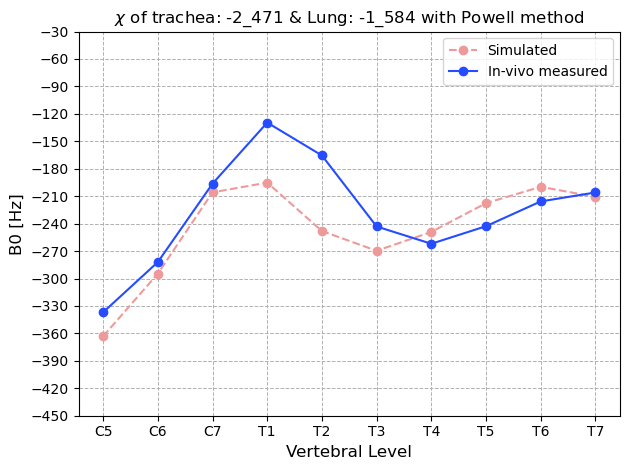

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #110
Chi internal air = 0.27
Vol_air Tr:  0.7026794916707819
Vol_air_lungs: 0.7999992999598751
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_486_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_486_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_486_l_-1_584_Hz.csv


Difference:  291.7103139039925


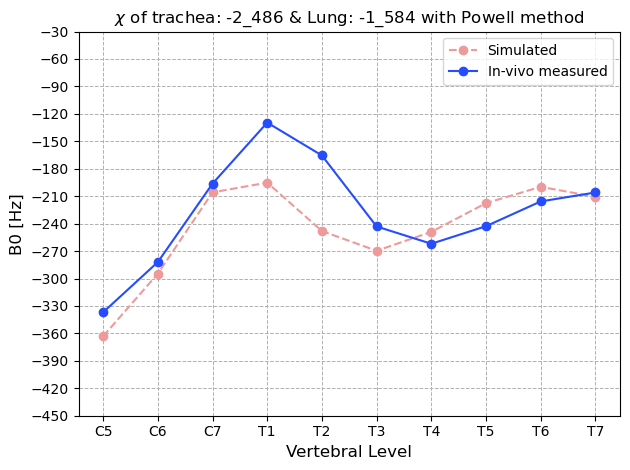

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #111
Chi internal air = 0.27
Vol_air Tr:  0.7016747382127527
Vol_air_lungs: 0.7999995673514093
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_495_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_495_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_495_l_-1_584_Hz.csv


Difference:  291.70656713449404


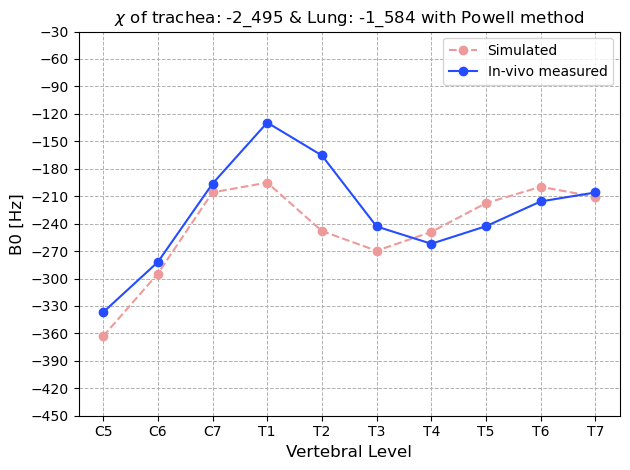

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #112
Chi internal air = 0.27
Vol_air Tr:  0.7010537664253768
Vol_air_lungs: 0.7999997326084658
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_501_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_501_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_501_l_-1_584_Hz.csv


Difference:  291.704252197273


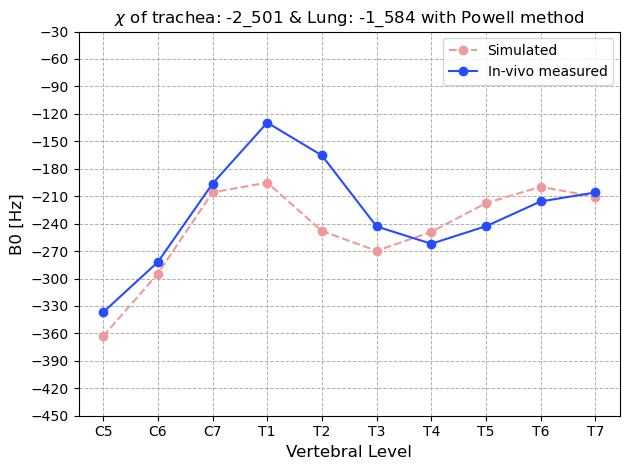

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #113
Chi internal air = 0.27
Vol_air Tr:  0.7006699847547236
Vol_air_lungs: 0.7999998347429436
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_505_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_505_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_505_l_-1_584_Hz.csv


Difference:  291.7028217523563


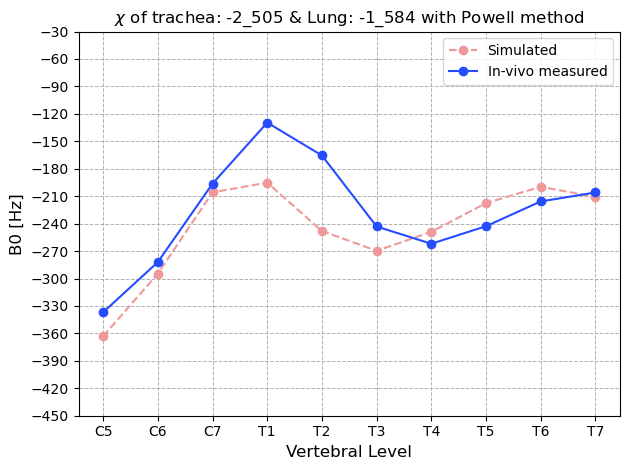

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #114
Chi internal air = 0.27
Vol_air Tr:  0.7004327946380008
Vol_air_lungs: 0.7999998978655223
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_507_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_507_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_507_l_-1_584_Hz.csv


Difference:  291.70193778998896


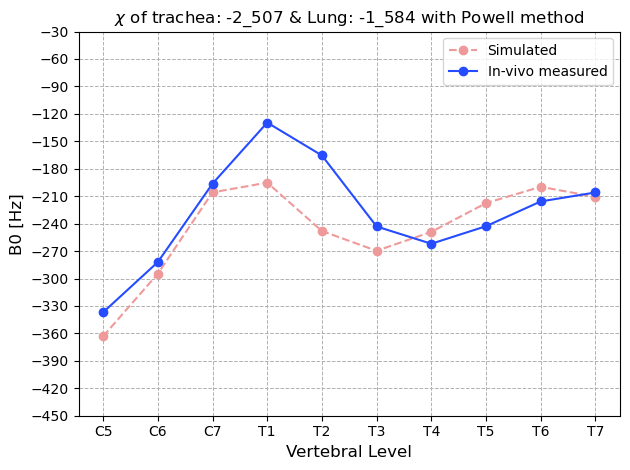

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #115
Chi internal air = 0.27
Vol_air Tr:  0.7002862030840705
Vol_air_lungs: 0.7999999368774213
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_508_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_508_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_508_l_-1_584_Hz.csv


Difference:  291.7013915098606


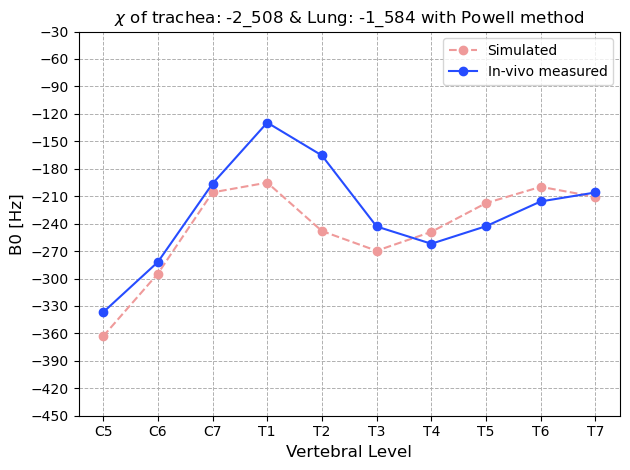

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #116
Chi internal air = 0.27
Vol_air Tr:  0.7001956045212779
Vol_air_lungs: 0.799999960988101
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_509_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_509_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_509_l_-1_584_Hz.csv


Difference:  291.70105390494047


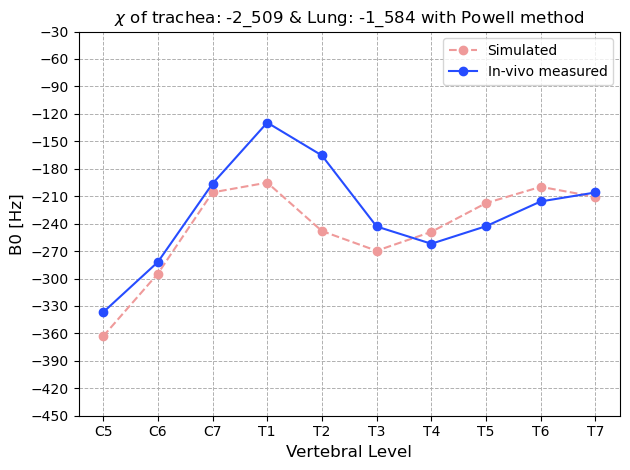

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #117
Chi internal air = 0.27
Vol_air Tr:  0.7001396115301403
Vol_air_lungs: 0.7999999758893205
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7008452592654


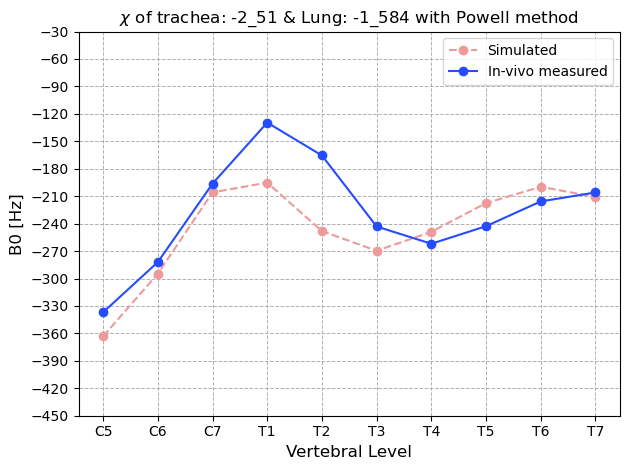

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #118
Chi internal air = 0.27
Vol_air Tr:  0.7001050059584853
Vol_air_lungs: 0.7999999850987806
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7007163113011


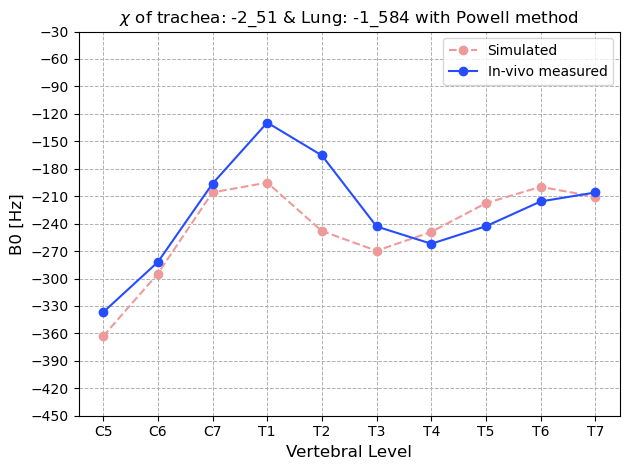

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #119
Chi internal air = 0.27
Vol_air Tr:  0.7000836185390026
Vol_air_lungs: 0.79999999079054
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7006366178993


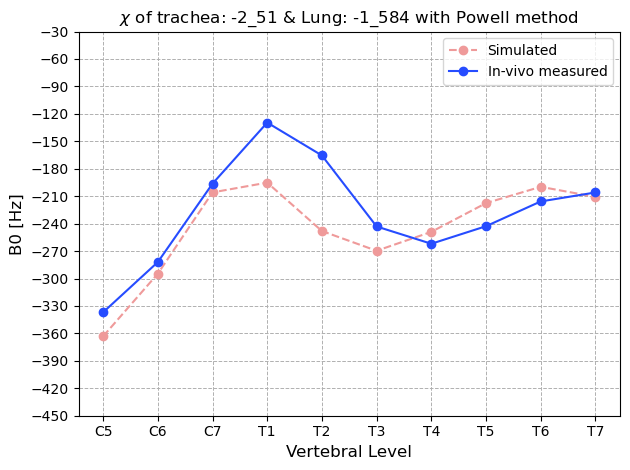

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #120
Chi internal air = 0.27
Vol_air Tr:  0.7000704003868305
Vol_air_lungs: 0.7999999943082406
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.70058736498254


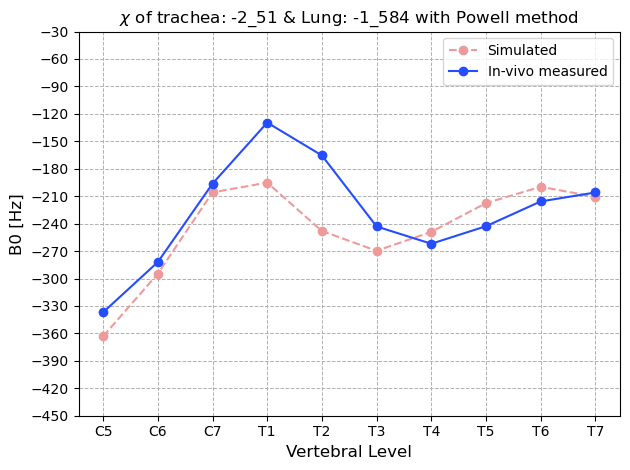

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #121
Chi internal air = 0.27
Vol_air Tr:  0.7000622311195197
Vol_air_lungs: 0.7999999964822992
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.70055692512614


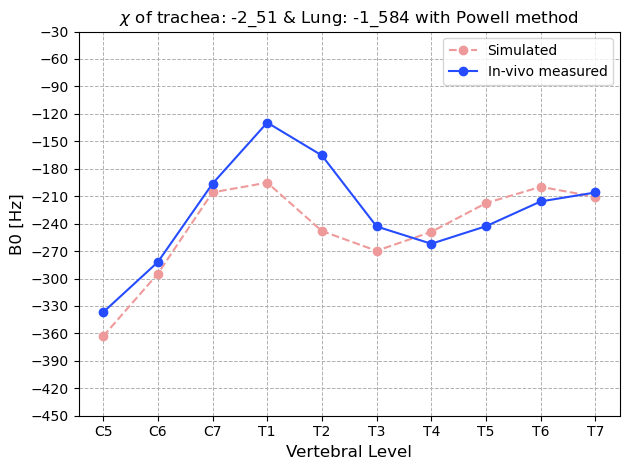

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #122
Chi internal air = 0.27
Vol_air Tr:  0.7000237706202078
Vol_air_lungs: 0.799884570798196
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_511_l_-1_585_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_511_l_-1_585_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_511_l_-1_585_Hz.csv


Difference:  291.70162680569484


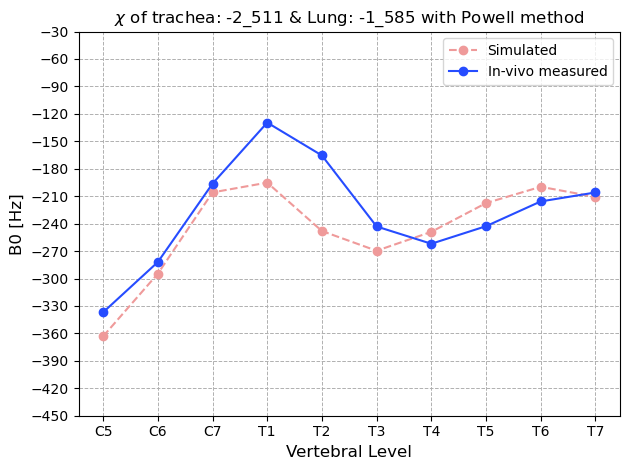

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #123
Chi internal air = 0.27
Vol_air Tr:  0.7000384616714299
Vol_air_lungs: 0.7999286608299908
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_511_l_-1_585_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_511_l_-1_585_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_511_l_-1_585_Hz.csv


Difference:  291.7012172660087


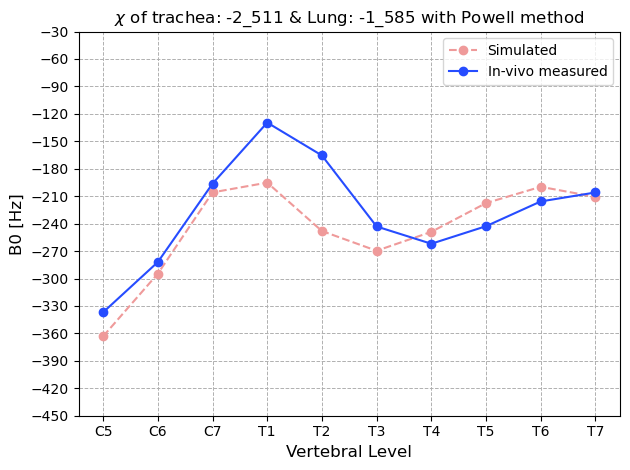

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #124
Chi internal air = 0.27
Vol_air Tr:  0.7000475412404157
Vol_air_lungs: 0.7999559099682052
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_511_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_511_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_511_l_-1_584_Hz.csv


Difference:  291.7009646937953


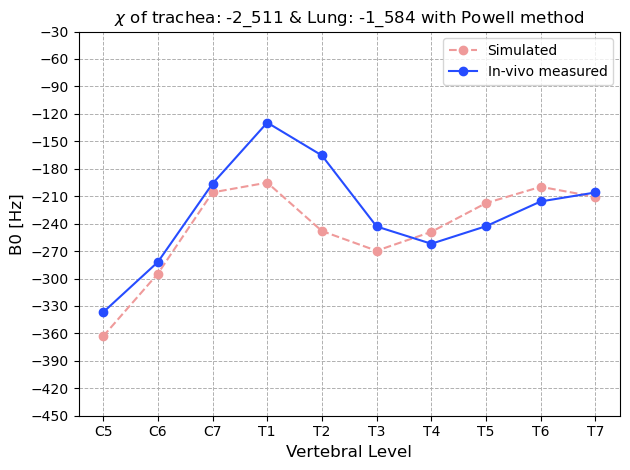

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #125
Chi internal air = 0.27
Vol_air Tr:  0.700053152722652
Vol_air_lungs: 0.7999727508617858
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_511_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_511_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_511_l_-1_584_Hz.csv


Difference:  291.70080880078774


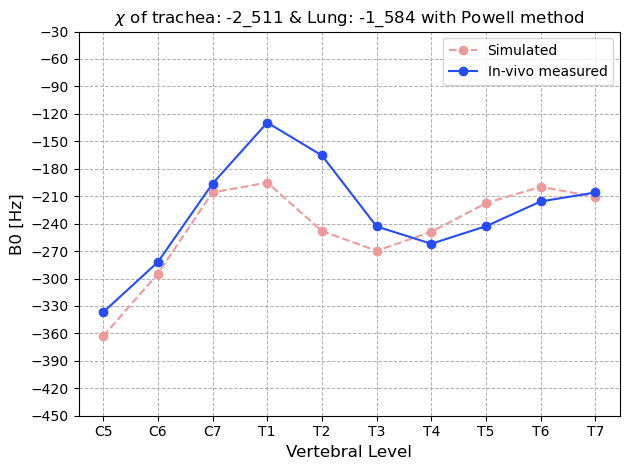

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #126
Chi internal air = 0.27
Vol_air Tr:  0.7000566208094013
Vol_air_lungs: 0.7999831591064195
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.70071253199217


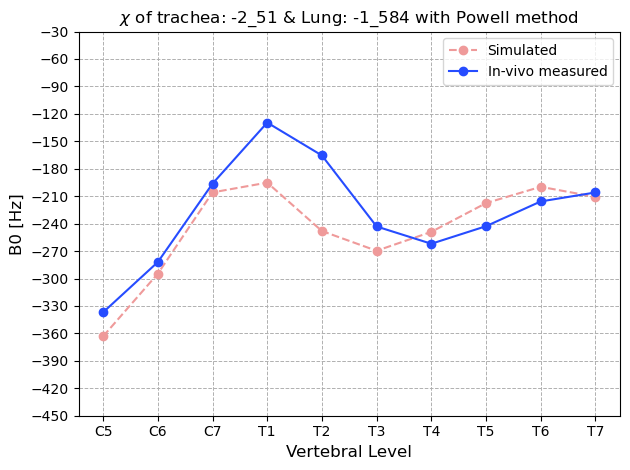

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #127
Chi internal air = 0.27
Vol_air Tr:  0.7000587642048884
Vol_air_lungs: 0.7999895917553663
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7006530645434


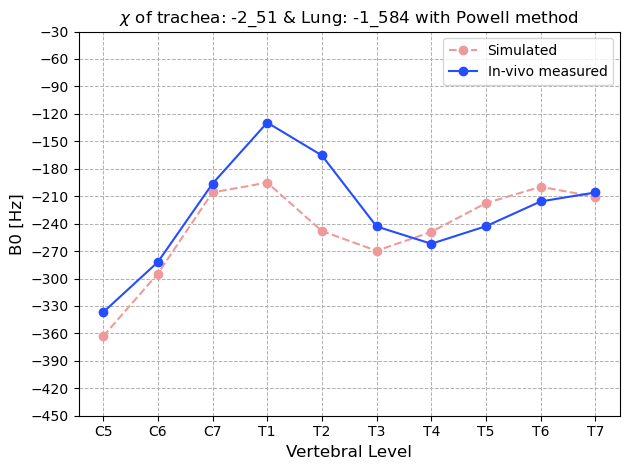

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #128
Chi internal air = 0.27
Vol_air Tr:  0.7000600888961508
Vol_air_lungs: 0.7999935673510532
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.70061632307466


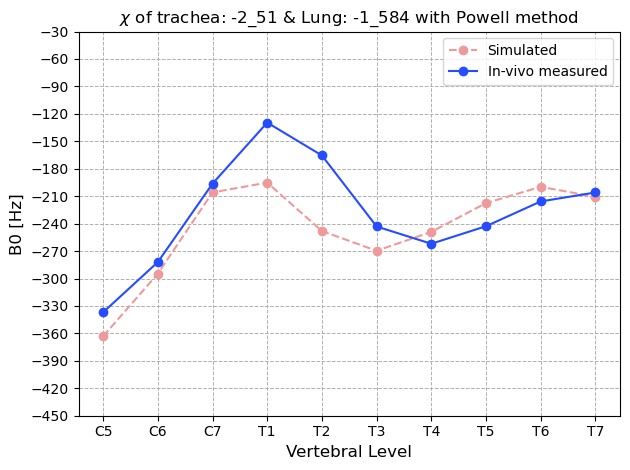

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #129
Chi internal air = 0.27
Vol_air Tr:  0.7000609076003754
Vol_air_lungs: 0.7999960244043132
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005936199661


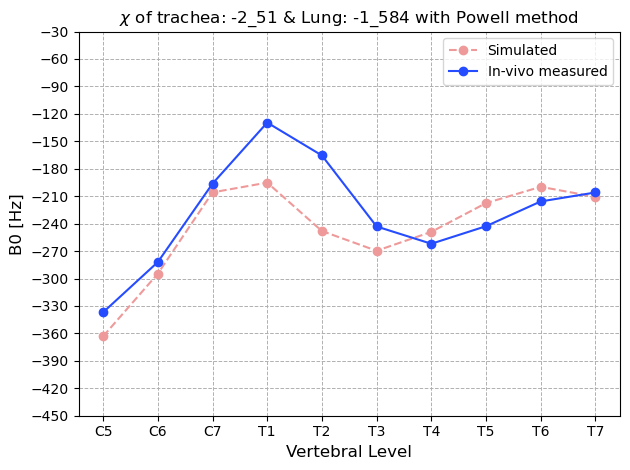

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #130
Chi internal air = 0.27
Vol_air Tr:  0.700061413587413
Vol_air_lungs: 0.7999975429467401
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.700579590342


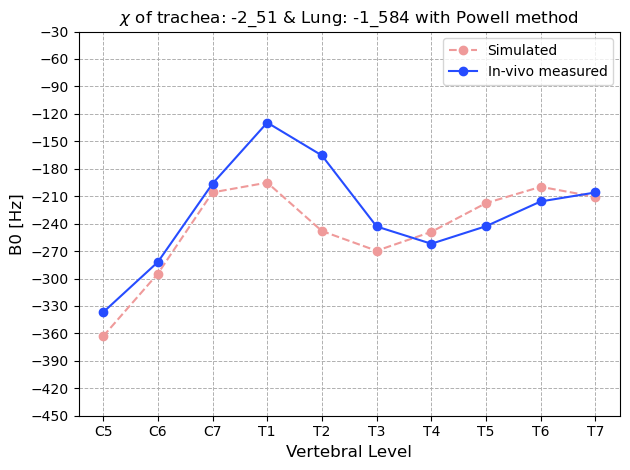

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #131
Chi internal air = 0.27
Vol_air Tr:  0.7000617263046002
Vol_air_lungs: 0.7999984814575732
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005709201946


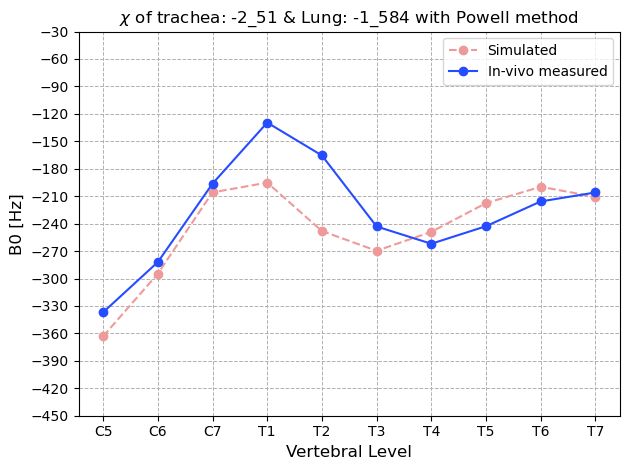

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #132
Chi internal air = 0.27
Vol_air Tr:  0.7000619195744506
Vol_air_lungs: 0.7999990614891669
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005655619923


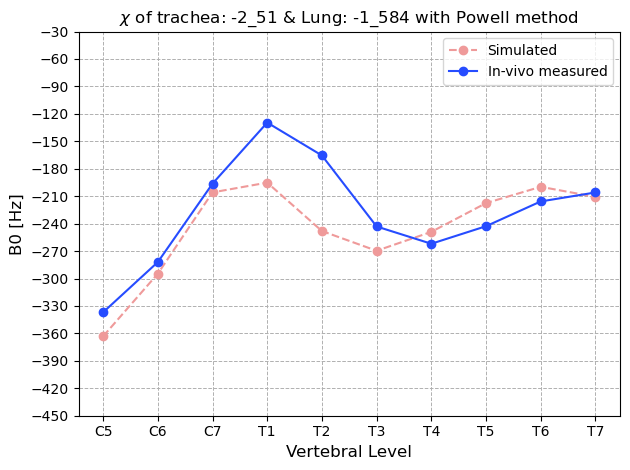

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #133
Chi internal air = 0.27
Vol_air Tr:  0.7000620390217873
Vol_air_lungs: 0.7999994199684064
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005622505342


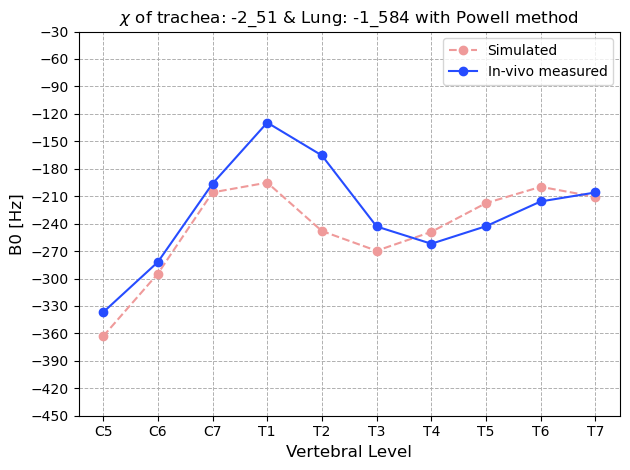

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #134
Chi internal air = 0.27
Vol_air Tr:  0.7000621128443012
Vol_air_lungs: 0.7999996415207606
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.70056020397595


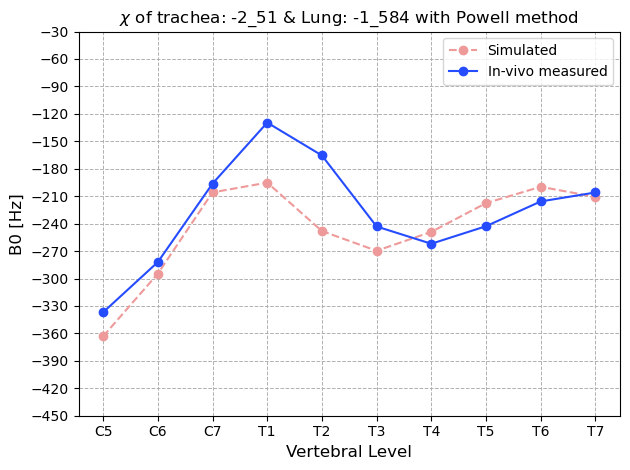

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #135
Chi internal air = 0.27
Vol_air Tr:  0.7000621584691239
Vol_air_lungs: 0.7999997784476458
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.700558939147


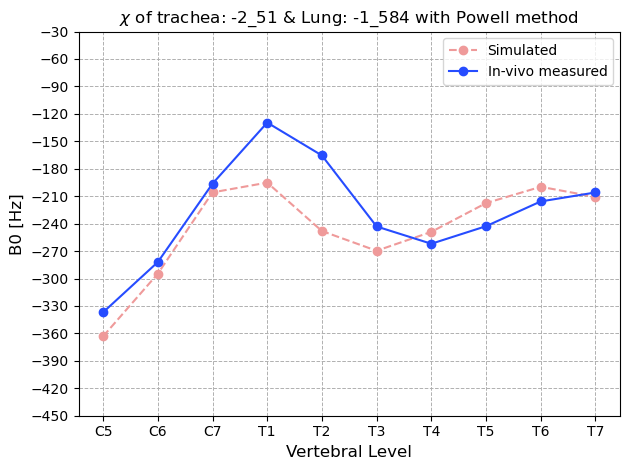

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #136
Chi internal air = 0.27
Vol_air Tr:  0.7000621866668151
Vol_air_lungs: 0.7999998630731149
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.700558157445


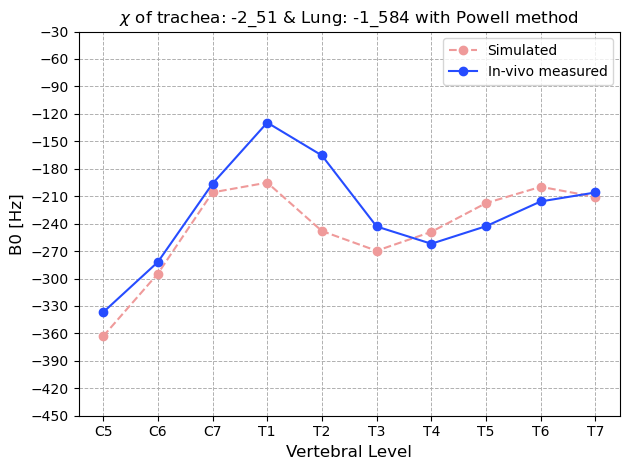

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #137
Chi internal air = 0.27
Vol_air Tr:  0.7000622040939466
Vol_air_lungs: 0.799999915374531
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.70055767432837


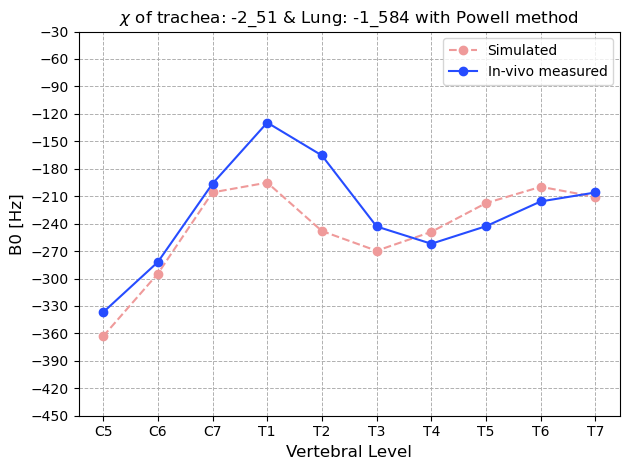

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #138
Chi internal air = 0.27
Vol_air Tr:  0.7000622148645063
Vol_air_lungs: 0.7999999476985838
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005573757468


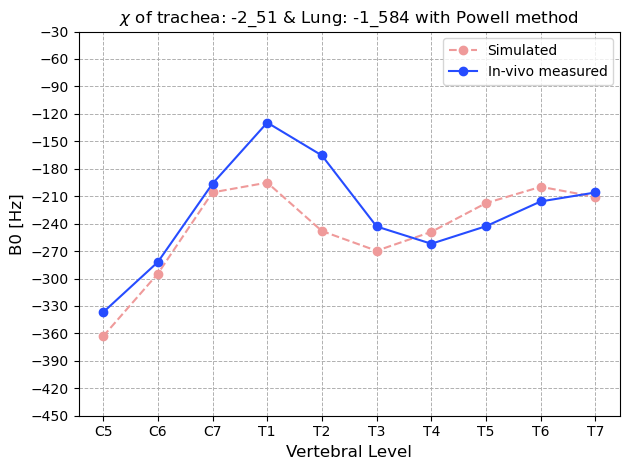

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #139
Chi internal air = 0.27
Vol_air Tr:  0.7000622215210781
Vol_air_lungs: 0.7999999676759472
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005571912135


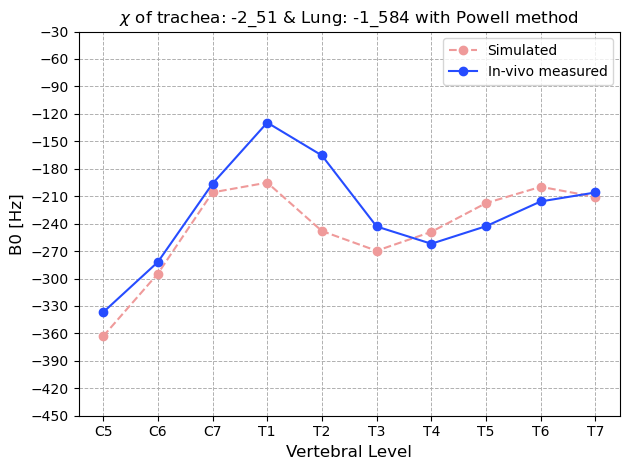

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #140
Chi internal air = 0.27
Vol_air Tr:  0.7000622256350658
Vol_air_lungs: 0.7999999800226367
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.70055707716574


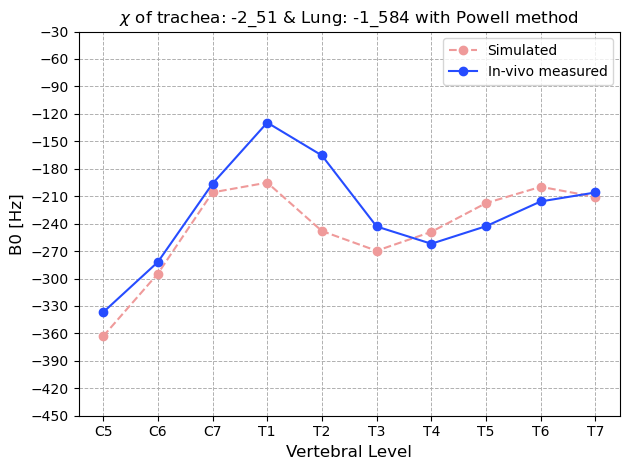

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #141
Chi internal air = 0.27
Vol_air Tr:  0.7000622281776501
Vol_air_lungs: 0.7999999876533105
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005570066804


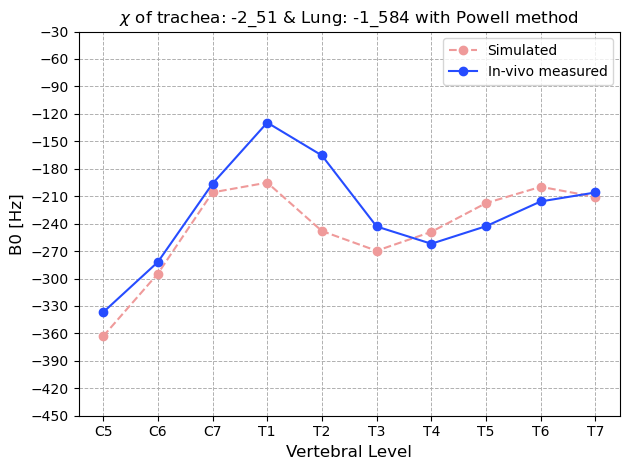

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #142
Chi internal air = 0.27
Vol_air Tr:  0.7000622297490535
Vol_air_lungs: 0.7999999923693263
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.70055696311806


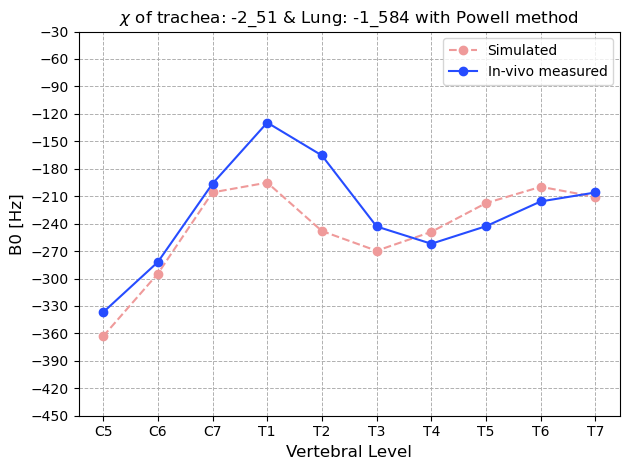

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #143
Chi internal air = 0.27
Vol_air Tr:  0.7000622307202343
Vol_air_lungs: 0.7999999952839842
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005569361951


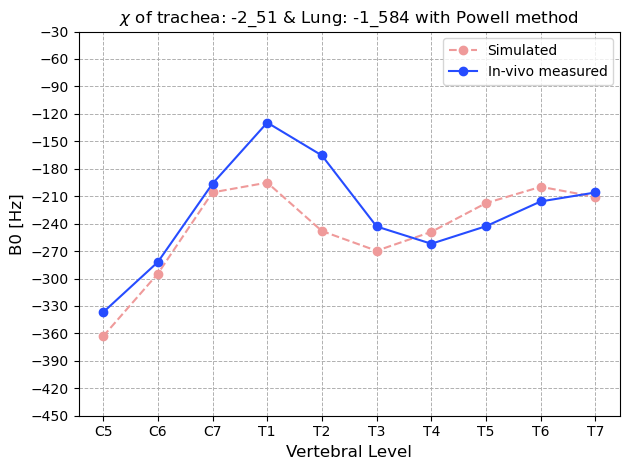

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #144
Chi internal air = 0.27
Vol_air Tr:  0.700062231320457
Vol_air_lungs: 0.799999997085342
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005569195557


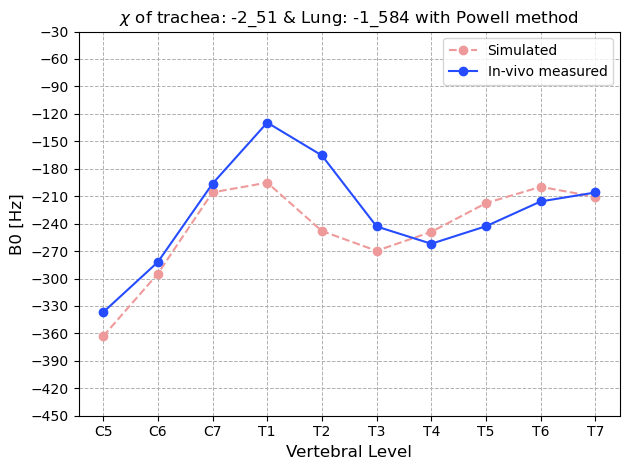

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #145
Chi internal air = 0.27
Vol_air Tr:  0.7000622317954686
Vol_air_lungs: 0.7999999985109223
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005569063876


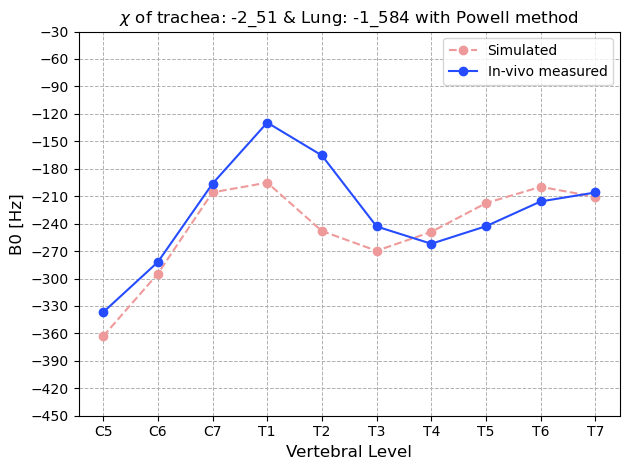

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #146
Chi internal air = 0.27
Vol_air Tr:  0.7764282054826115
Vol_air_lungs: 0.7999796755006294
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-1_803_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-1_803_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-1_803_l_-1_584_Hz.csv


Difference:  291.98911051003734


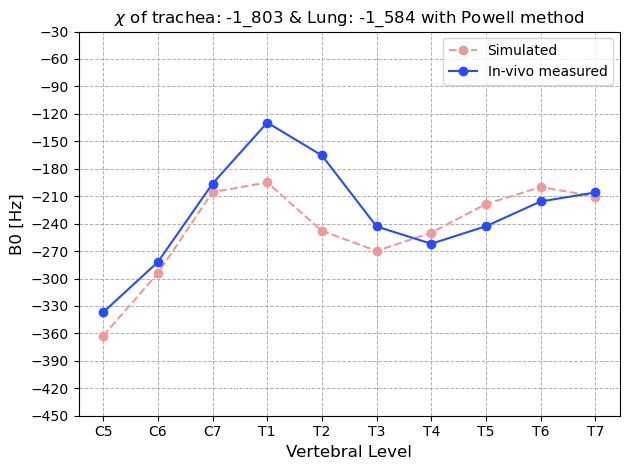

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #147
Chi internal air = 0.27
Vol_air Tr:  0.823628430937436
Vol_air_lungs: 0.7999671142692141
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-1_365_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-1_365_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-1_365_l_-1_584_Hz.csv


Difference:  292.17145699804496


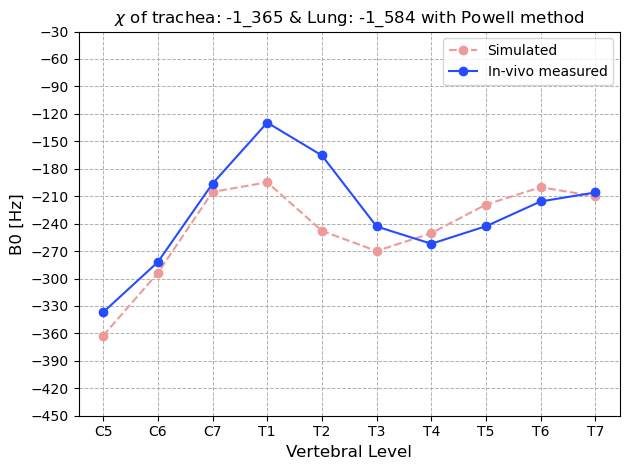

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #148
Chi internal air = 0.27
Vol_air Tr:  0.7472568618748721
Vol_air_lungs: 0.7999874387685847
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_073_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_073_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_073_l_-1_584_Hz.csv


Difference:  291.877940214958


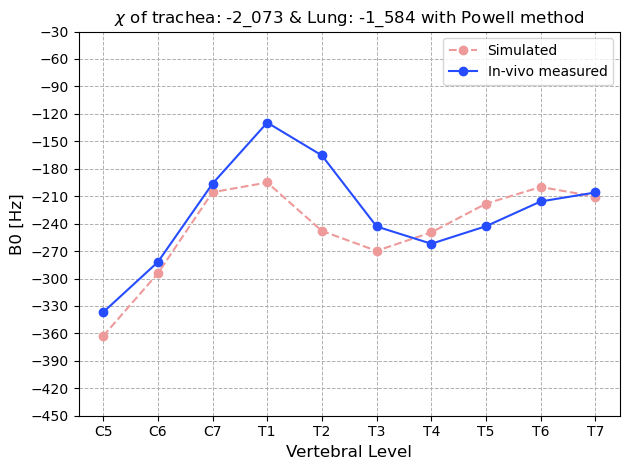

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #149
Chi internal air = 0.27
Vol_air Tr:  0.729227980027787
Vol_air_lungs: 0.7999922367320448
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_24_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_24_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_24_l_-1_584_Hz.csv


Difference:  291.8098168070037


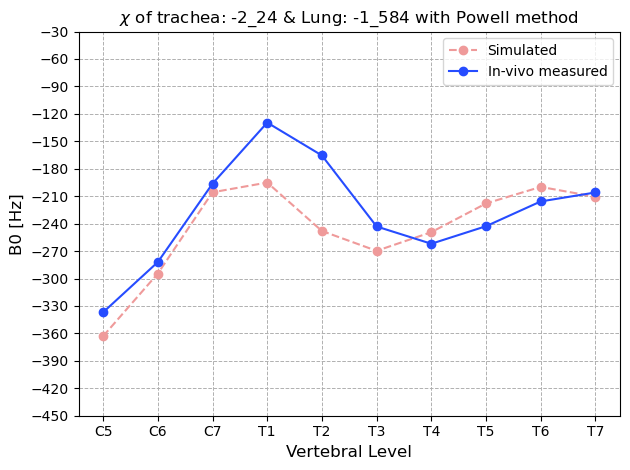

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #150
Chi internal air = 0.27
Vol_air Tr:  0.7180855182671325
Vol_air_lungs: 0.79999520203654
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_343_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_343_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_343_l_-1_584_Hz.csv


Difference:  291.76793731447486


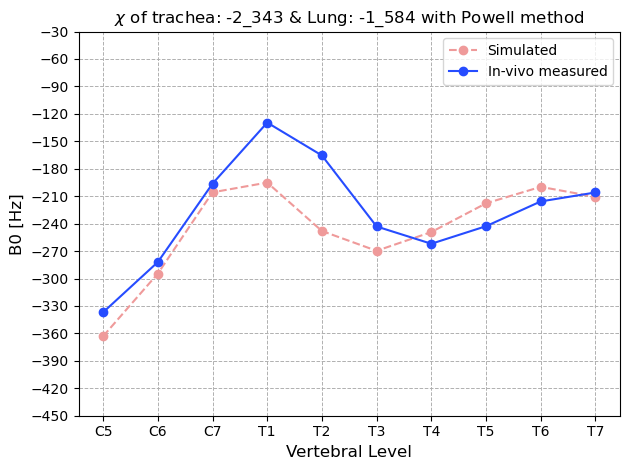

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #151
Chi internal air = 0.27
Vol_air Tr:  0.711199098180702
Vol_air_lungs: 0.7999970346955049
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_407_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_407_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_407_l_-1_584_Hz.csv


Difference:  291.7421396167068


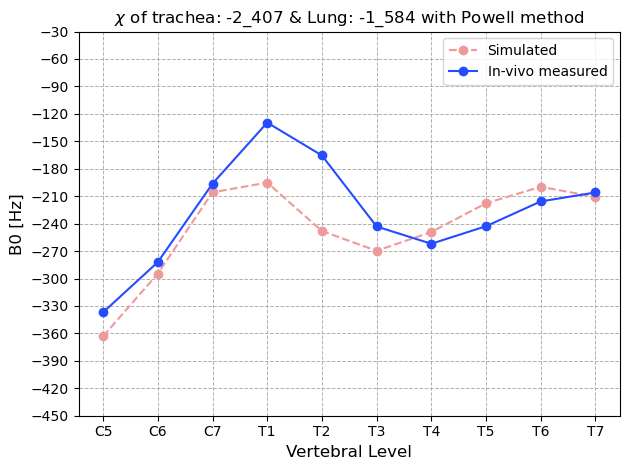

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #152
Chi internal air = 0.27
Vol_air Tr:  0.706943056506478
Vol_air_lungs: 0.799998167341035
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_447_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_447_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_447_l_-1_584_Hz.csv


Difference:  291.7262283353634


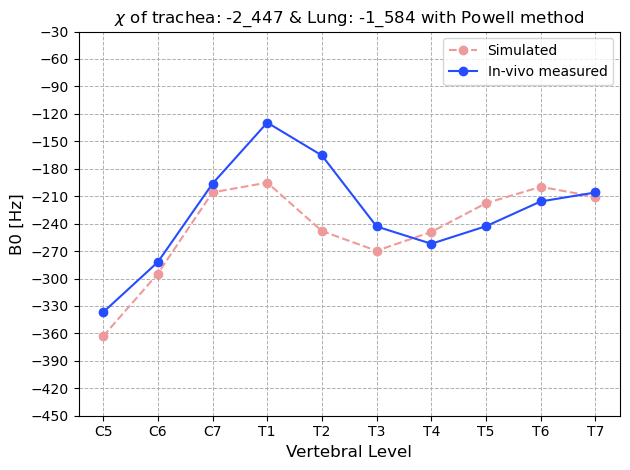

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #153
Chi internal air = 0.27
Vol_air Tr:  0.7043126780942716
Vol_air_lungs: 0.7999988673544699
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_471_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_471_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_471_l_-1_584_Hz.csv


Difference:  291.71640706655296


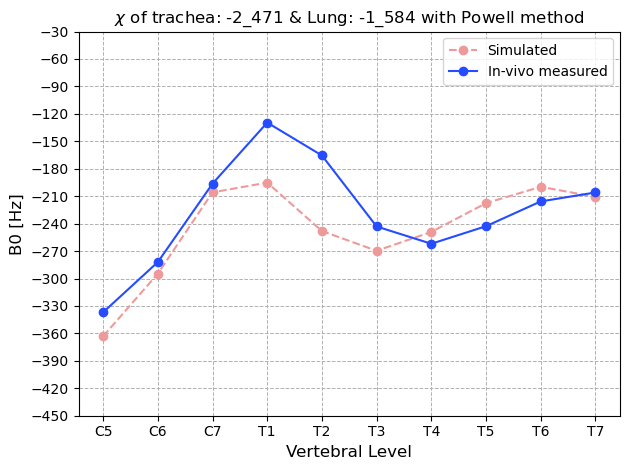

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #154
Chi internal air = 0.27
Vol_air Tr:  0.7026870148322539
Vol_air_lungs: 0.7999992999865652
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_486_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_486_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_486_l_-1_584_Hz.csv


Difference:  291.7103419422667


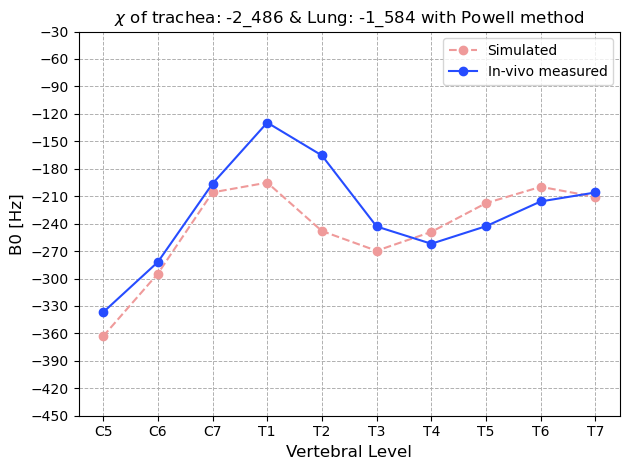

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #155
Chi internal air = 0.27
Vol_air Tr:  0.7016822996820651
Vol_air_lungs: 0.7999995673679048
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_495_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_495_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_495_l_-1_584_Hz.csv


Difference:  291.7065953051673


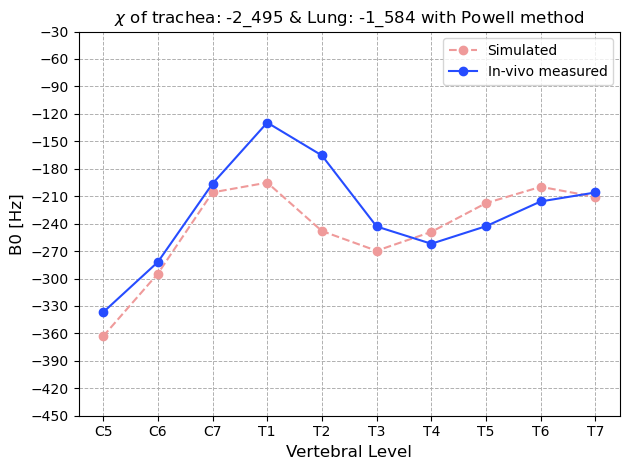

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #156
Chi internal air = 0.27
Vol_air Tr:  0.7010613515702364
Vol_air_lungs: 0.7999997326186605
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_501_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_501_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_501_l_-1_584_Hz.csv


Difference:  291.7042804497201


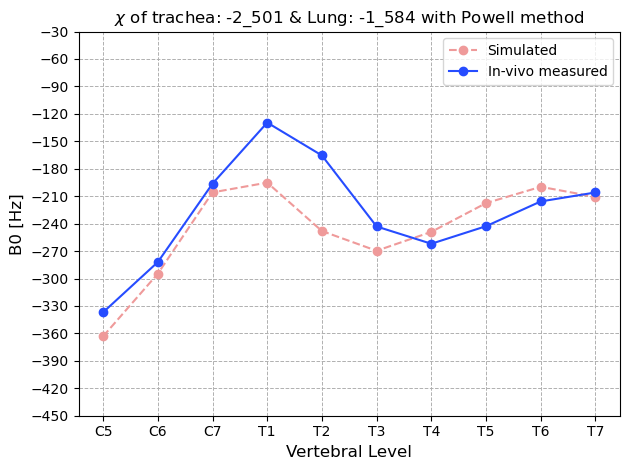

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #157
Chi internal air = 0.27
Vol_air Tr:  0.7006775845318762
Vol_air_lungs: 0.7999998347492443
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_505_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_505_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_505_l_-1_584_Hz.csv


Difference:  291.7028500553223


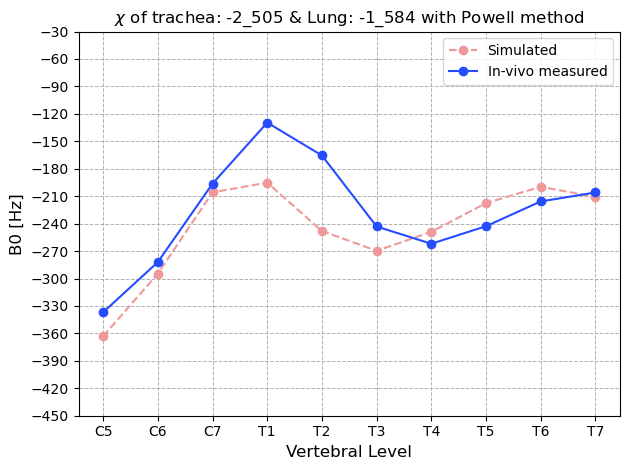

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #158
Chi internal air = 0.27
Vol_air Tr:  0.7004404034584077
Vol_air_lungs: 0.7999998978694163
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_507_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_507_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_507_l_-1_584_Hz.csv


Difference:  291.70196612416964


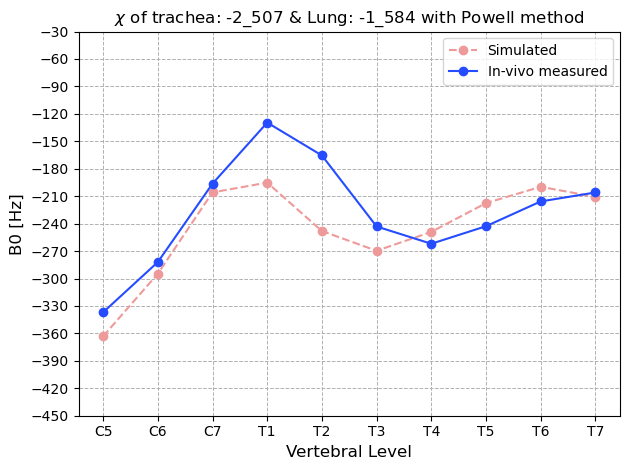

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #159
Chi internal air = 0.27
Vol_air Tr:  0.700293817493516
Vol_air_lungs: 0.799999936879828
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_508_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_508_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_508_l_-1_584_Hz.csv


Difference:  291.7014198633301


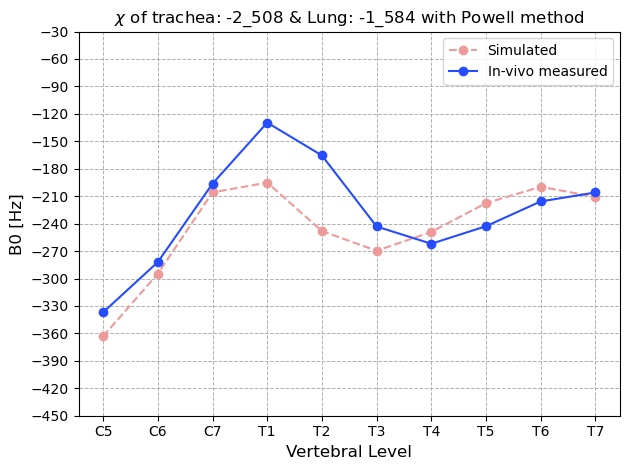

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #160
Chi internal air = 0.27
Vol_air Tr:  0.7002032223849393
Vol_air_lungs: 0.7999999609895884
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_509_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_509_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_509_l_-1_584_Hz.csv


Difference:  291.7010822703299


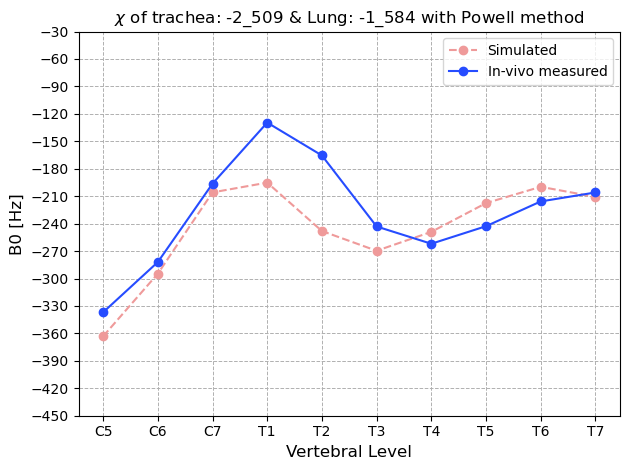

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #161
Chi internal air = 0.27
Vol_air Tr:  0.7001472315286242
Vol_air_lungs: 0.7999999758902397
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.70087363202134


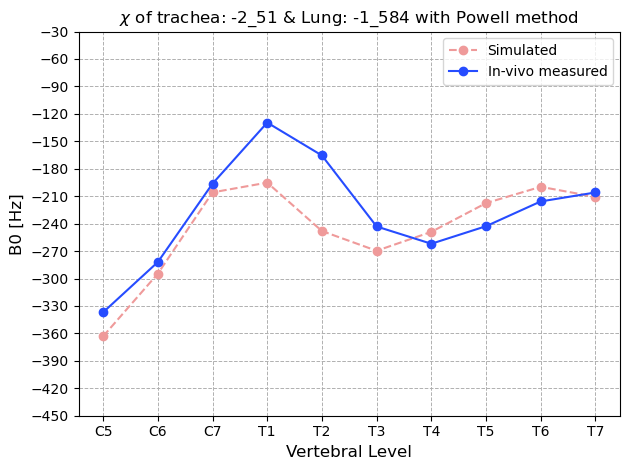

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #162
Chi internal air = 0.27
Vol_air Tr:  0.7001126272763625
Vol_air_lungs: 0.7999999850993487
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.70074468860963


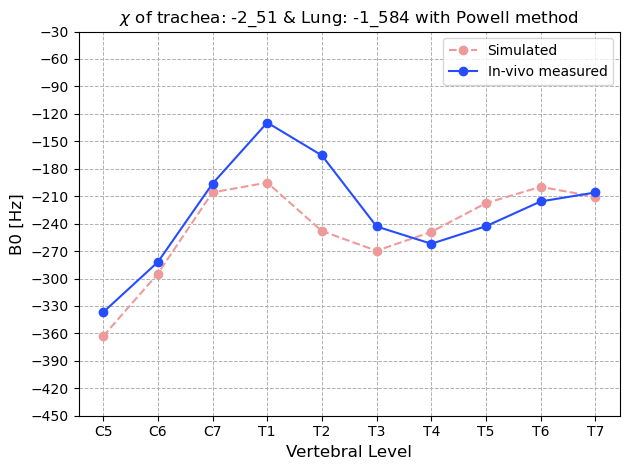

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #163
Chi internal air = 0.27
Vol_air Tr:  0.7000912406723093
Vol_air_lungs: 0.799999990790891
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7006649980214


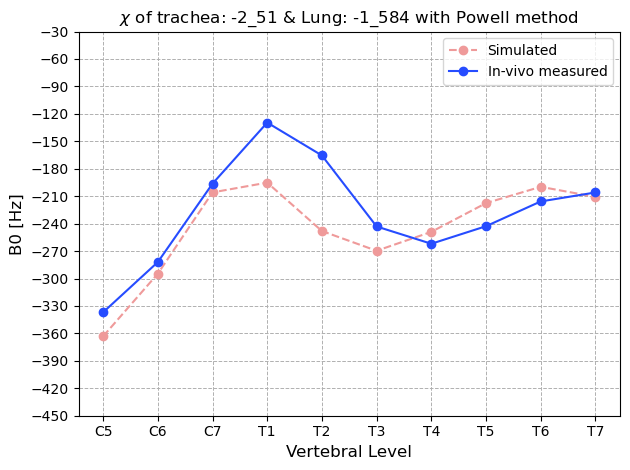

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #164
Chi internal air = 0.27
Vol_air Tr:  0.7000780230241006
Vol_air_lungs: 0.7999999943084577
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.70061574684354


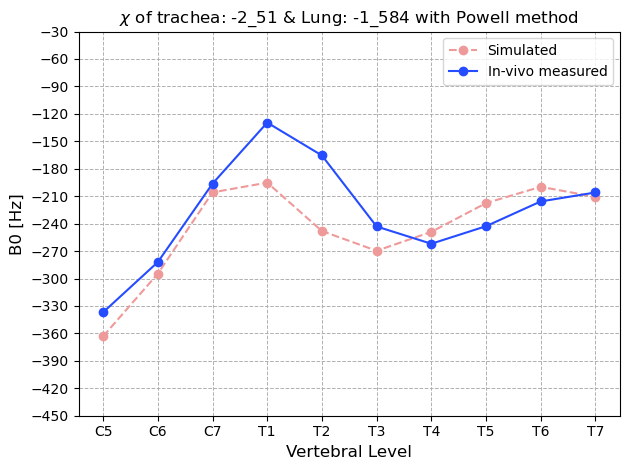

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #165
Chi internal air = 0.27
Vol_air Tr:  0.7000698540682563
Vol_air_lungs: 0.7999999964824334
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005853080617


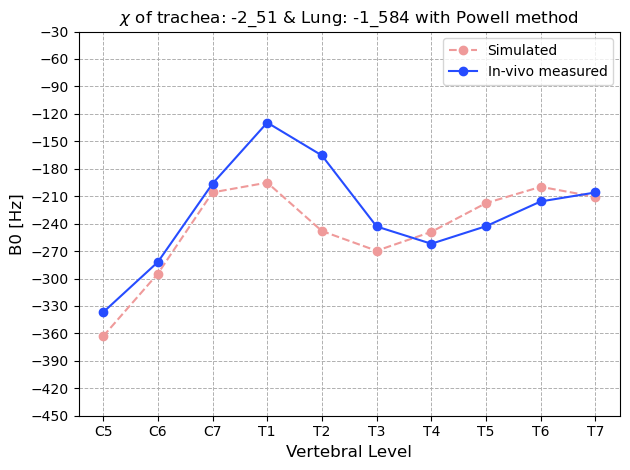

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #166
Chi internal air = 0.27
Vol_air Tr:  0.7000648053758919
Vol_air_lungs: 0.7999999978260243
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.70056649590595


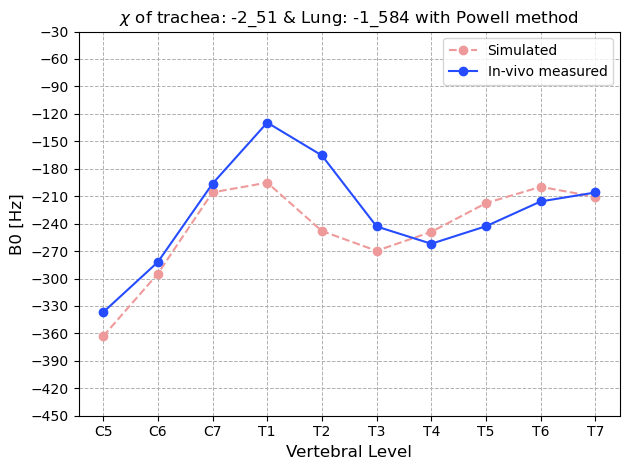

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #167
Chi internal air = 0.27
Vol_air Tr:  0.700061685112412
Vol_air_lungs: 0.7999999986564091
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005548693717


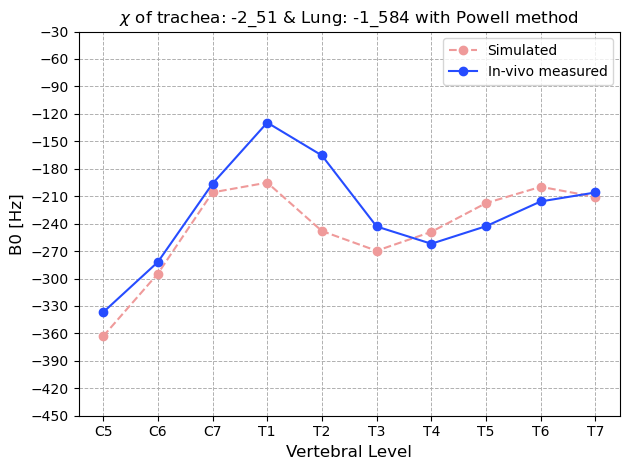

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #168
Chi internal air = 0.27
Vol_air Tr:  0.7000597566835275
Vol_air_lungs: 0.7999999991696152
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.70054768378503


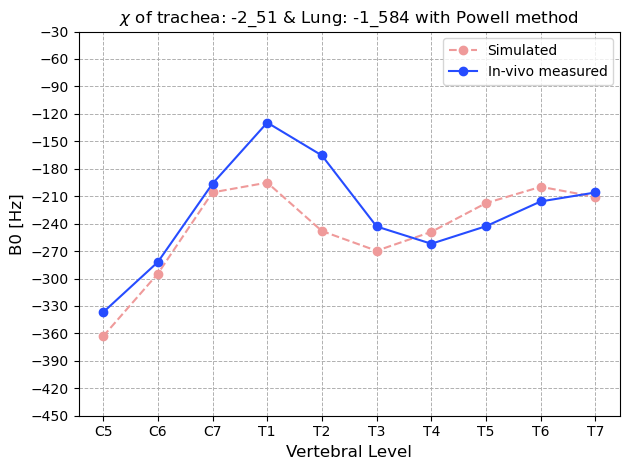

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #169
Chi internal air = 0.27
Vol_air Tr:  0.700058564848932
Vol_air_lungs: 0.799999999486794
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.70054324285076


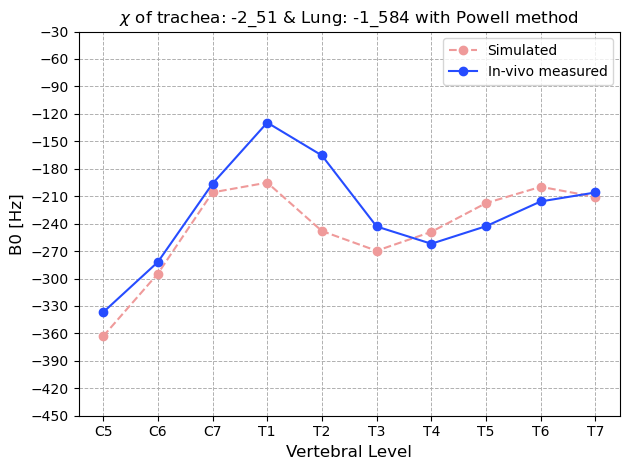

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #170
Chi internal air = 0.27
Vol_air Tr:  0.700057828254643
Vol_air_lungs: 0.7999999996828212
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005404982034


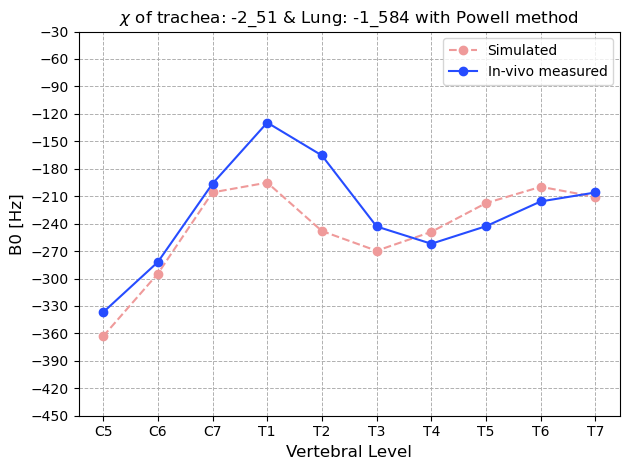

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #171
Chi internal air = 0.27
Vol_air Tr:  0.7000573730143365
Vol_air_lungs: 0.7999999998039727
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005388019185


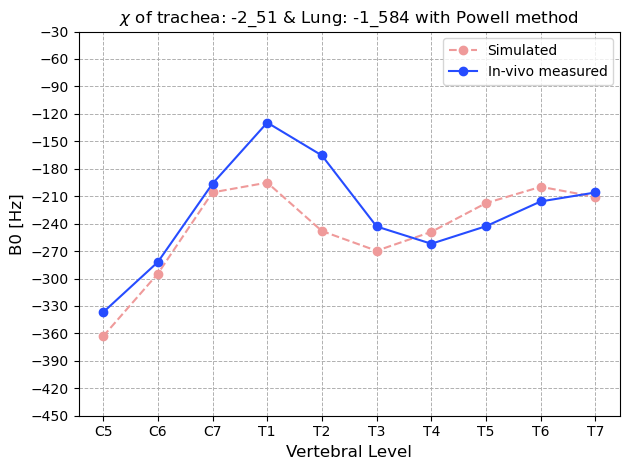

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #172
Chi internal air = 0.27
Vol_air Tr:  0.700057091660354
Vol_air_lungs: 0.7999999998788485
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005377535569


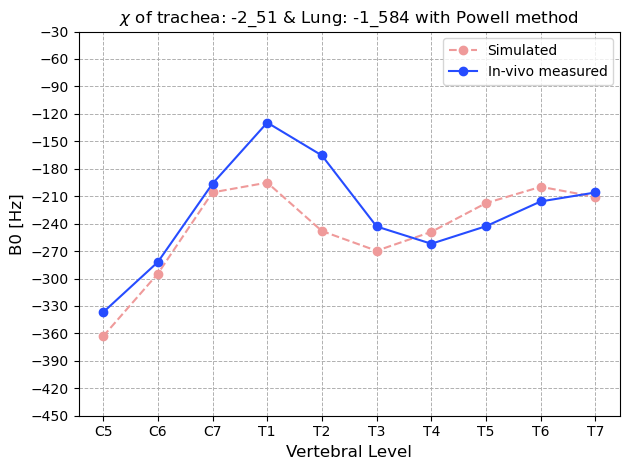

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #173
Chi internal air = 0.27
Vol_air Tr:  0.70005691777403
Vol_air_lungs: 0.7999999999251243
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005371056339


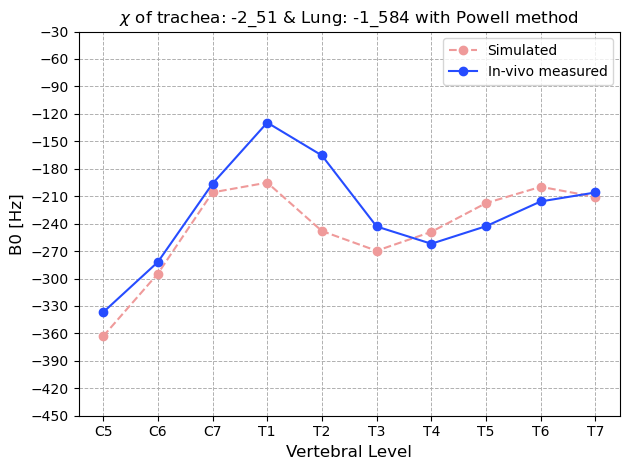

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #174
Chi internal air = 0.27
Vol_air Tr:  0.7000568103063716
Vol_air_lungs: 0.7999999999537243
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005367051955


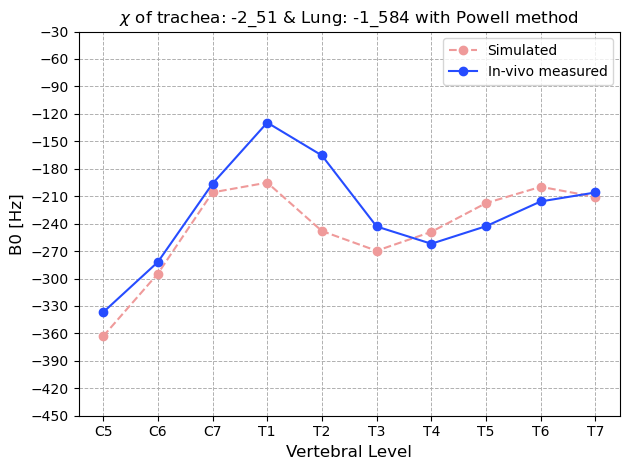

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #175
Chi internal air = 0.27
Vol_air Tr:  0.700056743887706
Vol_air_lungs: 0.7999999999714
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005364577108


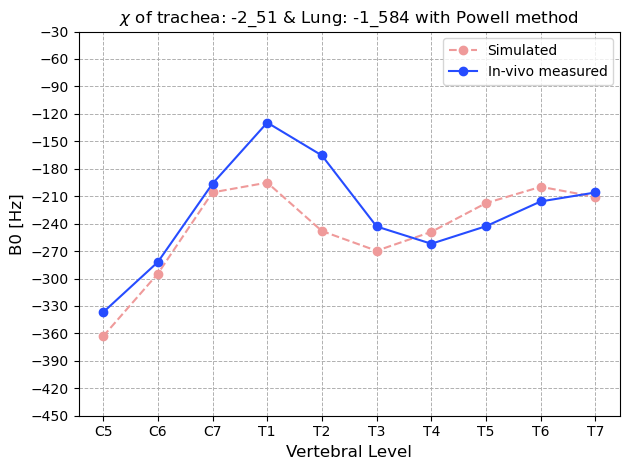

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #176
Chi internal air = 0.27
Vol_air Tr:  0.7000567028387131
Vol_air_lungs: 0.7999999999823243
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.70053630475695


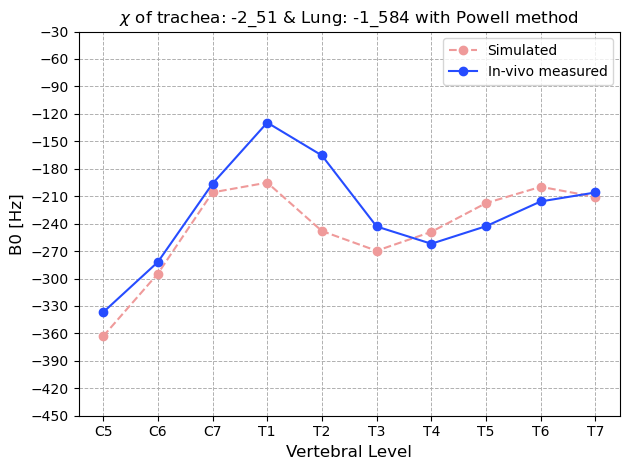

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #177
Chi internal air = 0.27
Vol_air Tr:  0.7000566774690403
Vol_air_lungs: 0.7999999999890758
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.70053621022635


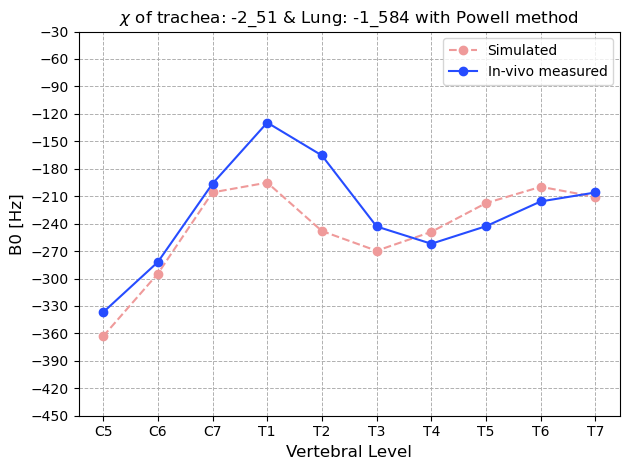

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #178
Chi internal air = 0.27
Vol_air Tr:  0.7000566617897203
Vol_air_lungs: 0.7999999999932486
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.70053615180313


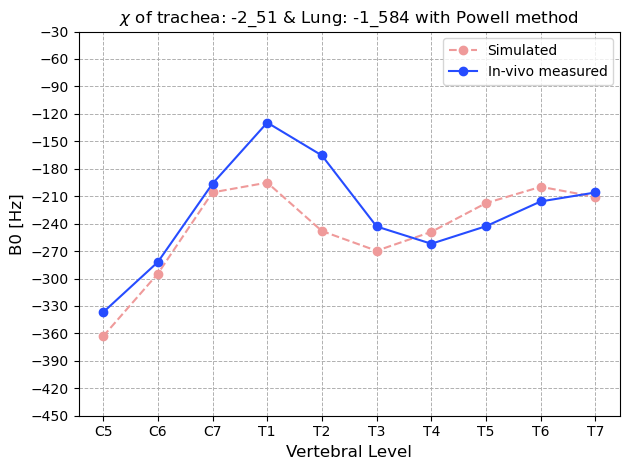

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #179
Chi internal air = 0.27
Vol_air Tr:  0.7000566520993676
Vol_air_lungs: 0.7999999999958274
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.70053611569557


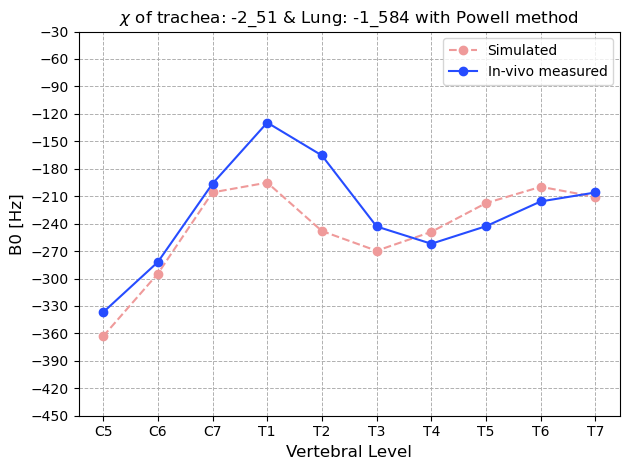

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #180
Chi internal air = 0.27
Vol_air Tr:  0.7000566461104002
Vol_air_lungs: 0.7999999999974212
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005360933799


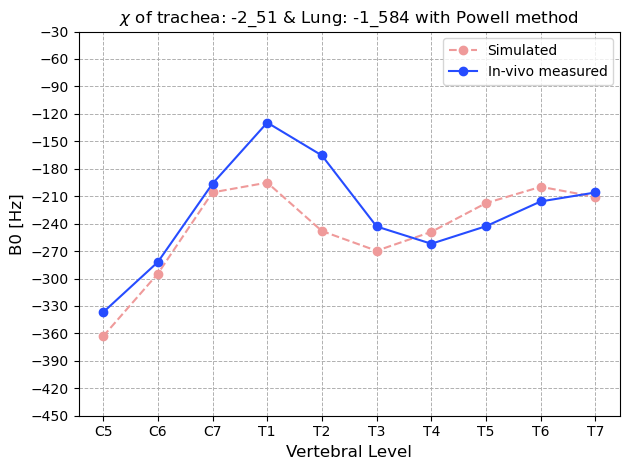

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #181
Chi internal air = 0.27
Vol_air Tr:  0.7000566424090149
Vol_air_lungs: 0.7999999999984062
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.700536079588


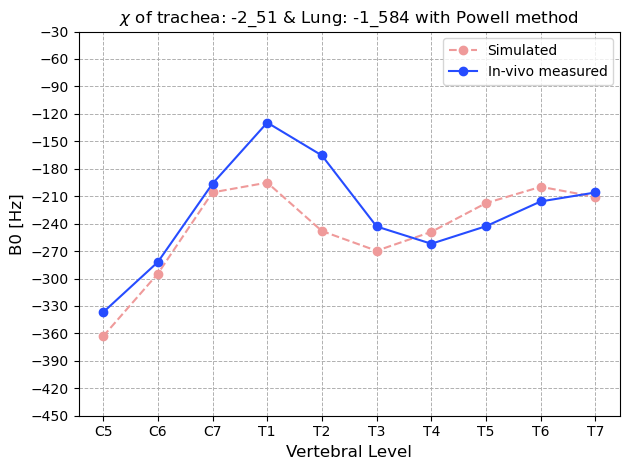

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #182
Chi internal air = 0.27
Vol_air Tr:  0.7000566401214329
Vol_air_lungs: 0.799999999999015
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005360710643


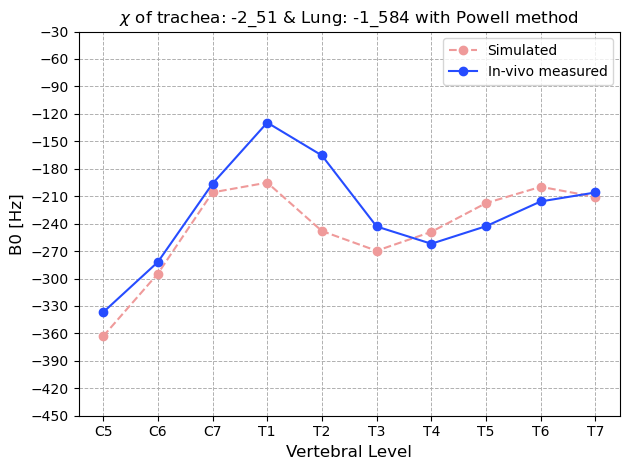

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #183
Chi internal air = 0.27
Vol_air Tr:  0.7000566387076295
Vol_air_lungs: 0.7999999999993913
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005360657963


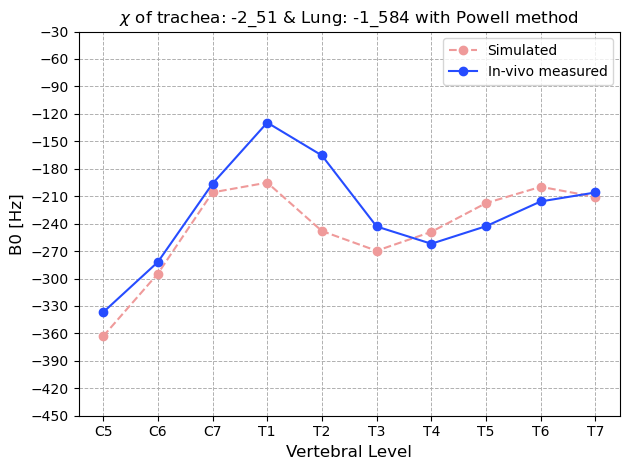

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #184
Chi internal air = 0.27
Vol_air Tr:  0.700056637833851
Vol_air_lungs: 0.7999999999996238
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.70053606254044


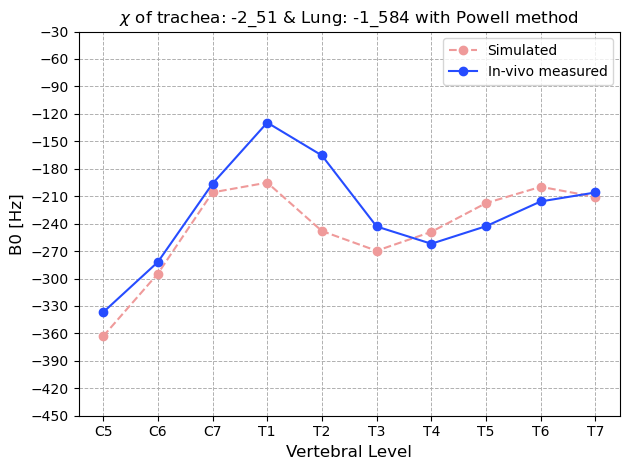

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #185
Chi internal air = 0.27
Vol_air Tr:  0.7000566372938261
Vol_air_lungs: 0.7999999999997676
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.70053606052824


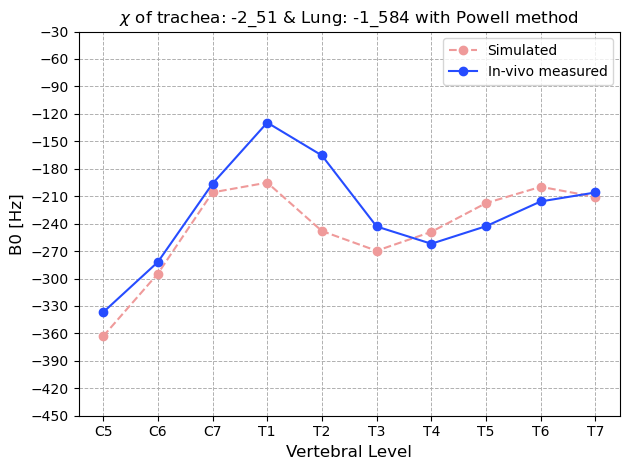

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #186
Chi internal air = 0.27
Vol_air Tr:  0.7000566369600724
Vol_air_lungs: 0.7999999999998564
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005360592847


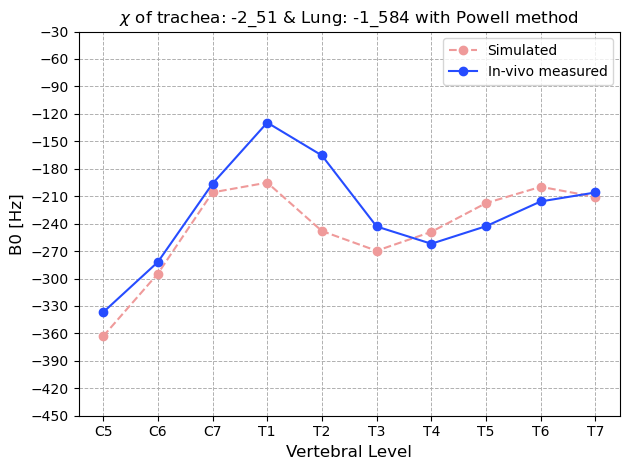

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #187
Chi internal air = 0.27
Vol_air Tr:  0.7000566367538013
Vol_air_lungs: 0.7999999999999112
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005360585161


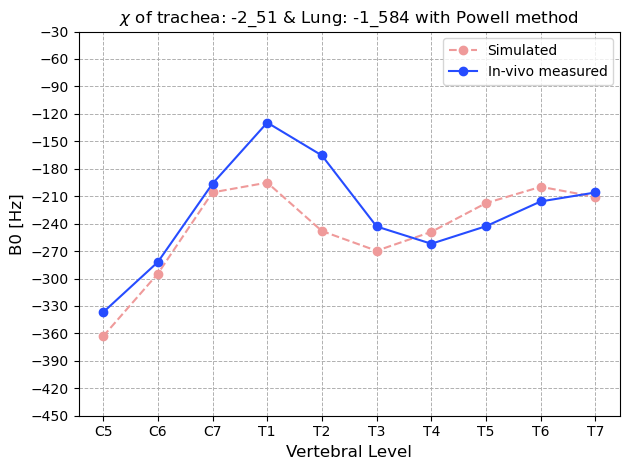

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #188
Chi internal air = 0.27
Vol_air Tr:  0.7000566366263187
Vol_air_lungs: 0.7999999999999452
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.7005360580411


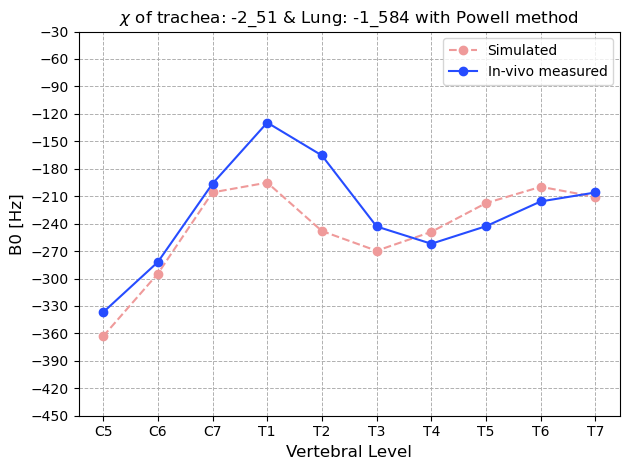

$$$$$$$$$$$$$$$$$$$$$$$$$
Iteration #189
Chi internal air = 0.27
Vol_air Tr:  0.7000566365345685
Vol_air_lungs: 0.7999999999999695
Metrics extracted successfully: 
--
Spinal Cord Toolbox (6.5)

sct_extract_metric -i E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_fms\run2_Powell\sim_fm_tr_-2_51_l_-1_584_Hz.nii.gz -f E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask.nii.gz -method wa -vert 5:14 -vertfile E:/msc_data/ismrm_2025/db0_032/fm/sim/D2_D3_masks/cord_mask_labeled.nii.gz -perlevel 1 -o E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv
--


Load metric image...
Estimation for label: cord_mask

Done! To view results, type:
start E:/msc_data/ismrm_2025/dB0_032/fm/chi-opt2/iteration_metrics\run2_Powell\metrics_sim_fm_tr_-2_51_l_-1_584_Hz.csv


Difference:  291.70053605769914


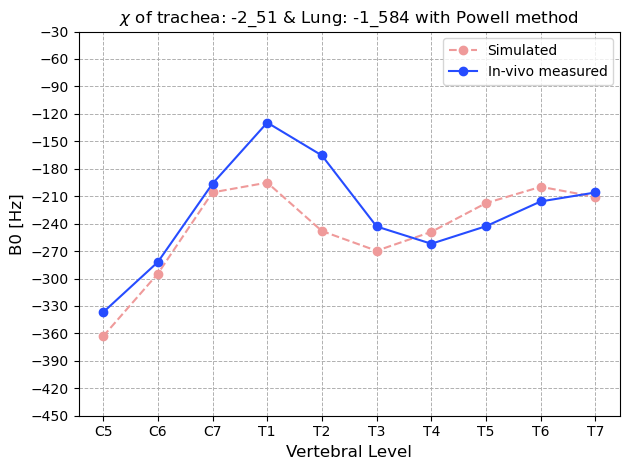

Optimization result:  message: Optimization terminated successfully.
 success: True
  status: 0
     fun: 291.70053605769914
       x: [ 7.001e-01  8.000e-01]
     nit: 3
   direc: [[ 1.425e-05  4.277e-05]
           [ 2.750e-06 -7.319e-10]]
    nfev: 189
######## ############## ############### #############


<Figure size 640x480 with 0 Axes>

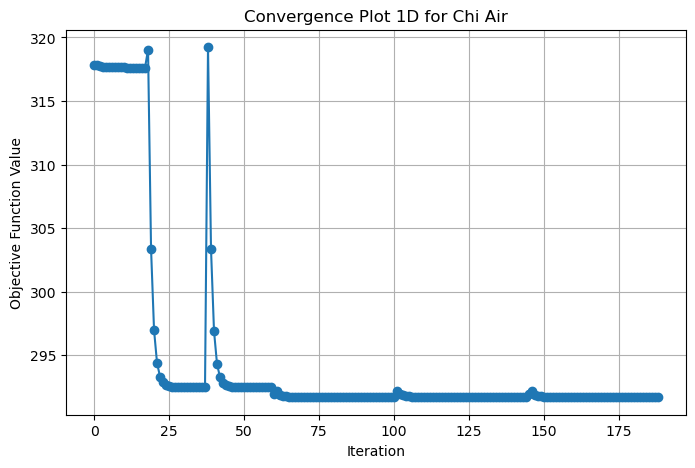

In [18]:
# Set initial values, boundaries and run optimization
initial_values = [0.8, 0.5] # Body should begin
# First bound is trachea // Depends on objective code !!!
# Second bound is Lung // Depends on objective code !!!
# Check the MD above!
bounds = [(0.7, 0.9), (0.3, 0.8)]

if counter != 0 :
        # This means that you forgot to change the folder run number, to avoid mixing tests, please run that cell 
        # Changing the number after run!
    print("Please change run # to avoid mixing result folders :)")
else:
    if not os.path.exists(path_to_iter_fms) or not os.path.exists(path_to_iter_metrics):
        print("Creating run folders")
        os.makedirs(path_to_iter_fms)
        os.makedirs(path_to_iter_metrics)
        print("Folders created: ", path_to_iter_fms)
    
    result = optimize.minimize(f_iair_vol_avg_resp_plot, initial_values, bounds = bounds, method = 'Powell')

    # Output the result
    print("Optimization result:", result)
    print("######## ############## ############### #############")

    plt.figure()
    chi_values_range = np.linspace(-1, 0.5, 100)

    plt.figure(figsize=(8, 5))
    plt.plot(history, marker='o', linestyle='-')
    plt.xlabel("Iteration")
    plt.ylabel("Objective Function Value")
    plt.title("Convergence Plot 1D for Chi Air")
    plt.grid()
    plt.show()

In [89]:
os.path.exists(path_to_iter_dmod_fms)

True

In [ ]:
# 

# <span style="color:chocolate"> *Plot and compare!* </span> 

In [42]:
# Load specific metrics by name, from output log
run2_iter20 = pd.read_csv("E:/msc_data/ismrm_2025/db0_032/fm/chi-opt/iteration_metrics/run2/metrics_sim_fm_tr_-5_16_l_-0_389_Hz.csv")
run2_iter20_values = run2_iter20["WA()"]
run2_iter20_values = run2_iter20_values[::-1]

In [54]:
run4_last_iter = pd.read_csv("E:/msc_data/ismrm_2025/db0_032/fm/chi-opt/iteration_metrics/run4/metrics_sim_fm_tr_-5_0_l_-0_575_Hz.csv")
run4_last_iter_vals = run4_last_iter["WA()"]
run4_last_iter_vals = run4_last_iter_vals[::-1]

In [70]:
# One with x lung far from that range
run6 = pd.read_csv("E:/msc_data/ismrm_2025/db0_032/fm/chi-opt/iteration_metrics/run6/metrics_sim_fm_tr_-2_0_l_1_0_Hz.csv")
run6_values = run6["WA()"][::-1]

In [106]:
run7 = pd.read_csv("E:/msc_data/ismrm_2025/db0_032/fm/chi-opt/iteration_metrics/run7/metrics_sim_fm_tr_-2_0_l_0_0_Hz.csv")
run7_values = run7["WA()"][::-1]
run7_values

12   -179.632875
11   -142.424619
10    -76.976387
9      -0.345025
8      93.837069
7      89.462894
6       7.859834
5     -26.918593
4      -4.591906
3      32.335572
2      53.256685
1      41.671918
0      39.592175
Name: WA(), dtype: float64

In [107]:
first_run7 = pd.read_csv("E:/msc_data/ismrm_2025/db0_032/fm/chi-opt/iteration_metrics/run7\metrics_sim_fm_tr_-1_5_l_-4_36_Hz.csv")
first_run7_vals = first_run7["WA()"][::-1]
first_run7_vals

<>:1: SyntaxWarning: invalid escape sequence '\m'
<>:1: SyntaxWarning: invalid escape sequence '\m'
C:\Users\User\AppData\Local\Temp\ipykernel_49552\3367052066.py:1: SyntaxWarning: invalid escape sequence '\m'
  first_run7 = pd.read_csv("E:/msc_data/ismrm_2025/db0_032/fm/chi-opt/iteration_metrics/run7\metrics_sim_fm_tr_-1_5_l_-4_36_Hz.csv")


12   -219.740118
11   -189.120055
10   -135.339877
9     -74.304475
8      13.790056
7      51.663695
6      43.468552
5      41.938307
4      59.908588
3      84.494172
2     100.697910
1      91.271720
0      81.204982
Name: WA(), dtype: float64

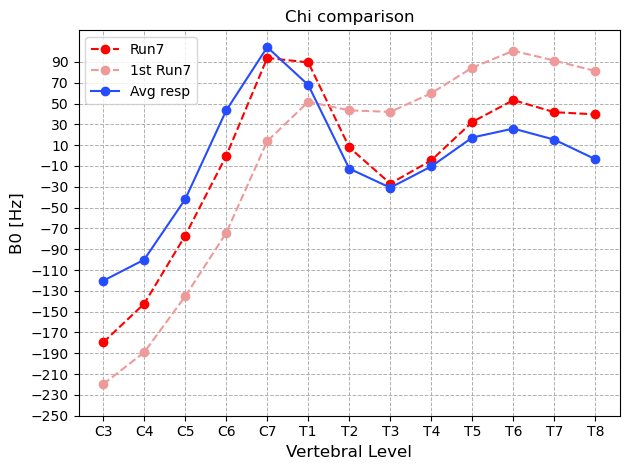

In [121]:
# We already have the cervical level and measured, 
# Copy the last (or any) fm metric name from SCT result

#final_dmod = pd.read_csv("E:/msc_data/ismrm_2025/db0_032/fm/chi-opt/iteration_metrics\metrics_sim_fm_tr_-14_0_l_-0_277_Hz.csv")
final_dmod = pd.read_csv("E:/msc_data/ismrm_2025/db0_032/fm/chi-opt/iteration_metrics/run2/metrics_sim_fm_tr_-9_0_l_-0_443_Hz.csv")

dmod_sim_vert_values = final_dmod["WA()"]
dmod_sim_vert_values = dmod_sim_vert_values[::-1]

vertebrae_levels = ['C3', 'C4', 'C5', 'C6', 'C7', 'T1', 'T2', 'T3', 'T4', 'T5', 'T6', 'T7','T8'] # From 3 to 15


#plt.plot(vertebrae_levels, dmod_b0meas_vert_values, marker = 'x', linestyle = '-', label = "Measured Exp", color = "#ff4900") 
#plt.plot(vertebrae_levels, dmod_sim_vert_values, marker = 'o', linestyle = '--', label = "Run1", color = "#33C3FF") 
#plt.plot(vertebrae_levels, run6_values, marker = 'o', linestyle = '--', label = "Run6", color = "#FBC02D") 
plt.plot(vertebrae_levels, run7_values, marker = 'o', linestyle = '--', label = "Run7", color = "red") 
plt.plot(vertebrae_levels, first_run7_vals, marker = 'o', linestyle = '--', label = "1st Run7", color = "#EF9A9A") 
#plt.plot(vertebrae_levels, run4_last_iter_vals, marker = 'o', linestyle = '--', label = "Run4", color = "#81C784") 
plt.plot(vertebrae_levels, avg_resp_b0meas_values, marker = 'o', linestyle = '-', label = "Avg resp", color = "#264cff") 

# Adding expiration and inspiration measured values
#plt.plot(vertebrae_levels, exp_metrics_data_comp, marker = 'o', linestyle = '-', label = "Expiration B0 measured", color = "#ff4900")
#plt.plot(vertebrae_levels, insp_metrics_data_comp, marker = 'o', linestyle = '-', label = "Inspiration B0 measured", color = "#ffad00")
#plt.plot(vertebrae_levels, avg_respiration, marker = 'o', linestyle = ':', label = "Avg respiratin B0 meas", color = "#264cff")
plt.title("Chi comparison")
plt.xlabel('Vertebral Level', fontsize=12)
plt.ylabel('B0 [Hz]', fontsize=12)
plt.legend()

yticks = range(-250, 101, 20) 
plt.yticks(yticks)


# Customize grid and display
plt.grid(True, which='both', linestyle='--', linewidth=0.7)
plt.tight_layout()

# Show the plot
plt.show()

In [2]:
dir ()

['In',
 'Out',
 '_',
 '__',
 '___',
 '__builtin__',
 '__builtins__',
 '__doc__',
 '__loader__',
 '__name__',
 '__package__',
 '__spec__',
 '__vsc_ipynb_file__',
 '_dh',
 '_exit_code',
 '_i',
 '_i1',
 '_i2',
 '_ih',
 '_ii',
 '_iii',
 '_oh',
 'exit',
 'get_ipython',
 'open',
 'quit']